In [1]:
import numpy as np
import scipy
import random
import pandas as pd
import pickle
import seaborn.objects as so
import hashlib
import matplotlib.pyplot as plt

import seaborn as sns
from scipy.stats import ttest_ind
import scipy.stats as stats   

from IPython.display import display, HTML

In [2]:
class MetricManager:
    def __init__(self, metrics):
        """
        Inits the MetricManager

        Variables:
         - metrics: list of all metrics in form of a list of single runs
         - runs: parameters for the single runs extracted from the complete metrics
        """
        self.metrics = metrics.copy()
        self.set_perfect()
        self.full_metrics = self.metrics.copy()

        self.runs = pd.DataFrame(metrics).drop(["expert metrics", "verma", "hemmer", "artificial expert predictions"], axis=1)

        self.l2d_dfs = {
            "verma": {},
            "hemmer": {}
        }

        self.metric_dfs= {
            "verma": {},
            "hemmer": {}
        }

    def return_metrics_with_two(self):
        temp_metrics = []
        for run in self.metrics:
            if len(run["labeler_ids"]) == 2:
                temp_metrics.append(run)
        return temp_metrics

    def set_experts(self, labeler_ids):
        self.metrics = self.full_metrics.copy()

        remove_index = []
        for i in range(len(self.metrics)):
            if self.metrics[i]["labeler_ids"] != labeler_ids:
                remove_index.append(i)
        for i in remove_index[::-1]:
            del self.metrics[i]

        self.runs = pd.DataFrame(self.metrics).drop(["expert metrics", "verma", "hemmer", "artificial expert predictions"], axis=1)

    def set_perfect(self):
        labeler_used = []
        for i in range(len(self.metrics)):
            if self.metrics[i]["setting"] == "PERFECT":
                if self.metrics[i]["labeler_ids"] not in labeler_used:
                    for sample_equal in [True, False]:
                        for overlap in [0, 100]:
                            for expert_predict in ["target", "right"]:
                                new_metric = self.metrics[i].copy()
                                new_metric["overlap"] = overlap
                                new_metric["sample_equal"] = sample_equal
                                new_metric["expert_predict"] = expert_predict
                                self.metrics.append(new_metric)
                    labeler_used.append(self.metrics[i]["labeler_ids"])

        self.runs = pd.DataFrame(self.metrics).drop(["expert metrics", "verma", "hemmer", "artificial expert predictions"], axis=1)
        

    def get_dataframe_specific_run(self, run, method, seed, fold, step):
        """
        Returns a DataFrame for a given method of one (run, seed, fold) combination
        Step specifies the evaluation step (val, test)
        """
        if method == "verma":
            return self.create_dataframe_verma(run, seed, fold, step)
        if method == "hemmer":
            return self.create_dataframe_hemmer(run, seed, fold, step)

    def create_dataframe_verma(self, run, seed, fold, step):
        """
        Creates a dataframe which contains all metrics for verma for a given run, seed, fold and step

        Result is a DataFrame with every metric for the (run, seed, fold) combination
        """
        #Drops redundant columns
        df = pd.DataFrame(self.metrics[run]["verma"][seed][fold][step]).drop(["acc_experts", "cov_experts"], axis=0).T
        #Extract the number of images from coverage text
        df["coverage"] = df["coverage"].apply(lambda x: getCountOfCoverage(x))
        df["coverage_frac"] = df.apply(lambda x: x["cov_classifier"]/x["coverage"], axis=1)
        #df.rename(columns={'coverage':'n_images'}, inplace=True)
        return df

    def create_dataframe_hemmer(self, run, seed, fold, step):
        """
        Creates a dataframe which contains all metrics for hemmer for a given run, seed, fold and step

        Result is a DataFrame with every metric for the (run, seed, fold) combination
        """
        df = pd.DataFrame(self.metrics[run]["hemmer"][seed][fold][step]).T
        #Get the absolute number of images from the same combination from verma
        n_images = getCountOfCoverage(self.metrics[run]["verma"][seed][fold][step][0]["coverage"])
        #Extracts the experts ids
        experts = [column[7:] for column in df.columns if "Expert" in column]
        #Converts the percentage of coverage to absolute number
        df["Classifier Coverage"] = n_images * df["Classifier Coverage"]
        df["system_accuracy"] = df["system_accuracy"] * 100
        #Create metrics for every expert from list elements
        for expert in experts:
            df[f"{expert} Accuracy"] = [row["expert_accuracy"] for row in df[f"Expert_{expert}"]]
            df[f"{expert} Subset Accuracy"] = [row["expert_task_subset_accuracy"] for row in df[f"Expert_{expert}"]]
            df[f"{expert} Coverage"] = [n_images * row["expert_coverage"] for row in df[f"Expert_{expert}"]]
            df = df.drop([f"Expert_{expert}"], axis=1)
        return df

    def create_l2d_dataframe(self, method, step):
        """
        Creates a multiindex dataframe which contains all metrics for a L2D method and given step

        Result is a multiindex df (run, seed, fold)
        """
        dict_run = {}
        #Iterate over all runs
        for run in range(len(self.metrics)):
            dict_seed = {}
            #Iterate over all seeds
            for seed, val1 in self.metrics[run][method].items():
                dict_fold = {}
                #Iterate over every fold
                for fold, element in self.metrics[run][method][seed].items():
                    #Add metric for this (run, seed, fold) combination to the fold_dict
                    dict_fold[f"Fold_{fold}"] = self.get_dataframe_specific_run(run, method, seed, fold, step)
                #Create DataFrame for all folds in this (run, seed) combination
                df_seed = pd.concat(dict_fold)
                dict_seed[f"Seed_{seed}"] = df_seed
            #Create DataFrame for all seeds in this run
            df_run = pd.concat(dict_seed)
            dict_run[f"Run_{run}"] = df_run
        #Create DataFrame for all runs
        df_test = pd.concat(dict_run)
        return df_test

    def get_l2d_dataframe(self, method, step):
        """
        Returns the needed df

        Stores created dfs to speed up the process
        """
        if step not in self.l2d_dfs[method]:
            self.l2d_dfs[method][step] = self.create_l2d_dataframe(method, step)
        return self.l2d_dfs[method][step]

    def create_metric_dataframe(self, df, metric_name, method):
        """
        Creates the df for a L2D method and a specified aggregation method

        It chooses the metric from the single training step where the model had the best validation accuracy

        Current implemented are max for the aggregation of a (run, seed, fold) combination
        """
        #Only get the wanted metric
        dff = df[[metric_name]]

        #Get the indices where the model had the best validation accuracy
        #Matrix in form of columns=runs, rows=(seed + fold) (row index is range(len(seeds, folds combinations))
        indices = self.get_best_model_indices(method)

        #Get the indices for the complete dataframe (multiindex) in formate (run, seed, fold)
        index = dff.index
        #Get list of unique runs
        index_runs = index.get_level_values(0).drop_duplicates()
        #index_seeds = index.get_level_values(1).drop_duplicates()
        #index_folds = index.get_level_values(2).drop_duplicates()

        values = {}
        run_count = 0
        #Iterrate over all runs
        for run in index_runs:
            run_list = []
            count = 0
            #Get list of unique seeds in the current run
            index_seeds = dff.loc[run].index.get_level_values(0).drop_duplicates()
            #Iterrate over all seeds in the current run
            for seed in index_seeds:
                #Get list of qunique folds in the current run
                index_folds = dff.loc[(run, seed)].index.get_level_values(0).drop_duplicates()
                #Itterate over every fold in the current (run, seed) combination
                for fold in index_folds:
                    #Append the value from the current (run, seed, fold) combination on position indices.iloc[count, run_count] 
                    # (which is the training step from (run, seed, fold) where the model had the best val accuracy
                    run_list.append(dff.loc[(run, seed, fold, indices.iloc[count, run_count])][0])
                    #increases the parameter for index selection
                    count += 1
                values[run] = run_list
            run_count += 1
        #return pd.DataFrame(values)
        return pd.DataFrame(dict([(key, pd.Series(item)) for key, item in values.items()]))

    def get_best_model_indices(self, method):
        """
        Creates a df which contains the training step for every (run, seed, fold) combination in which the model had the best validation accuracy

        Returns a df the form of columns=runs, rows=range(len(seed - fold combinations in this run))
        """
        df = self.get_l2d_dataframe(method, "val") #Get metrics for every run, seed, fold
        dff = df[["system_accuracy"]]
        index = dff.index
        index_runs = index.get_level_values(0).drop_duplicates()

        #Iterrate ofer the complete multiindex df of system accuracy
        values = {}
        for run in index_runs:
            run_list = []
            index_seeds = dff.loc[run].index.get_level_values(0).drop_duplicates()
            for seed in index_seeds:
                index_folds = dff.loc[(run, seed)].index.get_level_values(0).drop_duplicates()
                for fold in index_folds:
                    #Get the index of the step of this (run, seed, fold) combination where the system accuracy is max
                    run_list.append(pd.to_numeric(dff.loc[(run, seed, fold), "system_accuracy"]).idxmax())
            values[run] = run_list
        #Returns df
        return pd.DataFrame(dict([(key, pd.Series(item)) for key, item in values.items()]))

    def get_metric_dataframe(self, method, step, metric_name):
        """
        Returns a dataframe for one metric

        Columns are runs, rows are the max of the L2D systems metric for every fold
        """
        df = self.get_l2d_dataframe(method, step) #Get metrics for every run, seed, fold

        if step not in self.metric_dfs[method]:
            self.metric_dfs[method][step] = {}
        if metric_name not in self.metric_dfs[method][step]:
            self.metric_dfs[method][step][metric_name] = self.create_metric_dataframe(df, metric_name, method)

        return self.metric_dfs[method][step][metric_name].copy()

    def get_metrics_dataframe_cut(self, method, step, metric_name, unwanted_tuple=None):
        """
        Cuts the name and add the posibility to remove unwanted parameter-value pairs
        """
        df = cut_column_name(self.get_metric_dataframe(method, step, metric_name))
        columns = df.columns
        if unwanted_tuple is not None: # Get only indieces of runs without unwanted parameter-value pairs
            columns = [str(el) for el in list(remove_unwanted_runs(self.runs, unwanted_tuple).index)]
        return df.loc[:,columns] #Return metric for every run with applied method to aggregate seeds and folds
        

    def print_metrics(self, df):
        """
        Prints the columns of a drataframe to get all available metrics
        """
        print(df.columns)

    def getRuns(self):
        return self.runs.copy()

In [3]:
def getCountOfCoverage(text):
    """
    Returns the number of images from the verma-metric coverage text
    """
    marker = None
    for j in range(len(text)):
        if text[-j] == "f":
            marker = j -1
    return int(text[-marker:])

def cut_column_name(df):
    """
    Removes the run_ prefix for every column
    """
    columns = [column[4:] for column in df.columns]
    df.columns = columns
    return df

def runs_cost_to_string(df):
    df = df.copy()
    if "cost" in df.columns:
        df["cost"] = df["cost"].apply(lambda x: cost_to_string(x))
    return df

def cost_to_string(cost):
    return str(cost)

def remove_unwanted_runs(df, unwanted_tuples):
    """
    Removes runs which contains unwanted column-value combinations

    Input:
        df - DataFrame which contains all runs
        unwanted_tuples - List of (column, value) pairs which should be removed
    """
    if isinstance(unwanted_tuples, tuple): #Make sure a single tuple doesn't break the code
        unwanted_tuples = [unwanted_tuples]
    dff = df.copy()
    for pair in unwanted_tuples:
        if (pair[0] in dff.columns): #Check if the column exists in the DataFrame
            dff = dff[dff[pair[0]] != pair[1]]
    return dff

def keep_wanted_runs(df, wanted_tuples):
    """
    Removes runs which contains unwanted column-value combinations

    Input:
        df - DataFrame which contains all runs
        unwanted_tuples - List of (column, value) pairs which should be removed
    """
    if isinstance(wanted_tuples, tuple): #Make sure a single tuple doesn't break the code
        wanted_tuples = [wanted_tuples]
    dff = df.copy()
    for pair in wanted_tuples:
        if (pair[0] in dff.columns): #Check if the column exists in the DataFrame
            dff = dff[dff[pair[0]] == pair[1]]
    return dff

In [4]:
def check_all_ttest(df, p=0.05, equal_var=False, plot=False):
    """
    Checks all columns of the dataframe of statistical significance
    """
    matrix = {}
    for i in df.columns:
        row = {}
        for j in df.columns:
            if i == j:
                row[j] = 1
            else:
                res = get_ttest(df.loc[:,[i]], df.loc[:,[j]], equal_var=equal_var)
                row[j] = res.pvalue[0]
        matrix[i] = row

    if plot:
        df = pd.DataFrame(matrix)
        heat = plot_ttests(df)
        return matrix, heat
    return matrix

def get_ttest(value1, value2, equal_var=True):
    res = ttest_ind(value1, value2, equal_var=equal_var, nan_policy="omit")
    #print(res)
    return res

def plot_ttests(df):
    # Draw a heatmap with the numeric values in each cell
    f, ax = plt.subplots(figsize=(25, 11))
    heat = sns.heatmap(df, annot=True, linewidths=.5, ax=ax)
    plt.show()
    return heat

In [5]:
def get_rungroup_name(df_runs, runs_g, var_columns, reverse=False):
    """
    Create names for every run where the runs differentiate in parameters

    Input:
        df_runs: DataFrame with every run and its parameters
        runs_g: Group of runs in structure [[0, 1, 2], [3, 4]]
        var_columns: Names of columns which can vary in a aggregated run
        reverse: If all columns could vary except of the given ones

    Return:
        run_names: Names for every run
        keys: Columnnames in which the runs are different
    """
    const_columns = [column for column in df_runs.columns if column not in var_columns]
    if reverse:
        const_columns = var_columns

    group_dict = []
    for run_group in runs_g:
        group_dict.append(dict(df_runs.loc[run_group[0], const_columns]))

    keys = []
    for i in range(len(group_dict) - 1):
        temp_keys = [k for k in group_dict[i] if group_dict[i][k] != group_dict[i + 1][k]]
        for key in temp_keys:
            if key not in keys:
                keys.append(key)
    keys.reverse()

    run_names = []
    for run_group in runs_g:
        run_names.append(create_run_name_from_columns(df_runs.loc[run_group[0]], keys))

    return run_names, keys

def create_run_name_from_columns(run, columns):
    """
    Concats names of columns with value for one run

    Input:
        run: DataFrame which contains one run with its parameters
        columns: The columns to build the name

    Return:
        Concated string from column-value pairs
    """
    name = ""
    #columns.reverse()
    for column in columns:
        name = name + f"{column}_{run.loc[column]}_"
    return name[:-1]


def get_runs_grouped(df, var_columns, reverse=False):
    """
    Groups the runs by their parameters
    All parameters except the passed ones are equal

    Returns a list whichs elements are lists of equal runs like [[0, 1, 2], [3, 4, 5]]
    """
    #Gets the columns which defines a aggregated run (stay constant for on aggregation)
    const_columns = [column for column in df.columns if column not in var_columns]
    #If all columns should be variable except the given ones
    if reverse:
        const_columns = var_columns

    pairs = []
    referenc_row = None
    index_list = list(df.index)
    #For every run in the dataframe
    for index in df.index:
        #If the run already is aggregated into one group
        if index in [el for sublist in pairs for el in sublist]:
            continue
        #Remove index to prevent adding it into the group to himself
        index_list.remove(index)
        #Get the reference row with the conctant columns
        referenc_row = df.loc[index, const_columns].to_dict()
        pair = [index]
        #Look at all other runs
        for index_j in index_list:
            current_row = df.loc[index_j, const_columns].to_dict()
            #If the current row equals the reference  row in the constant columns
            if referenc_row == current_row:
                pair.append(index_j)
        #Removed aggregated rows to prevent aggregation into different groups
        for el in pair:
            if el in index_list:
                index_list.remove(el)
        pairs.append(pair)
    return pairs

def get_runs_grouped_metric(df_runs, df_metrics, var_columns, reverse=False, unwanted_tuples=None):
    """
    Returns a DataFrame where the runs are aggregated and metrics for are combined for a aggregation

    A Aggregated run contains all metrics for every run it contains
    
    Parameter:
        var_columns are the coulmns which aren't fix, all other are
        Reverse makes all columns variable except var_columns

    Return:
        df - The DataFrame which contains aggregated runs with metrics
        df_runs.loc[first_indices, keys] - List of the aggregated runs from df_runs to show the parameters of the aggregated runs
    """

    #Remove unwanted runs
    if unwanted_tuples is not None:
        df_runs = remove_unwanted_runs(df_runs, unwanted_tuples)
    df_runs = runs_cost_to_string(df_runs)
    #Get groups of runs
    g_runs = get_runs_grouped(df_runs, var_columns, reverse)
    df = None
    first_indices = []
    for run_group in g_runs:
        #Append first run of group to show the parameters of a group
        first_indices.append(run_group[0])
        values = []
        #For every run in a group
        for run in run_group:
            #Aggregate the values of every run in this group
            values = values + df_metrics[str(run)].tolist()
        #Create Dataframe with aggregated values
        dff = pd.DataFrame(values, columns=[str(run_group)])
        #If first element of the group create Dataframe
        if df is None:
            df = dff
        else: #Concat for every other run in the group
            df = pd.concat([df, dff], axis=1)

    #keys are the columns of runs where the values are different in the aggregated runs
    #Prevents from printing column-values which are constant over all run groups
    df.columns, keys = get_rungroup_name(df_runs, g_runs, var_columns, reverse)

    df.columns = df_runs.loc[first_indices, keys].index
    
    return df, df_runs.loc[first_indices, keys]

def get_runs_hue_metric(df_runs, df_metrics, var_columns, unwanted_tuples=None):
    """
    Creates a DataFrame in long formate (for seaborn) which groups runs over equal columns and changing var_columns

    Parameter:
        df_runs: DataFrame containing all runs
        df_metrics: DataFrame containing values for one metric over every run and every fold (Columns are runs, rows are the max/var of the L2D systems metric for every fold)
        var_columns: Columns which can vary in a aggregated run
        unwanted_tuples: parameter-value pairs of runs which should be removed
    """
    if unwanted_tuples is not None:
        df_runs = remove_unwanted_runs(df_runs, unwanted_tuples)
    df_runs = runs_cost_to_string(df_runs)
    
    g_runs = get_runs_grouped(df_runs, var_columns, False)

    df = None
    first_indices = []
    dfs = []
    for run_group in g_runs:
        first_indices.append(run_group[0])
        values = {}
        run_dfs = []
        for run in run_group:
            temp_dict = {
                "value": df_metrics[str(run)],
            }
            for column in var_columns:
                temp_dict[column] = [df_runs.loc[run, column] for i in range(len(temp_dict["value"]))]
            df = pd.DataFrame(temp_dict)
            #print(df)
            run_dfs.append(df)
        dff = pd.concat(run_dfs)
        dff["group"] = [run_group[0] for i in range(len(dff))]
        dfs.append(dff)

    _, keys = get_rungroup_name(df_runs, g_runs, var_columns, False)
    
    return pd.concat(dfs), df_runs.loc[first_indices, keys]

def plot_runs_hue_metric(df_runs, df_metrics, var_columns, unwanted_tuples=None, y_text="value", sorted_columns=None, slice=None, plot=True):
    df, runs_df = get_runs_hue_metric(df_runs.iloc[:], df_metrics, var_columns, unwanted_tuples)
    

    if slice is not None:
        runs_df = runs_df.iloc[slice[0]:slice[1]]
        df = df[df["group"].isin(runs_df.index)]

    f, ax = plt.subplots(figsize=(25, 11))

    display(HTML(runs_df.to_html()))

    #lis = sorted(df[var_columns].apply(tuple, axis=1), key=lambda tup: tup[0])
    lis = df[var_columns].apply(tuple, axis=1)
    
    df.reset_index(inplace=True)
    lis.reset_index(inplace=True, drop = True,)

    if not plot:
        return df, runs_df, lis
    
    g = sns.boxplot(df, y="value", x="group", hue=lis)

    ax.set(xlabel='group', ylabel=y_text)

    series = pd.Series(df[var_columns].apply(tuple, axis=1))
    for i in range(len(var_columns)):
        name = var_columns[i]
        for j, el in enumerate(series):
            el = list(series.iloc[j])
            el[i] = f"{name}: {el[i]}"
            series.iloc[j] = tuple(el)

    if sorted_columns is not None:
        li = list(series.unique())
        sorted_list = sorted(li, key=lambda tup: tuple([tup[idx] for idx in [get_index_from_tuple(tup, name) for name in sorted_columns]]))
    else:
        sorted_list = list(series.unique())

    plt.legend(loc='upper right')
    for t, l in zip(g.legend_.texts, sorted_list):
        t.set_text(l)

    plt.show(g)

    return df, runs_df, lis


def get_index_from_tuple(tuple, name):
    for idx, element in enumerate(tuple):
        if name in element:
            return idx
    return -1


def get_uniq_values(df, column):
    if column in df.columns:
        return set(df[column].values)

def group_ttest(df, plot=False):

    group_test = []
    df = runs_cost_to_string(df)
    for group in get_uniq_values(df, "group"):
        group_df = df[df["group"] == group]

        columns = list(group_df.columns)
        columns.remove("value")
        columns.remove("group")

        dff = group_df.pivot(columns=columns, values='value')

        group_test.append(pd.DataFrame(check_all_ttest(dff)))

    return group_test

In [6]:
with open("../../Metrics_Folder/NIH/Metrics_1861.pickle", 'rb') as handle:
    metrics2 = pickle.load(handle)

metricManager = MetricManager(metrics2)

df_runs = metricManager.runs

In [7]:
np.unique(df_runs["labeler_ids"].values)

array([list([4295342357, 4295354117]), list([4295349121, 4295342357]),
       list([4295349121, 4295342357, 4295354117]),
       list([4323195249, 4295232296])], dtype=object)

In [16]:
#metricManager.set_experts([4323195249, 4295232296])
#df_runs = metricManager.runs
#np.unique(df_runs["labeler_ids"].values)

array([list([4323195249, 4295232296])], dtype=object)

In [50]:
#metricManager.set_experts([4295349121, 4295342357])
#df_runs = metricManager.runs
#np.unique(df_runs["labeler_ids"].values)

array([list([4295349121, 4295342357])], dtype=object)

In [80]:
#metricManager.set_experts([4295342357, 4295354117])
#df_runs = metricManager.runs
#np.unique(df_runs["labeler_ids"].values)

array([list([4295342357, 4295354117])], dtype=object)

array([list([4295349121, 4295342357])], dtype=object)

In [544]:
df_runs = metricManager.runs

In [9]:
np.unique(df_runs["labeler_ids"].values)

array([list([4295342357, 4295354117]), list([4295349121, 4295342357]),
       list([4295349121, 4295342357, 4295354117]),
       list([4323195249, 4295232296])], dtype=object)

In [7]:
metricManager.get_l2d_dataframe("verma", "test").columns

Index(['coverage', 'system_accuracy', 'expert_accuracy', 'classifier_accuracy',
       'alone_classifier', 'validation_loss', 'n_experts', 'expert_0',
       'expert_1', 'expert_0_coverage', 'expert_1_coverage', 'cov_classifier',
       'coverage_frac', 'expert_2', 'expert_2_coverage'],
      dtype='object')

In [346]:
wide_format = (17, 7)
wide_format_h = (17, 11)
small_format = (13, 11)
small_formate_w = (15, 11)

median = False

if median:
    estimator = np.median
else:
    estimator = np.mean

# System analysis accuracy

,labeled
0,12
20,20
38,36
43,16
48,24
58,40
74,68
153,72
161,32
169,48


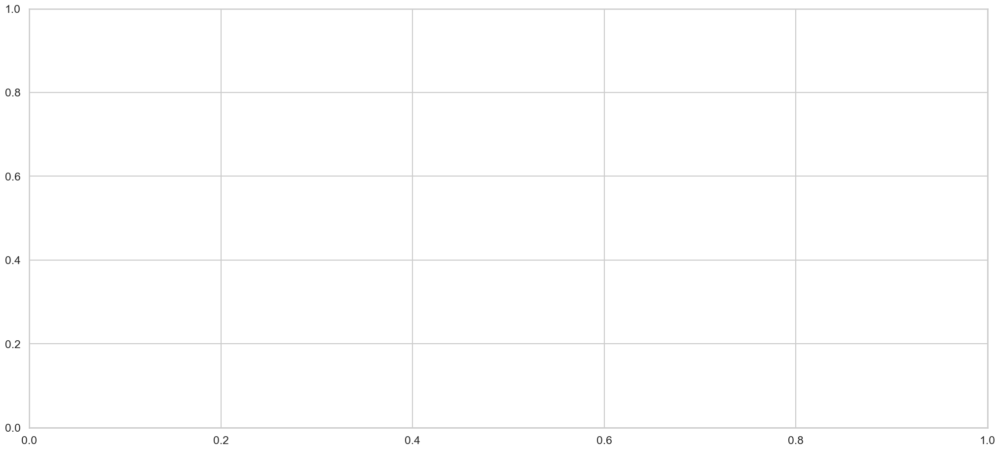

In [547]:
grouped_columns = []
cut_out = [("labeler_ids", "[4295349121, 4295342357, 4295354117]")]#, ("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff")]#, ("overlap", 0), ("sample_equal", False)]#("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff"), ("expert_predict", "target")]#, ("sample_equal", True), ("overlap", 100), 
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "expert_predict", "overlap", "sample_equal", "labeler_ids", "init_size", "labels_per_round", "rounds"]#, "expert_predict"]

method = "verma"
metric_name = "system_accuracy"
#metric_name = "coverage"
step = "test"

sns.set_style("whitegrid")
sns.set_context("talk")

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)

selected_runs["labeler_ids"] = selected_runs["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=None, plot=False)
#group_test = group_ttest(df)

In [29]:
dff["labeler_ids"].unique()

array(['[4295342357, 4295354117]'], dtype=object)

In [28]:
dfff["labeler_ids"].unique()

array(['[4295349121, 4295342357]', '[4295342357, 4295354117]',
       '[4323195249, 4295232296]'], dtype=object)

In [548]:
df_save = df.copy()

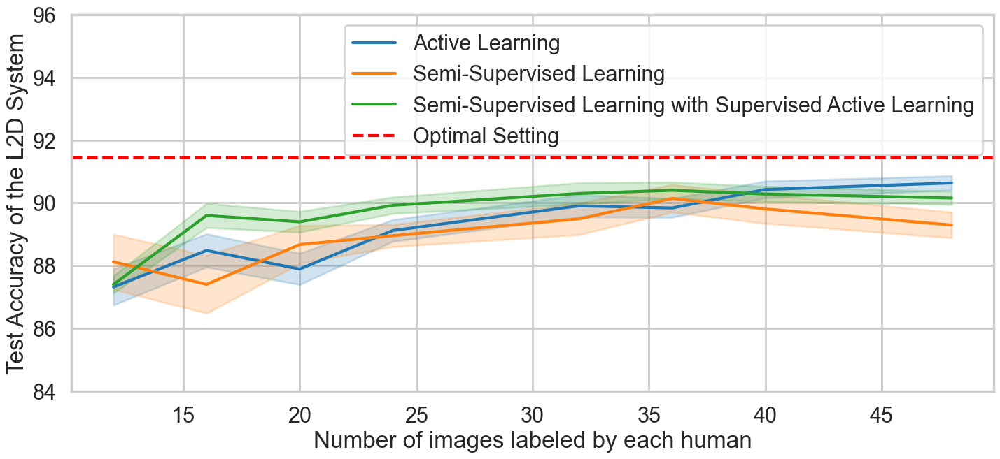

In [562]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] == 100]
dff = dff[dff["sample_equal"] == True]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]
#dff = dff[dff["setting"] == "SSL_AL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=wide_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(84, 96))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
#plt.legend(loc='lower right')
plt.legend()
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/overall_setting.png", bbox_inches="tight")

In [11]:
def q5(x):
    return np.percentile(x, 5)

def q95(x):
    return np.percentile(x, 95)

In [138]:
a = dfff.dropna().groupby(["setting", "group"])["value"].agg([np.median, scipy.stats.iqr, scipy.stats.normaltest, "mean", "std", q5, q95])#.mean()
a = a.reset_index()
a

,setting,group,median,iqr,normaltest,mean,std,q5,q95
0,PERFECT,0,90.909091,4.460999,"(0.3354468179503012, 0.845587684307017)",91.436038,3.869594,84.644374,97.830616


In [139]:
pd.concat([a, a])

,setting,group,median,iqr,normaltest,mean,std,q5,q95
0,PERFECT,0,90.909091,4.460999,"(0.3354468179503012, 0.845587684307017)",91.436038,3.869594,84.644374,97.830616
0,PERFECT,0,90.909091,4.460999,"(0.3354468179503012, 0.845587684307017)",91.436038,3.869594,84.644374,97.830616


In [564]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["expert_predict"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
#a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/overall_setting_acc.csv")
pivoted_df

setting       mean                                              \
group                   0         12         16         20         24   
0           AL        NaN  87.320423  88.483293  87.892742  89.120463   
1      PERFECT  91.436038        NaN        NaN        NaN        NaN   
2          SSL        NaN  88.123778  87.402666  88.674169  88.956751   
3       SSL_AL        NaN  87.401238  89.598706  89.396522  89.923160   

                                                        std            \
group         32         36         40         48         0        12   
0      89.905933  89.838454  90.427109  90.635604       NaN  4.025562   
1            NaN        NaN        NaN        NaN  3.869594       NaN   
2      89.491538  90.142657  89.807704  89.294416       NaN  4.390223   
3      90.300510  90.401642  90.283497  90.155616       NaN  3.554808   

                                                                             
group        16        20        24        32        36        40        48  
0      3.673387  4.918192  4.157989  3.482654  2.949243  3.214970  3.145557  
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN  
2      4.512803  4.240773  2.978425  3.489972  3.042148  3.917368  4.012796  
3      3.089151  3.767768  3.632964  3.600999  2.953189  3.263757  3.169535

In [74]:
pivoted_df["normaltest"]

group,12,16,20,24,32,36,40,48
0,0.195133,0.513164,0.000004,2.206098e-04,0.703836,0.573270,0.158322,0.086865
1,0.271609,0.826253,0.000056,9.874169e-02,0.723345,0.147100,0.000044,0.536042
2,0.162838,0.720318,0.122029,1.206975e-07,0.000873,0.340568,0.000002,0.071233


In [581]:
pivoted_df.loc[[0, 3],["mean", "std"]]["mean"].pct_change().iloc[:,1:].mean(axis=1)*100

0         NaN
3    0.542766
dtype: float64

In [71]:
pivoted_df.loc[[0, 3],["mean", "std", "median"]].pct_change().loc[:,"median"].iloc[:,:].mean(axis=1)*100

0         NaN
2    0.353901
dtype: float64

In [555]:
((pivoted_df.loc[[3],["mean"]]["mean"].iloc[:,1:]-91.436038)/91.436038).mean(axis=1)*100#.pct_change().loc[:,"mean"].iloc[:,1:]#.mean(axis=1)*100

3   -1.685709
dtype: float64

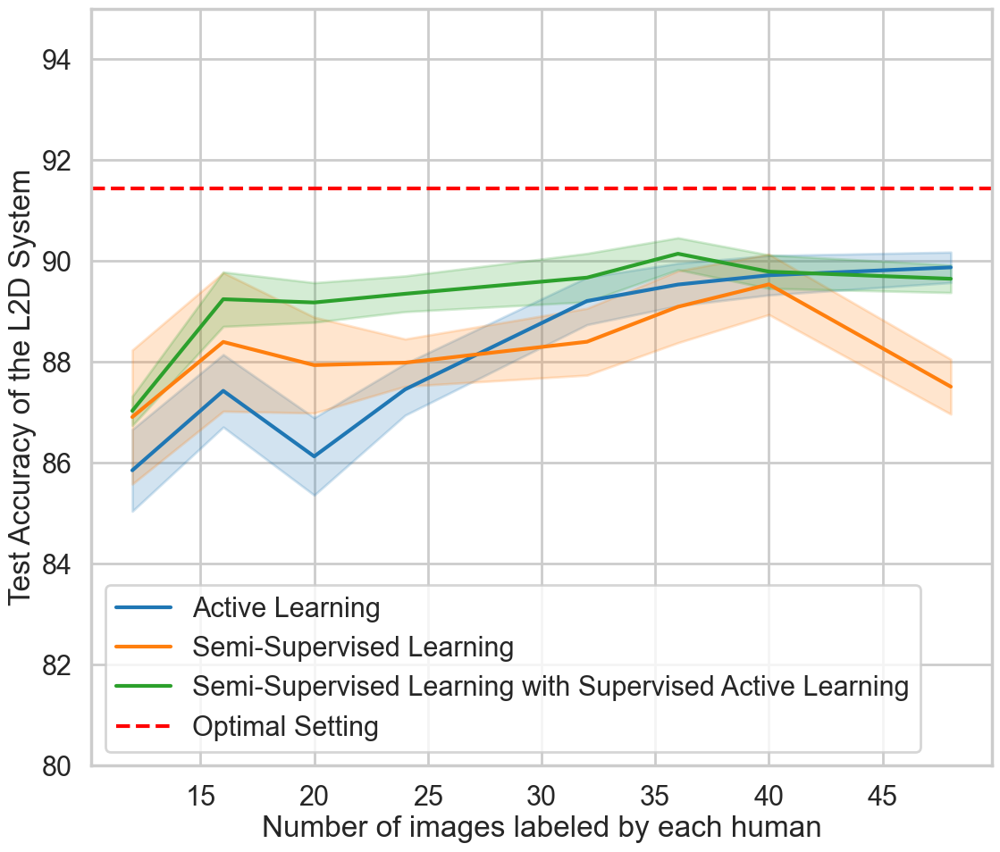

In [582]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] == 100]
dff = dff[dff["sample_equal"] == True]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
#plt.legend(loc='lower right')
plt.legend()
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/overall_setting_target.png", bbox_inches="tight")

In [583]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
#a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/overall_setting_acc_target.csv")
pivoted_df

setting       mean                                              \
group                   0         12         16         20         24   
0           AL        NaN  85.849219  87.426226  86.125128  87.454042   
1      PERFECT  91.436038        NaN        NaN        NaN        NaN   
2          SSL        NaN  86.906116  88.395316  87.935513  87.984022   
3       SSL_AL        NaN  87.029324  89.242537  89.177627  89.350059   

                                                        std            \
group         32         36         40         48         0        12   
0      89.206882  89.533434  89.717523  89.874094       NaN  4.053160   
1            NaN        NaN        NaN        NaN  3.869594       NaN   
2      88.399116  89.092363  89.536786  87.508157       NaN  4.791055   
3      89.670572  90.144250  89.788761  89.647771       NaN  3.430739   

                                                                             
group        16        20        24        32        36        40        48  
0      3.520012  5.371667  4.336440  3.250710  2.919454  3.319644  2.956696  
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN  
2      4.760556  4.751747  2.815864  3.245557  3.490244  3.597542  3.771852  
3      3.416326  3.533208  3.882875  3.841706  2.827297  3.507167  3.095317

In [585]:
pivoted_df.loc[[2, 3],["mean", "std"]]["mean"].pct_change().iloc[:,1:].mean(axis=1)*100

2         NaN
3    1.176349
dtype: float64

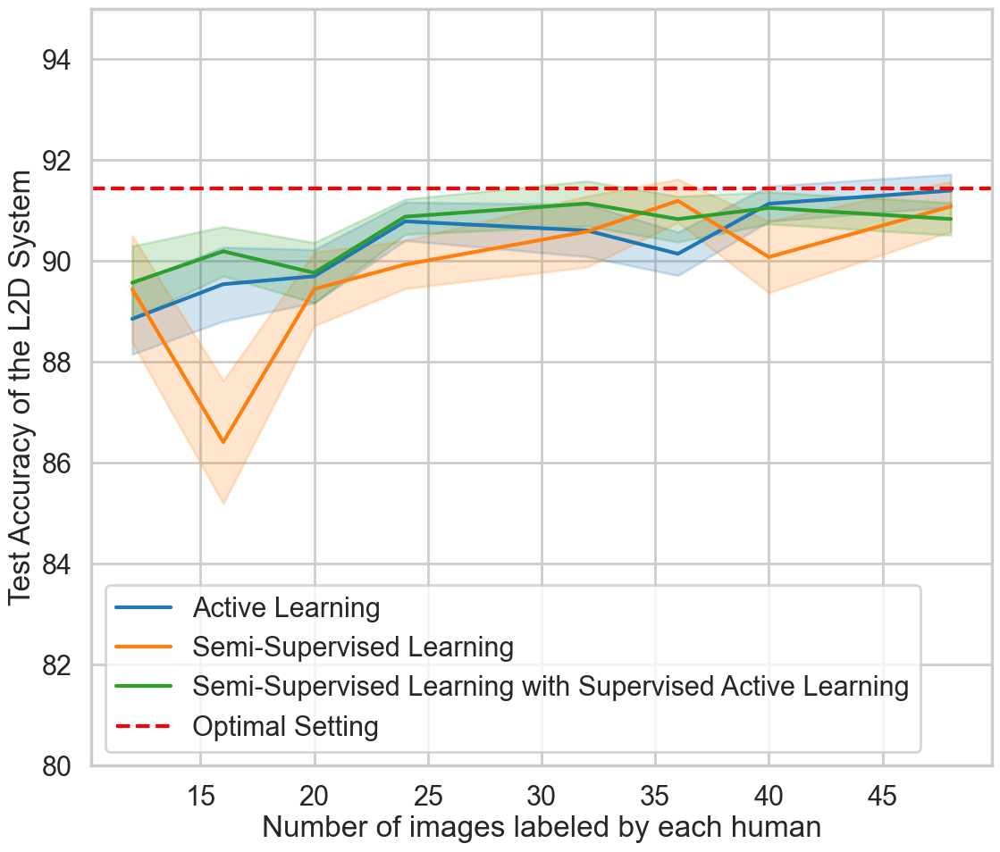

In [586]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(dfff["value"].mean(), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
#plt.legend(loc='lower right')
plt.legend()
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/overall_setting_right.png", bbox_inches="tight")

In [587]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
#a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/overall_setting_acc_right.csv")
pivoted_df

setting       mean                                              \
group                   0         12         16         20         24   
0           AL        NaN  88.852928  89.540360  89.697182  90.786885   
1      PERFECT  91.436038        NaN        NaN        NaN        NaN   
2          SSL        NaN  89.442911  86.410016  89.443602  89.929481   
3       SSL_AL        NaN  89.570734  90.192320  89.765907  90.878327   

                                                        std            \
group         32         36         40         48         0        12   
0      90.604984  90.143474  91.136696  91.397114       NaN  3.445829   
1            NaN        NaN        NaN        NaN  3.869594       NaN   
2      90.583960  91.192951  90.078621  91.080676       NaN  3.655262   
3      91.140428  90.830629  91.053088  90.832742       NaN  3.559582   

                                                                             
group        16        20        24        32        36        40        48  
0      3.584940  3.654463  3.222482  3.598689  2.977900  2.962498  3.158980  
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN  
2      4.215380  3.572189  2.849548  3.444589  2.104221  4.246964  3.435635  
3      2.400077  4.146218  2.959034  3.095299  3.135181  2.690503  3.156338

In [598]:
pivoted_df.loc[[2, 3],["mean", "std"]]["mean"].pct_change().iloc[:,1:].mean(axis=1)*100

2         NaN
3    0.870262
dtype: float64

In [596]:
((pivoted_df.loc[[3],["mean"]]["mean"].iloc[:,5:6]-91.436038)/91.436038).mean(axis=1)*100#.pct_change().loc[:,"mean"].iloc[:,1:]#.mean(axis=1)*100

3   -0.323297
dtype: float64

In [ ]:
pivoted_df.loc[[2, 3],["mean", "std"]]["mean"].pct_change().iloc[:,1:].mean(axis=1)*100
((pivoted_df.loc[[3],["mean"]]["mean"].iloc[:,5:6]-91.436038)/91.436038).mean(axis=1)*100#.pct_change().loc[:,"mean"].iloc[:,1:]#.mean(axis=1)*100

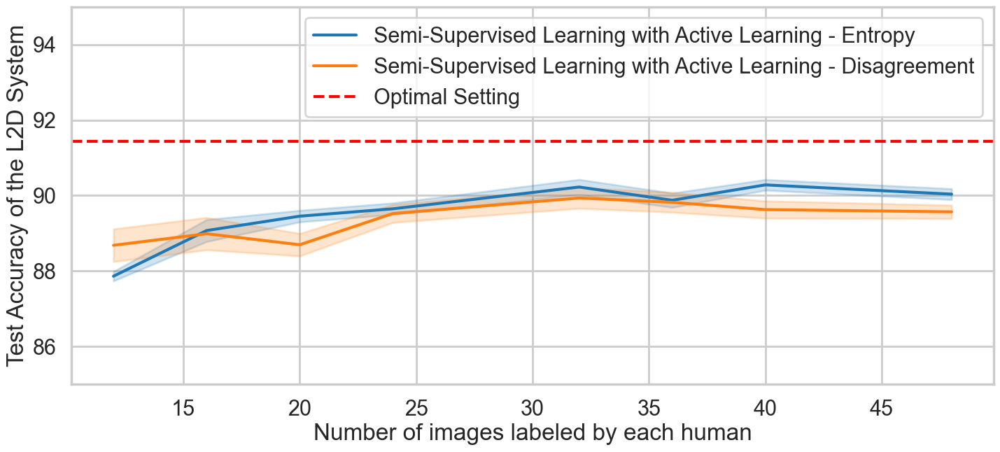

In [22]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=wide_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(85, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/active_learning_strategy.png", bbox_inches="tight")

In [28]:
from scipy.stats import iqr

a = dff.dropna().groupby(["mod", "group"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
#a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["mod"], columns="group", values=["mean", "std"])
pivoted_df = pivoted_df.reset_index()

#pivoted_df.to_csv("../../tables/NIH/approach_model_acc.csv")
pivoted_df

mod       mean                                   \
group                             0         12         16         20   
0             confidence        NaN  87.860046  89.070757  89.451831   
1      disagreement_diff        NaN  88.680090  88.987023  88.694543   
2                perfect  91.436038        NaN        NaN        NaN   

                                                                   std  \
group         24         32         36         40         48         0   
0      89.648001  90.225101  89.874127  90.281645  90.036111       NaN   
1      89.521632  89.934752  89.819260  89.626429  89.567033       NaN   
2            NaN        NaN        NaN        NaN        NaN  3.869594   

                                                                             \
group        12        16        20        24        32        36        40   
0      3.282356  3.704471  3.191414  3.374866  3.255393  3.411477  2.958275   
1      4.254182  4.203244  4.136569  4.037213  3.826770  3.652653  3.729004   
2           NaN       NaN       NaN       NaN       NaN       NaN       NaN   

                 
group        48  
0      3.154335  
1      3.087468  
2           NaN

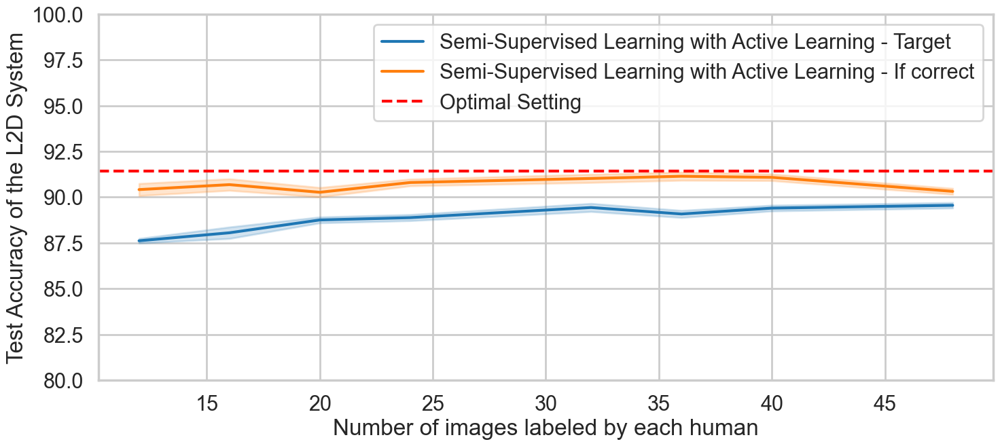

In [599]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=wide_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Target", "Semi-Supervised Learning with Active Learning - If correct"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/model_strategy.png", bbox_inches="tight")

In [600]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "expert_predict", "group"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
#a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting", "expert_predict"], columns="group", values=["mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/approach_setting_acc_model.csv")
pivoted_df

setting expert_predict       mean                                   \
group                                  0         12         16         20   
0      PERFECT        perfect  91.436038        NaN        NaN        NaN   
1       SSL_AL          right        NaN  90.412978  90.683916  90.266516   
2       SSL_AL         target        NaN  87.614319  88.052621  88.753177   

                                                                   std  \
group         24         32         36         40         48         0   
0            NaN        NaN        NaN        NaN        NaN  3.869594   
1      90.801020  91.022959  91.142945  91.082468  90.315286       NaN   
2      88.880368  89.433678  89.079916  89.400007  89.554185       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      3.256466  3.102063  3.591361  3.171645  3.126800  3.133990  2.958375   
2      3.307024  3.989921  3.394531  3.707848  3.619458  3.485089  3.310504   

                 
group        48  
0           NaN  
1      2.865209  
2      3.264953

In [601]:
pivoted_df.loc[[2, 1],["mean", "std"]]["mean"].pct_change().iloc[:,1:].mean(axis=1)*100

2         NaN
1    2.109184
dtype: float64

In [ ]:
pivoted_df.loc[[2, 3],["mean", "std"]]["mean"].pct_change().iloc[:,1:].mean(axis=1)*100
((pivoted_df.loc[[3],["mean"]]["mean"].iloc[:,5:6]-91.436038)/91.436038).mean(axis=1)*100#.pct_change().loc[:,"mean"].iloc[:,1:]#.mean(axis=1)*100

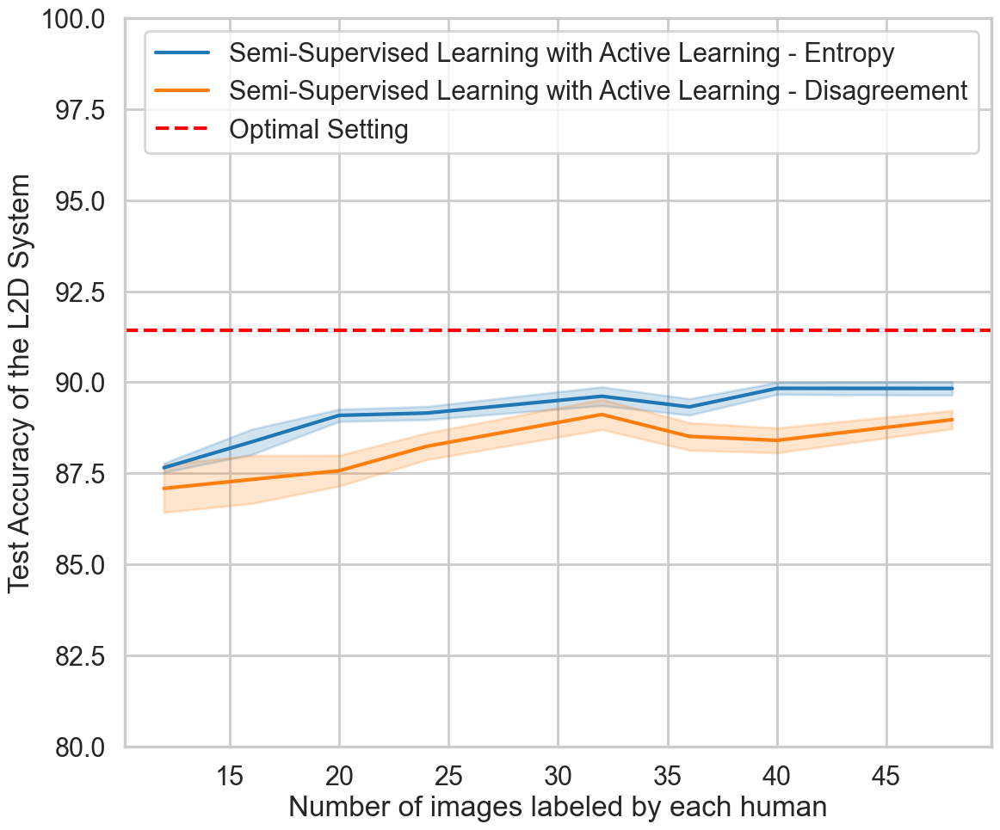

In [602]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement", ]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/model_strategy_target.png", bbox_inches="tight")

In [603]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "mod", "expert_predict", "group"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
#a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting", "mod", "expert_predict"], columns="group", values=["mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/approach_setting_acc_al_target.csv")
pivoted_df

setting                mod expert_predict       mean             \
group                                                     0         12   
0      PERFECT            perfect        perfect  91.436038        NaN   
1       SSL_AL         confidence         target        NaN  87.654655   
2       SSL_AL  disagreement_diff         target        NaN  87.085742   

                                                              ...             \
group         16         20         24         32         36  ...         48   
0            NaN        NaN        NaN        NaN        NaN  ...        NaN   
1      88.362076  89.090773  89.154445  89.615671  89.322603  ...  89.830216   
2      87.330560  87.571590  88.240853  89.115190  88.513646  ...  88.973068   

            std                                                              \
group         0        12        16        20        24        32        36   
0      3.869594       NaN       NaN       NaN       NaN       NaN       NaN   
1           NaN  3.192451  3.689092  3.070143  3.329623  3.337682  3.364862   
2           NaN  4.562014  4.577468  4.150312  4.414917  4.064898  3.707283   

                           
group        40        48  
0           NaN       NaN  
1      2.905685  3.317482  
2      3.928131  3.081989  

[3 rows x 21 columns]

In [604]:
pivoted_df.loc[[2, 1],["mean", "std"]]["mean"].pct_change().iloc[:,1:].mean(axis=1)*100

2         NaN
1    1.082398
dtype: float64

In [ ]:
pivoted_df.loc[[2, 3],["mean", "std"]]["mean"].pct_change().iloc[:,1:].mean(axis=1)*100
((pivoted_df.loc[[3],["mean"]]["mean"].iloc[:,5:6]-91.436038)/91.436038).mean(axis=1)*100#.pct_change().loc[:,"mean"].iloc[:,1:]#.mean(axis=1)*100

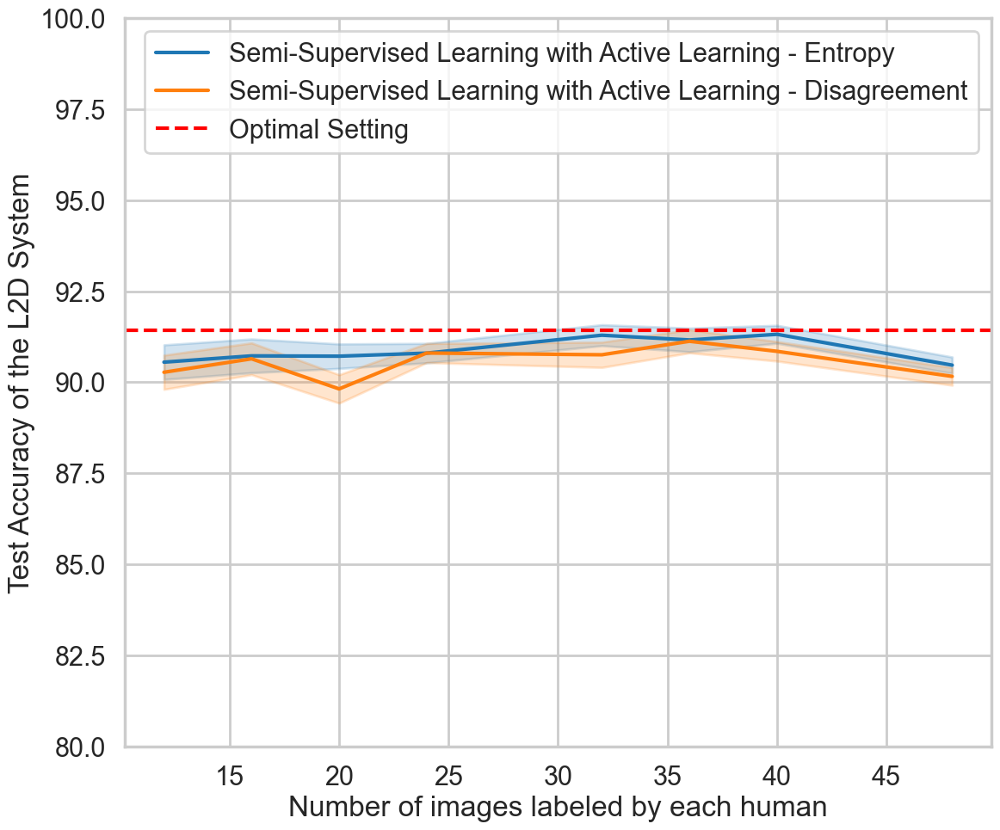

In [605]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/model_strategy_right.png", bbox_inches="tight")

In [606]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "mod", "expert_predict", "group"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
#a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting", "mod", "expert_predict"], columns="group", values=["mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/approach_setting_acc_al_right.csv")
pivoted_df

setting                mod expert_predict       mean             \
group                                                     0         12   
0      PERFECT            perfect        perfect  91.436038        NaN   
1       SSL_AL         confidence          right        NaN  90.551519   
2       SSL_AL  disagreement_diff          right        NaN  90.274438   

                                                              ...             \
group         16         20         24         32         36  ...         48   
0            NaN        NaN        NaN        NaN        NaN  ...        NaN   
1      90.724348  90.715536  90.799630  91.291603  91.161017  ...  90.469574   
2      90.643485  89.817497  90.802411  90.754314  91.124874  ...  90.160998   

            std                                                              \
group         0        12        16        20        24        32        36   
0      3.869594       NaN       NaN       NaN       NaN       NaN       NaN   
1           NaN  3.289135  3.208471  3.300787  3.205009  2.819436  3.179844   
2           NaN  3.252254  3.025345  3.824766  3.149115  3.400234  3.104047   

                           
group        40        48  
0           NaN       NaN  
1      2.825734  2.739737  
2      3.078298  2.986491  

[3 rows x 21 columns]

In [607]:
pivoted_df.loc[[2, 1],["mean", "std"]]["mean"].pct_change().iloc[:,1:].mean(axis=1)*100

2         NaN
1    0.360173
dtype: float64

In [ ]:
pivoted_df.loc[[2, 3],["mean", "std"]]["mean"].pct_change().iloc[:,1:].mean(axis=1)*100
((pivoted_df.loc[[3],["mean"]]["mean"].iloc[:,5:6]-91.436038)/91.436038).mean(axis=1)*100#.pct_change().loc[:,"mean"].iloc[:,1:]#.mean(axis=1)*100

In [608]:
from scipy.stats import iqr

build_df = df.copy()

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]

a = dff.dropna().groupby(["setting", "mod", "expert_predict", "group"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
#a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting", "mod", "expert_predict"], columns="group", values=["mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/approach_setting_acc_al.csv")
pivoted_df

setting                mod expert_predict       mean             \
group                                                     0         12   
0      PERFECT            perfect        perfect  91.436038        NaN   
1       SSL_AL         confidence          right        NaN  90.551519   
2       SSL_AL         confidence         target        NaN  87.654655   
3       SSL_AL  disagreement_diff          right        NaN  90.274438   
4       SSL_AL  disagreement_diff         target        NaN  87.085742   

                                                              ...             \
group         16         20         24         32         36  ...         48   
0            NaN        NaN        NaN        NaN        NaN  ...        NaN   
1      90.724348  90.715536  90.799630  91.291603  91.161017  ...  90.469574   
2      88.362076  89.090773  89.154445  89.615671  89.322603  ...  89.830216   
3      90.643485  89.817497  90.802411  90.754314  91.124874  ...  90.160998   
4      87.330560  87.571590  88.240853  89.115190  88.513646  ...  88.973068   

            std                                                              \
group         0        12        16        20        24        32        36   
0      3.869594       NaN       NaN       NaN       NaN       NaN       NaN   
1           NaN  3.289135  3.208471  3.300787  3.205009  2.819436  3.179844   
2           NaN  3.192451  3.689092  3.070143  3.329623  3.337682  3.364862   
3           NaN  3.252254  3.025345  3.824766  3.149115  3.400234  3.104047   
4           NaN  4.562014  4.577468  4.150312  4.414917  4.064898  3.707283   

                           
group        40        48  
0           NaN       NaN  
1      2.825734  2.739737  
2      2.905685  3.317482  
3      3.078298  2.986491  
4      3.928131  3.081989  

[5 rows x 21 columns]

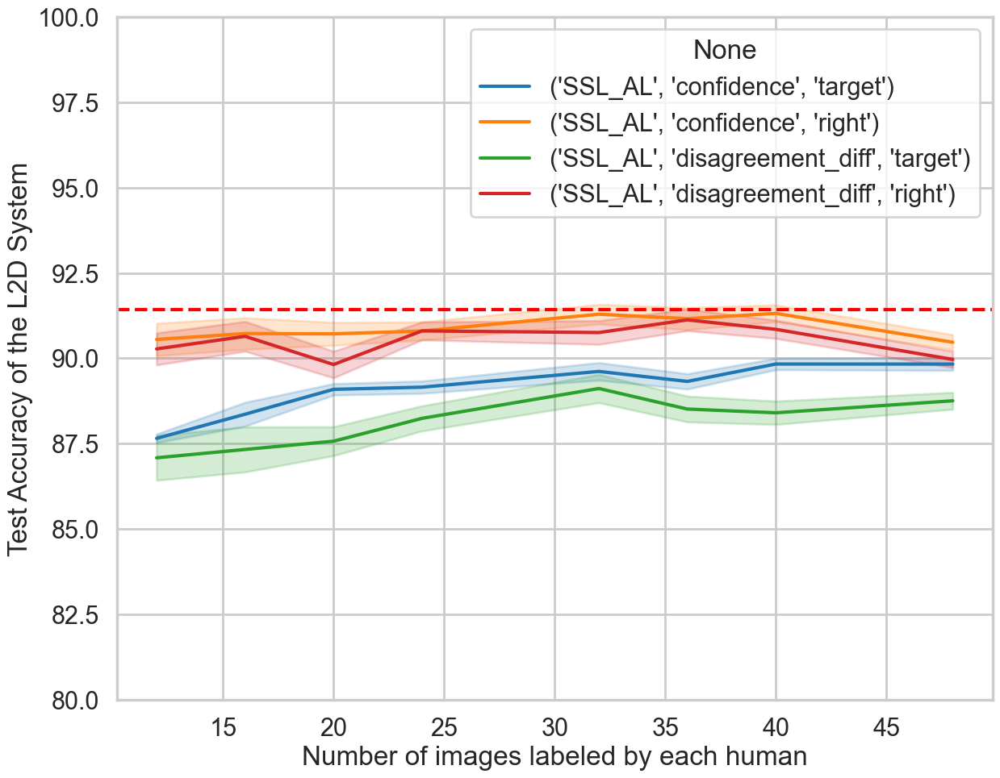

In [93]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(14, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
#plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning - Target", "Semi-Supervised Learning with Active Learning - If correct"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/model_strategy_active_learning.png", bbox_inches="tight")

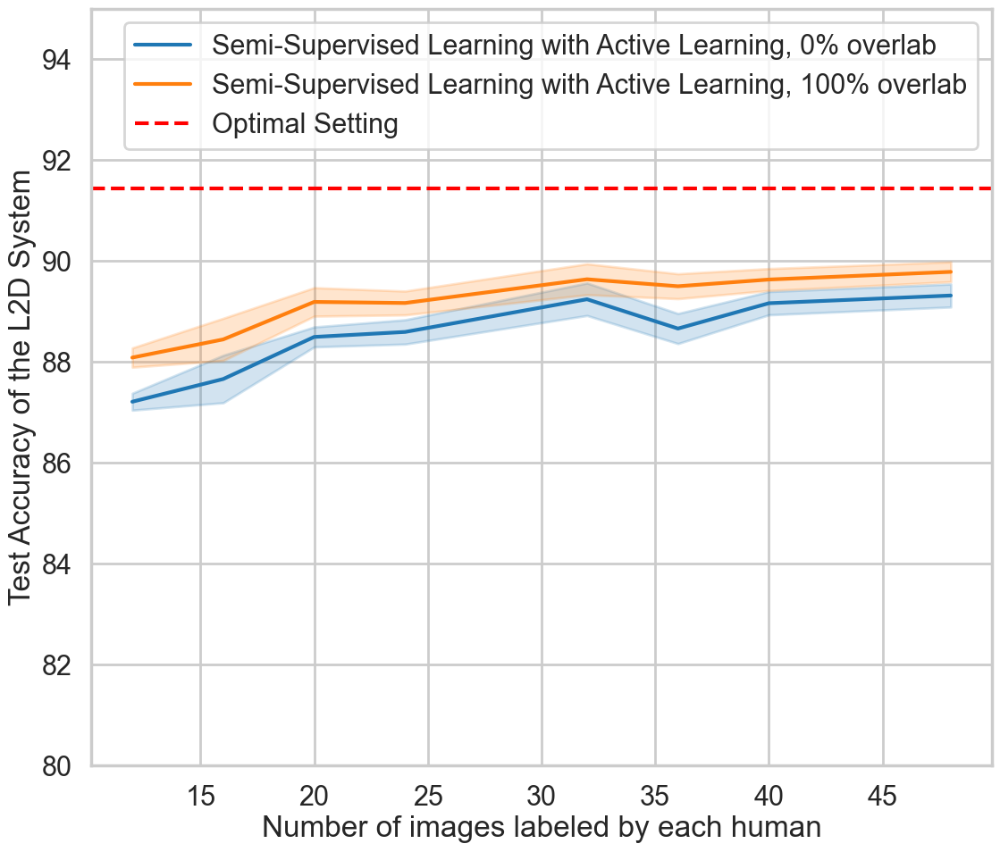

In [609]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]


dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "overlap"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning, 0% overlab", "Semi-Supervised Learning with Active Learning, 100% overlab"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/parameters_overlap_target.png", bbox_inches="tight")

In [610]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "expert_predict", "overlap", "group"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
#a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting", "expert_predict", "overlap"], columns="group", values=["mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/approach_setting_acc_overlap_target.csv")
pivoted_df

setting expert_predict  overlap       mean                        \
group                                           0         12         16   
0      PERFECT        perfect  perfect  91.436038        NaN        NaN   
1       SSL_AL         target        0        NaN  87.209523  87.660000   
2       SSL_AL         target      100        NaN  88.085071  88.445242   

                                                   ...                  std  \
group         20         24         32         36  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  3.869594   
1      88.494410  88.593289  89.241532  88.660430  ...  89.315454       NaN   
2      89.188741  89.167447  89.637833  89.499402  ...  89.784959       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      3.192341  4.209303  3.256635  3.738736  3.761092  3.772630  3.386490   
2      3.380116  3.742995  3.583051  3.661984  3.465674  3.127489  3.224941   

                 
group        48  
0           NaN  
1      3.471437  
2      3.041598  

[3 rows x 21 columns]

In [614]:
pivoted_df.loc[[1, 2],["mean", "std"]]["mean"].pct_change().iloc[:,1:].mean(axis=1)*100

1         NaN
2    0.721865
dtype: float64

In [ ]:
pivoted_df.loc[[2, 3],["mean", "std"]]["mean"].pct_change().iloc[:,1:].mean(axis=1)*100
((pivoted_df.loc[[3],["mean"]]["mean"].iloc[:,5:6]-91.436038)/91.436038).mean(axis=1)*100#.pct_change().loc[:,"mean"].iloc[:,1:]#.mean(axis=1)*100

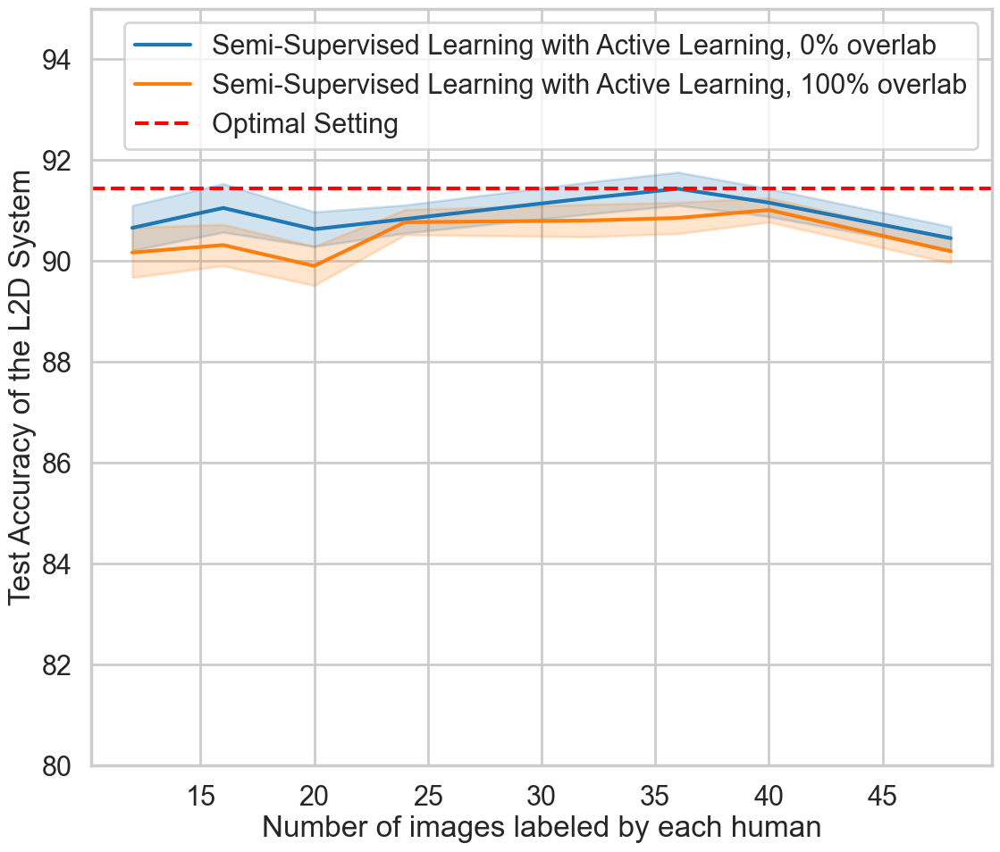

In [617]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]


dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "overlap"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning, 0% overlab", "Semi-Supervised Learning with Active Learning, 100% overlab"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/parameters_overlap_right.png", bbox_inches="tight")

In [618]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "overlap", "expert_predict", "group"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
#a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting", "overlap", "expert_predict"], columns="group", values=["mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/approach_setting_acc_overlap_right.csv")
pivoted_df

setting  overlap expert_predict       mean                        \
group                                           0         12         16   
0      PERFECT  perfect        perfect  91.436038        NaN        NaN   
1       SSL_AL        0          right        NaN  90.657306  91.051875   
2       SSL_AL      100          right        NaN  90.168650  90.315958   

                                                   ...                 std  \
group         20         24         32         36  ...        48         0   
0            NaN        NaN        NaN        NaN  ...       NaN  3.869594   
1      90.630600  90.832558  91.244151  91.432622  ...  90.45186       NaN   
2      89.902433  90.769483  90.801766  90.853269  ...  90.19237       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      3.083355  3.329568  3.359906  3.340202  3.103503  3.212119  3.130070   
2      3.435951  2.843899  3.791390  3.005006  3.150564  3.043005  2.796964   

                 
group        48  
0           NaN  
1      2.745542  
2      2.972005  

[3 rows x 21 columns]

In [619]:
pivoted_df.loc[[, 2],["mean", "std"]]["mean"].pct_change().iloc[:,1:].mean(axis=1)*100

1         NaN
2   -0.473196
dtype: float64

In [ ]:
pivoted_df.loc[[2, 3],["mean", "std"]]["mean"].pct_change().iloc[:,1:].mean(axis=1)*100
((pivoted_df.loc[[3],["mean"]]["mean"].iloc[:,5:6]-91.436038)/91.436038).mean(axis=1)*100#.pct_change().loc[:,"mean"].iloc[:,1:]#.mean(axis=1)*100

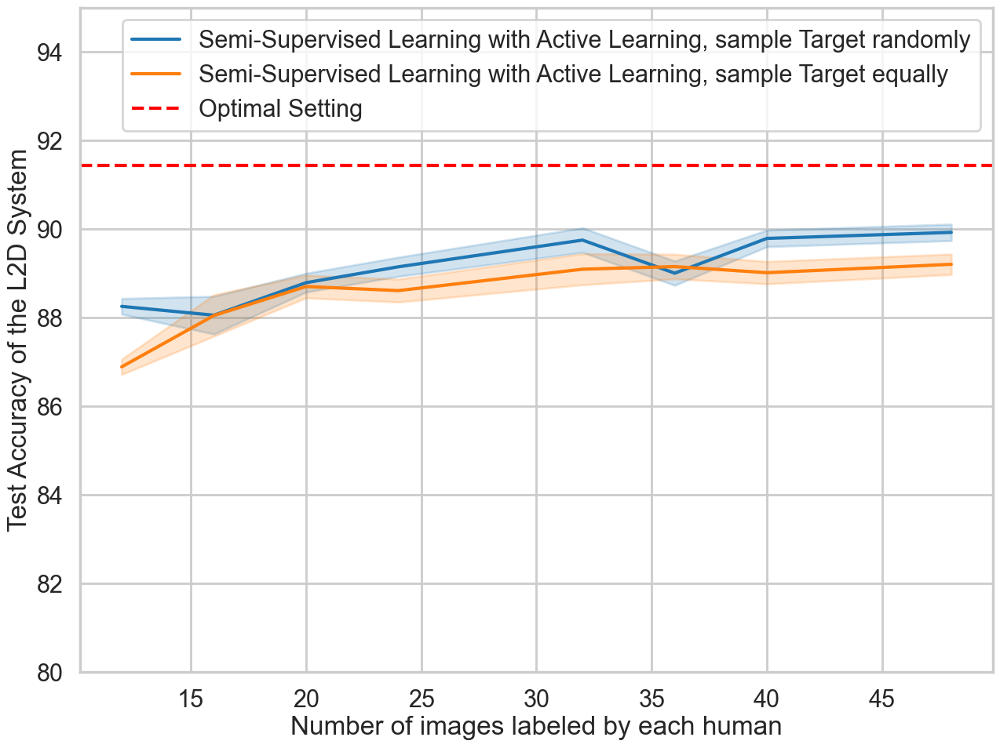

In [363]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format_w)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))

#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))

from scipy import stats

(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x)))


ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning, sample Target randomly", "Semi-Supervised Learning with Active Learning, sample Target equally"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/parameters_sample_target.png", bbox_inches="tight")

In [366]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "sample_equal", "expert_predict", "group"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
#a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting", "sample_equal", "expert_predict"], columns="group", values=["mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/approach_setting_acc_sample_target.csv")
pivoted_df

setting sample_equal expert_predict       mean                        \
group                                               0         12         16   
0      PERFECT      perfect        perfect  91.436038        NaN        NaN   
1       SSL_AL        False         target        NaN  88.255854  88.056060   
2       SSL_AL         True         target        NaN  86.890070  88.049182   

                                                   ...                  std  \
group         20         24         32         36  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  3.869594   
1      88.790541  89.149077  89.752522  89.005359  ...  89.926930       NaN   
2      88.704224  88.611658  89.094906  89.154473  ...  89.205883       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      3.369170  3.820567  3.321832  3.356234  3.226973  3.464511  2.753180   
2      3.083839  4.176565  3.495864  4.018018  3.979382  3.514833  3.745467   

                 
group        48  
0           NaN  
1      2.811534  
2      3.609072  

[3 rows x 21 columns]

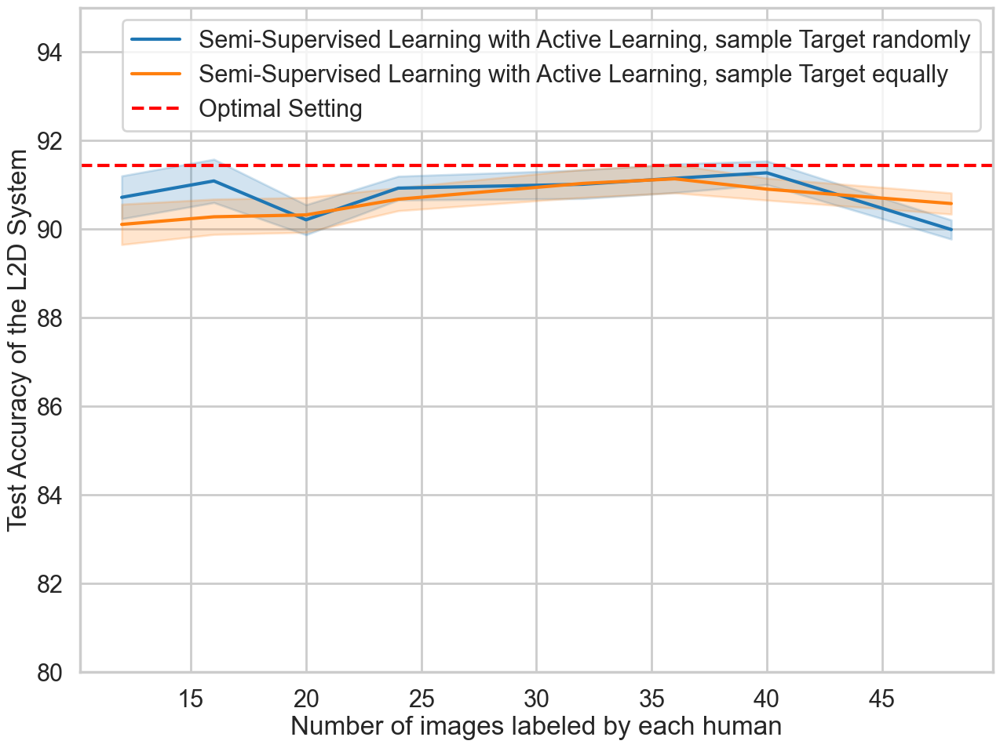

In [367]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format_w)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))

#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))

from scipy import stats

(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x)))


ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning, sample Target randomly", "Semi-Supervised Learning with Active Learning, sample Target equally"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/parameters_sample_right.png", bbox_inches="tight")

In [368]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "sample_equal", "expert_predict", "group"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
#a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting", "sample_equal", "expert_predict"], columns="group", values=["mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/approach_setting_acc_sample_right.csv")
pivoted_df

setting sample_equal expert_predict       mean                        \
group                                               0         12         16   
0      PERFECT      perfect        perfect  91.436038        NaN        NaN   
1       SSL_AL        False          right        NaN  90.718647  91.088924   
2       SSL_AL         True          right        NaN  90.107310  90.278909   

                                                   ...                  std  \
group         20         24         32         36  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  3.869594   
1      90.211347  90.926284  91.013266  91.148949  ...  89.990745       NaN   
2      90.321686  90.675757  91.032651  91.136941  ...  90.578010       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      3.354849  3.391480  3.325555  3.229438  3.160353  3.163628  3.012321   
2      3.160525  2.759194  3.855651  3.118996  3.109444  3.120667  2.906458   

                 
group        48  
0           NaN  
1      2.520126  
2      3.099300  

[3 rows x 21 columns]

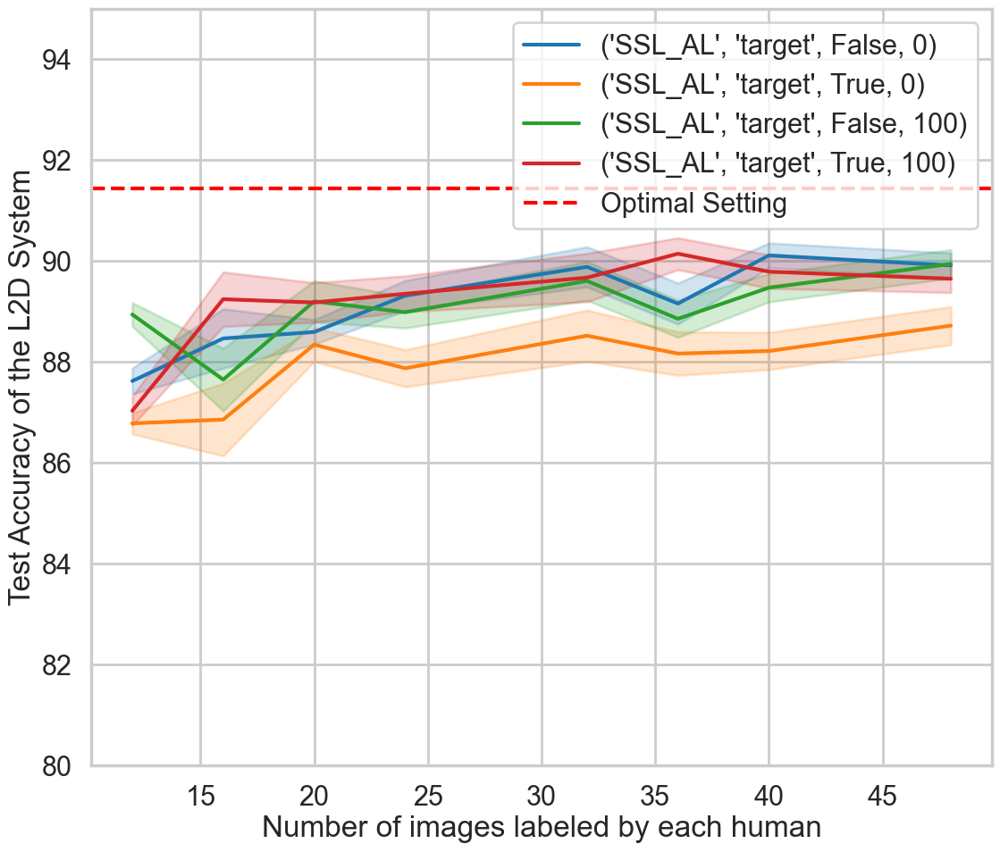

In [49]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal", "overlap"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
#plt.savefig("../../images/NIH/parameters_sample.png", bbox_inches="tight")

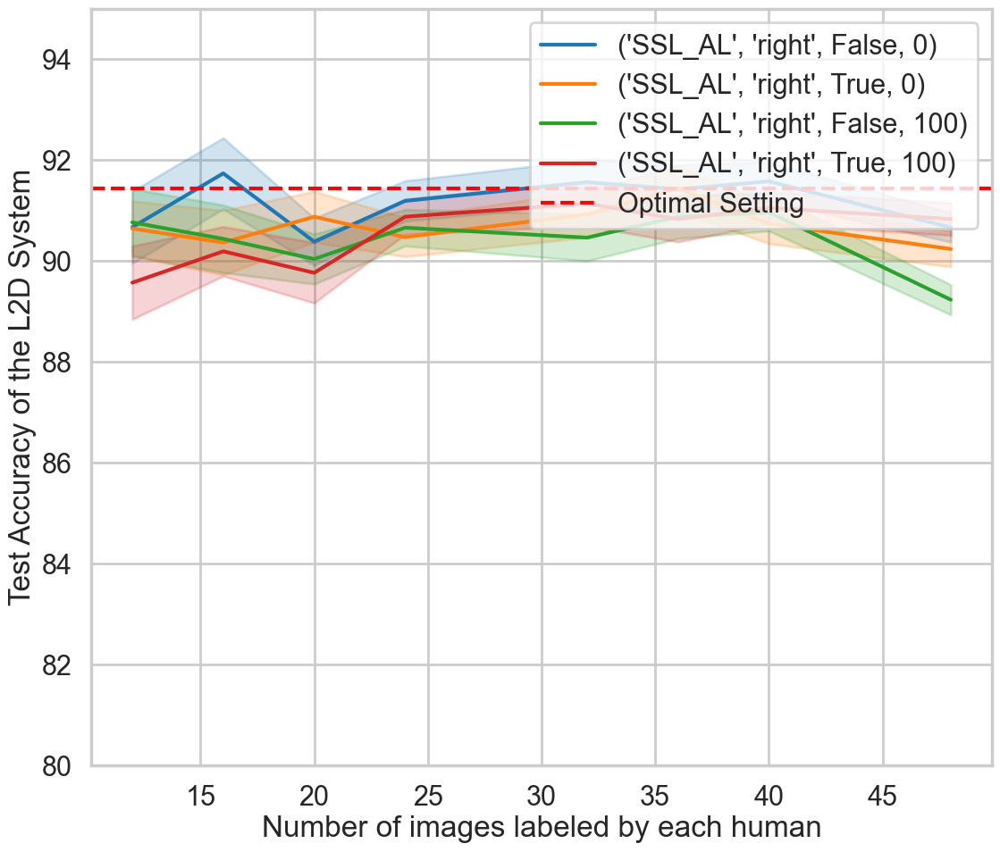

In [50]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal", "overlap"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
#plt.savefig("../../images/NIH/parameters_sample.png", bbox_inches="tight")

## Individual teams

### Labeler [4323195249, 4295232296]

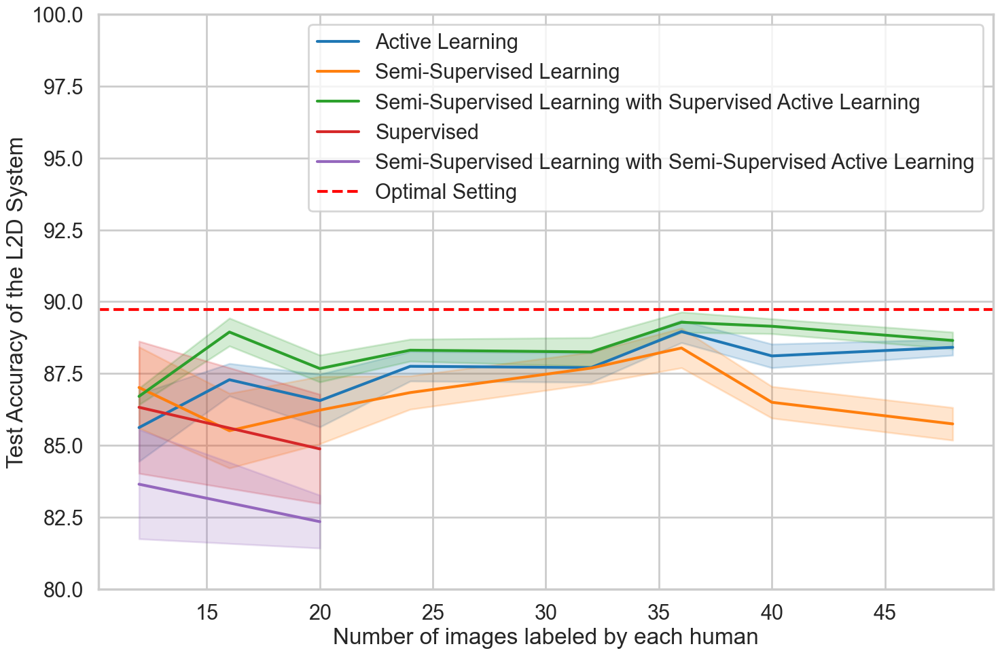

In [51]:
build_df = df.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "NORMAL"]
#dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=wide_format_h)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning", "Supervised", "Semi-Supervised Learning with Semi-Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/overall_setting.png", bbox_inches="tight")

In [53]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/overall_setting_acc.csv")
pivoted_df

setting       mean                                              \
group                      0         12         16         20         24   
0              AL        NaN  85.618934  87.284219  86.557637  87.750745   
1          NORMAL        NaN  86.325035        NaN  84.877998        NaN   
2         PERFECT  89.715056        NaN        NaN        NaN        NaN   
3             SSL        NaN  87.013321  85.510458  86.226144  86.836839   
4          SSL_AL        NaN  86.705507  88.942842  87.672488  88.311058   
5      SSL_AL_SSL        NaN  83.649263        NaN  82.346290        NaN   

                                                   ...     median       std  \
group         32         36         40         48  ...         48         0   
0      87.705722  88.960043  88.111903  88.411822  ...  88.311688       NaN   
1            NaN        NaN        NaN        NaN  ...        NaN       NaN   
2            NaN        NaN        NaN        NaN  ...        NaN  2.905087   
3      87.688488  88.388099  86.498484  85.747790  ...  86.535304       NaN   
4      88.250784  89.283814  89.143556  88.649628  ...  89.024390       NaN   
5            NaN        NaN        NaN        NaN  ...        NaN       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0      4.836787  2.254593  5.268384  3.564484  2.876345  2.188143  2.860036   
1      5.139950       NaN  4.245242       NaN       NaN       NaN       NaN   
2           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3      4.238769  3.677375  4.834367  2.848540  2.214069  2.755955  2.696222   
4      3.208450  2.379124  3.271807  3.245554  3.451723  2.450277  2.197239   
5      4.250216       NaN  1.842432       NaN       NaN       NaN       NaN   

                 
group        48  
0      2.207817  
1           NaN  
2           NaN  
3      3.213887  
4      2.845922  
5           NaN  

[6 rows x 27 columns]

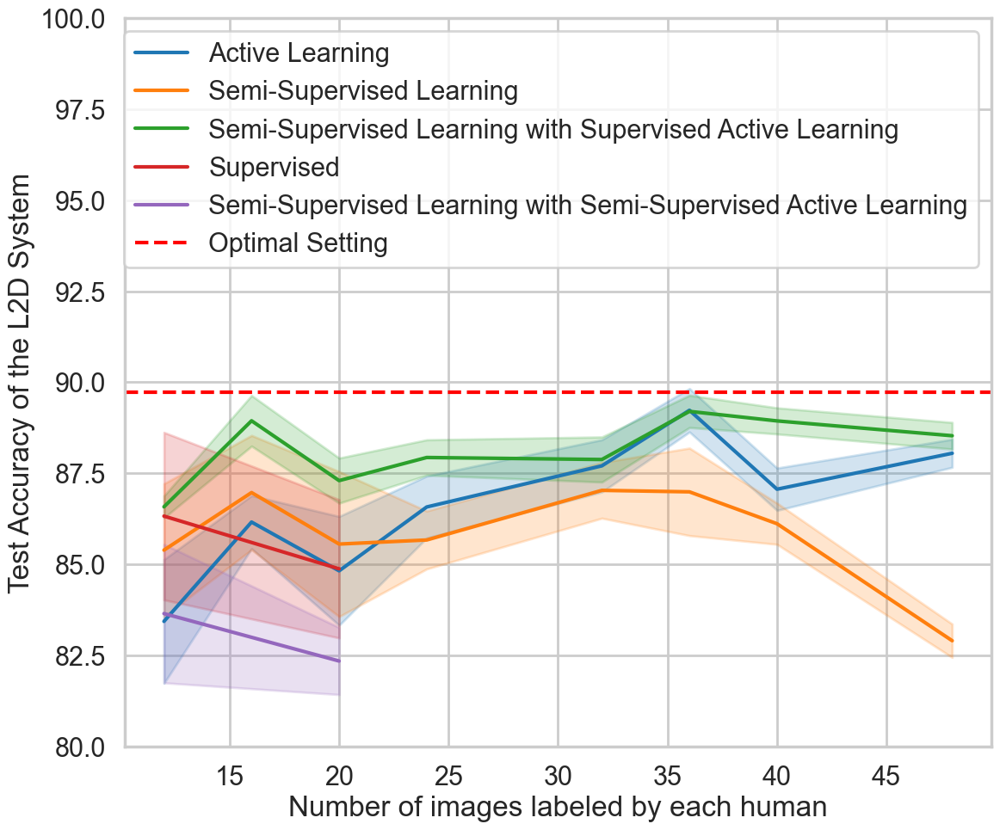

In [54]:
build_df = df.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "NORMAL"]
#dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning", "Supervised", "Semi-Supervised Learning with Semi-Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/overall_setting_target.png", bbox_inches="tight")

In [55]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/overall_setting_acc_target.csv")
pivoted_df

setting       mean                                              \
group                      0         12         16         20         24   
0              AL        NaN  83.435161  86.161559  84.822939  86.575566   
1          NORMAL        NaN  86.325035        NaN  84.877998        NaN   
2         PERFECT  89.715056        NaN        NaN        NaN        NaN   
3             SSL        NaN  85.391503  86.971267  85.557587  85.669690   
4          SSL_AL        NaN  86.579782  88.941835  87.299684  87.934275   
5      SSL_AL_SSL        NaN  83.649263        NaN  82.346290        NaN   

                                                   ...     median       std  \
group         32         36         40         48  ...         48         0   
0      87.705285  89.230984  87.063395  88.050252  ...  88.273491       NaN   
1            NaN        NaN        NaN        NaN  ...        NaN       NaN   
2            NaN        NaN        NaN        NaN  ...        NaN  2.905087   
3      87.032140  86.991320  86.115959  82.904209  ...  82.363039       NaN   
4      87.878996  89.199876  88.938371  88.531345  ...  89.017690       NaN   
5            NaN        NaN        NaN        NaN  ...        NaN       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0      5.096991  2.056731  6.157143  4.165718  2.866991  2.384140  2.846759   
1      5.139950       NaN  4.245242       NaN       NaN       NaN       NaN   
2           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
3      4.076233  3.139150  5.971925  2.754449  2.161768  3.398105  1.962131   
4      3.236515  2.779238  3.557892  3.371608  3.504472  2.506288  2.489312   
5      4.250216       NaN  1.842432       NaN       NaN       NaN       NaN   

                 
group        48  
0      2.177931  
1           NaN  
2           NaN  
3      1.833314  
4      2.923611  
5           NaN  

[6 rows x 27 columns]

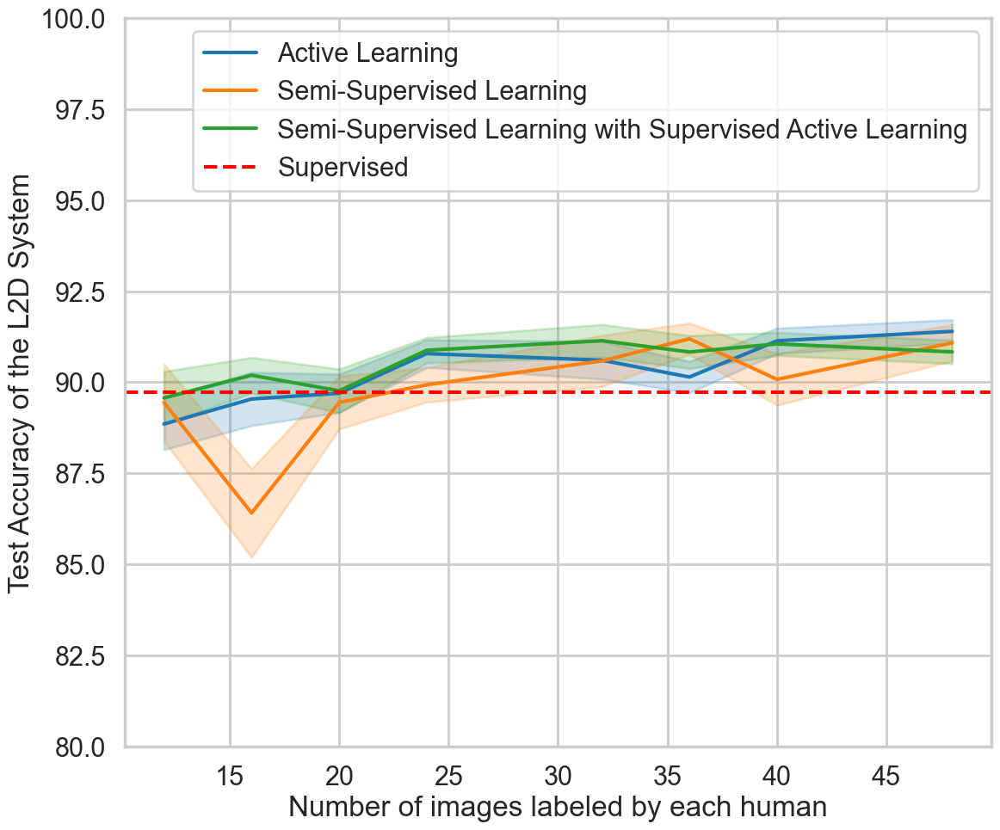

In [352]:
build_df = df.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = df[df["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "NORMAL"]
#dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning", "Supervised", "Semi-Supervised Learning with Semi-Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/overall_setting_right.png", bbox_inches="tight")

In [57]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/overall_setting_acc_right.csv")
pivoted_df

setting       mean                                              \
group                   0         12         16         20         24   
0           AL        NaN  88.852928  89.540360  89.697182  90.786885   
1      PERFECT  89.715056        NaN        NaN        NaN        NaN   
2          SSL        NaN  89.442911  86.410016  89.443602  89.929481   
3       SSL_AL        NaN  89.570734  90.192320  89.765907  90.878327   

                                                   ...     median       std  \
group         32         36         40         48  ...         48         0   
0      90.604984  90.143474  91.136696  91.397114  ...  91.044776       NaN   
1            NaN        NaN        NaN        NaN  ...        NaN  2.905087   
2      90.583960  91.192951  90.078621  91.080676  ...  89.505882       NaN   
3      91.140428  90.830629  91.053088  90.832742  ...  90.856844       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0      3.445829  3.584940  3.654463  3.222482  3.598689  2.977900  2.962498   
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2      3.655262  4.215380  3.572189  2.849548  3.444589  2.104221  4.246964   
3      3.559582  2.400077  4.146218  2.959034  3.095299  3.135181  2.690503   

                 
group        48  
0      3.158980  
1           NaN  
2      3.435635  
3      3.156338  

[4 rows x 27 columns]

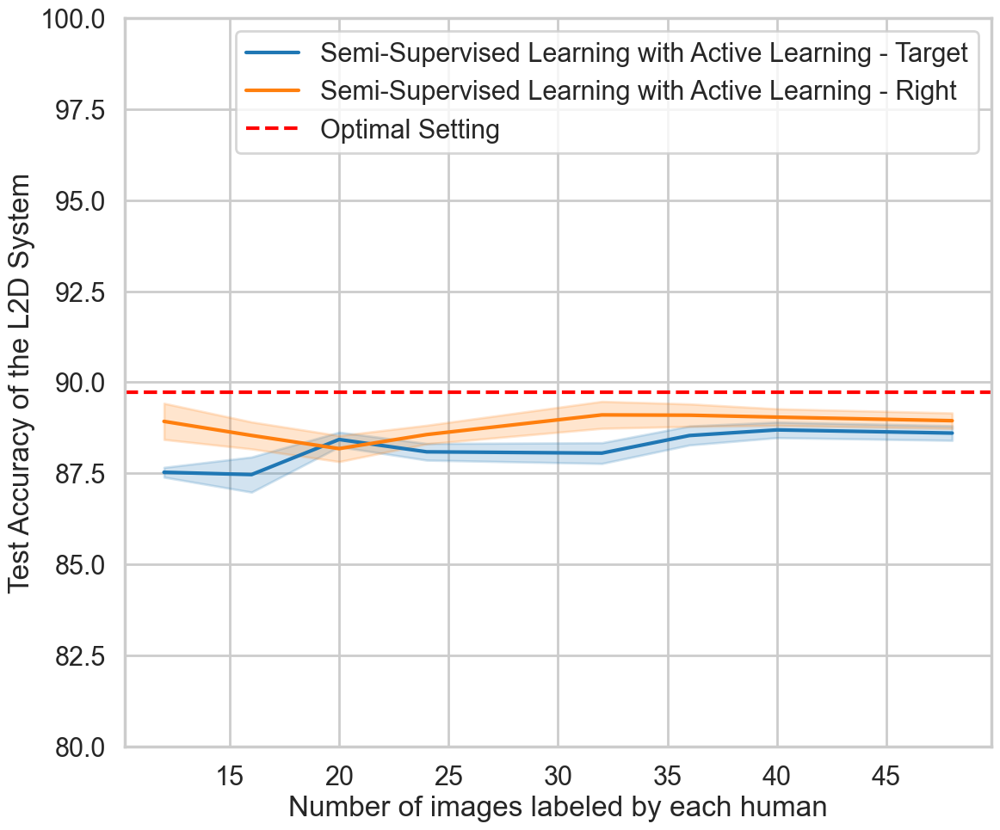

In [370]:
build_df = df.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Target", "Semi-Supervised Learning with Active Learning - Right"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/expert_strategy.png", bbox_inches="tight")

In [372]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "expert_predict", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "expert_predict"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/approach_acc_model_strategy.csv")
pivoted_df

setting expert_predict       mean                                   \
group                                  0         12         16         20   
0      PERFECT        perfect  89.715056        NaN        NaN        NaN   
1       SSL_AL          right        NaN  88.925962  88.539622  88.178080   
2       SSL_AL         target        NaN  87.528629  87.465114  88.428879   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.905087   
1      88.563725  89.103882  89.095396  89.042407  ...  89.411765       NaN   
2      88.089846  88.054195  88.537510  88.691789  ...  89.024390       NaN   

                                                                            \
group        12        16       20        24        32        36        40   
0           NaN       NaN      NaN       NaN       NaN       NaN       NaN   
1      2.809303  2.095319  2.85714  2.498850  2.961951  2.470898  2.244684   
2      3.223943  3.858122  3.10796  3.168023  3.218211  2.942066  2.961860   

                 
group        48  
0           NaN  
1      2.397661  
2      3.208060  

[3 rows x 28 columns]

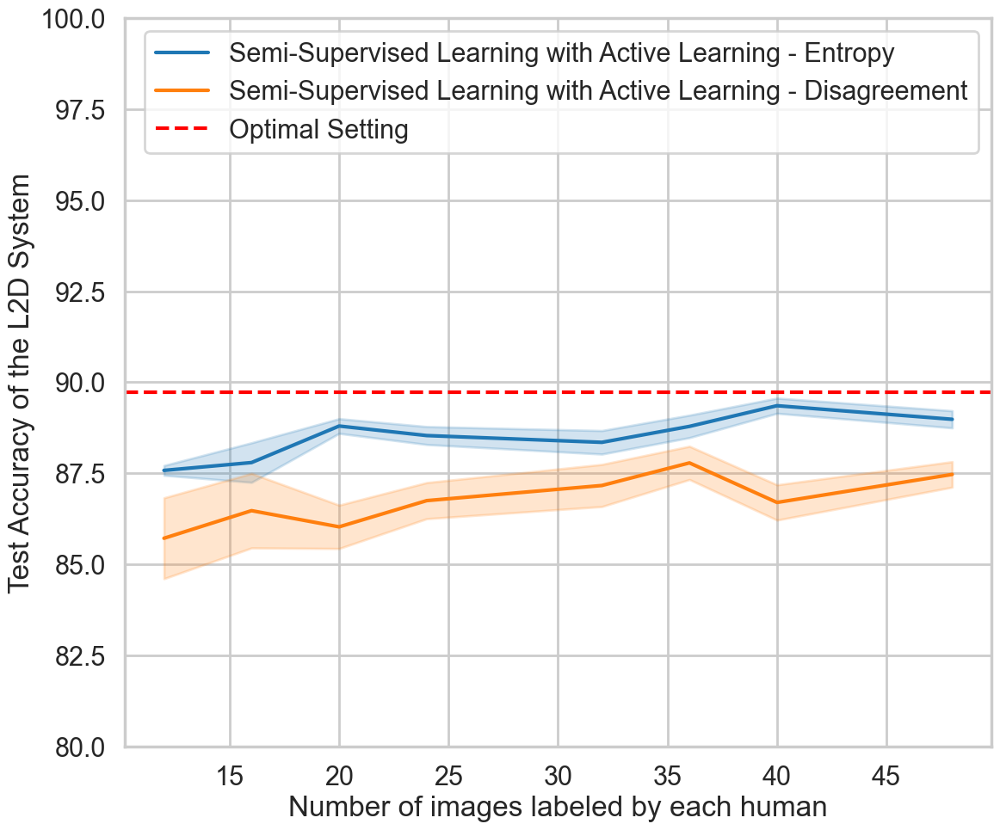

In [375]:
build_df = df.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/al_strategy_target.png", bbox_inches="tight")

In [376]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group", "mod"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "mod"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/approach_acc_al_strategy_target.csv")
pivoted_df

setting                mod       mean                                   \
group                                      0         12         16         20   
0      PERFECT            perfect  89.715056        NaN        NaN        NaN   
1       SSL_AL         confidence        NaN  87.579935  87.795213  88.797832   
2       SSL_AL  disagreement_diff        NaN  85.716884  86.474820  86.030685   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.905087   
1      88.536506  88.350447  88.788085  89.355672  ...  89.285714       NaN   
2      86.749863  87.165441  87.785784  86.700141  ...  88.165266       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      3.173166  3.763833  2.903168  2.953805  3.161843  3.023307  2.498862   
2      4.438421  4.090783  3.367628  3.434375  3.271990  2.583031  3.354155   

                 
group        48  
0           NaN  
1      3.252488  
2      2.799881  

[3 rows x 28 columns]

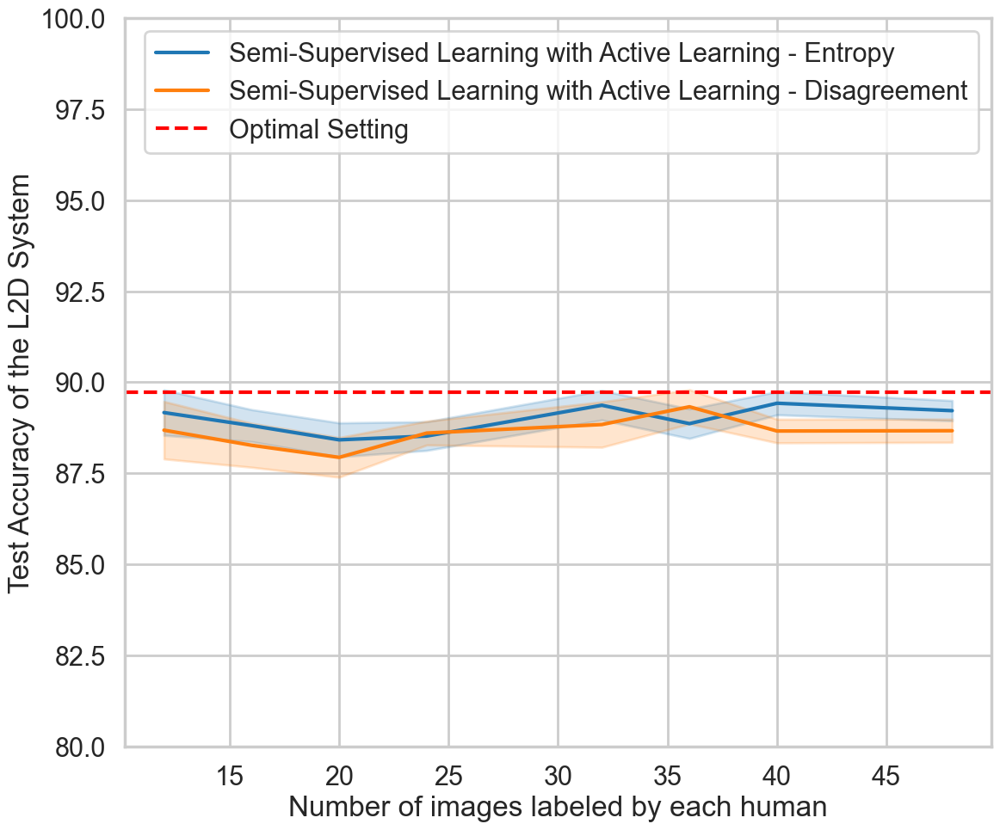

In [378]:
build_df = df.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/al_strategy_right.png", bbox_inches="tight")

In [379]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group", "mod"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "mod"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/approach_acc_al_strategy_right.csv")
pivoted_df

setting                mod       mean                                   \
group                                      0         12         16         20   
0      PERFECT            perfect  89.715056        NaN        NaN        NaN   
1       SSL_AL         confidence        NaN  89.167602  88.809340  88.418948   
2       SSL_AL  disagreement_diff        NaN  88.684321  88.269905  87.937213   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.905087   
1      88.522722  89.368600  88.863801  89.423683  ...  89.411765       NaN   
2      88.604728  88.839165  89.326992  88.661131  ...  89.411765       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      2.494275  1.758612  2.639861  2.732663  2.288810  2.296389  2.198885   
2      3.156667  2.413609  3.082399  2.269466  3.527888  2.650185  2.247752   

                 
group        48  
0           NaN  
1      2.225013  
2      2.546419  

[3 rows x 28 columns]

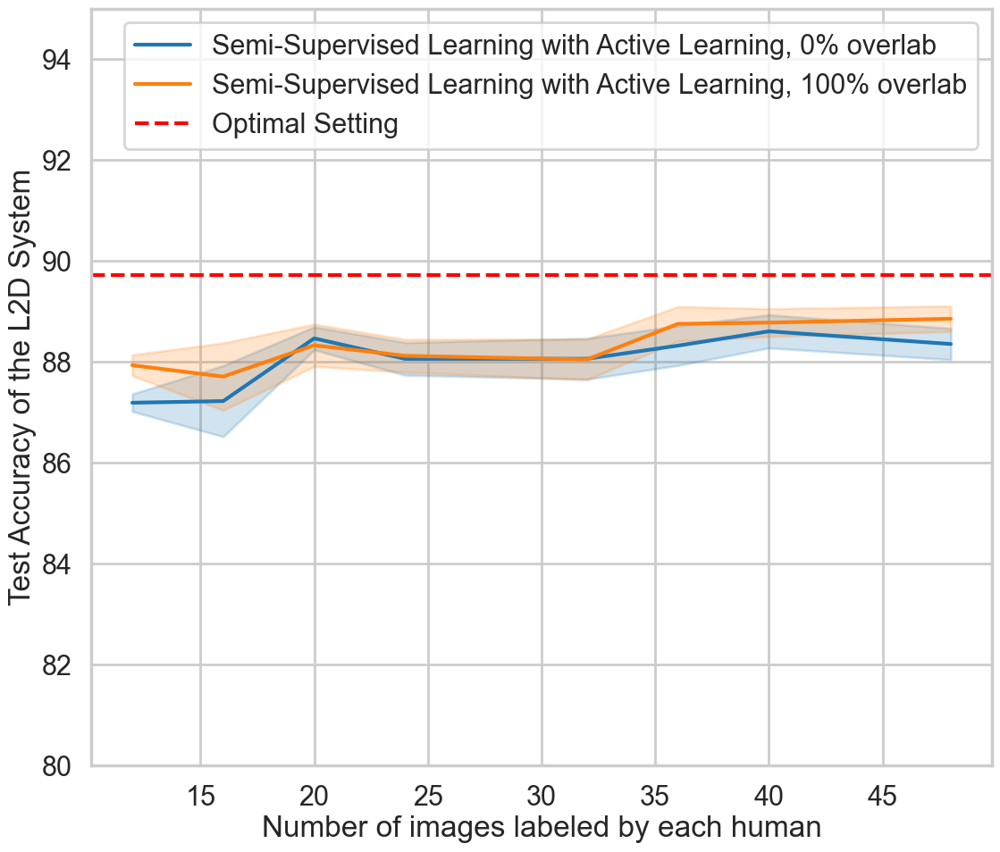

In [381]:
build_df = df.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]


dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "overlap"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning, 0% overlab", "Semi-Supervised Learning with Active Learning, 100% overlab"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/parameters_overlap_target.png", bbox_inches="tight")

In [382]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group", "overlap"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "overlap"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/approach_acc_overlap_target.csv")
pivoted_df

setting  overlap       mean                                   \
group                            0         12         16         20   
0      PERFECT  perfect  89.715056        NaN        NaN        NaN   
1       SSL_AL        0        NaN  87.189650  87.221820  88.465927   
2       SSL_AL      100        NaN  87.932846  87.708409  88.329136   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.905087   
1      88.059594  88.061115  88.321921  88.605336  ...  88.505747       NaN   
2      88.120098  88.047276  88.753098  88.778242  ...  89.024390       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      3.071991  3.985504  3.013115  3.172555  3.242580  3.135124  3.214037   
2      3.357546  3.774112  3.372667  3.179848  3.219276  2.743258  2.700451   

                 
group        48  
0           NaN  
1      3.507211  
2      2.870092  

[3 rows x 28 columns]

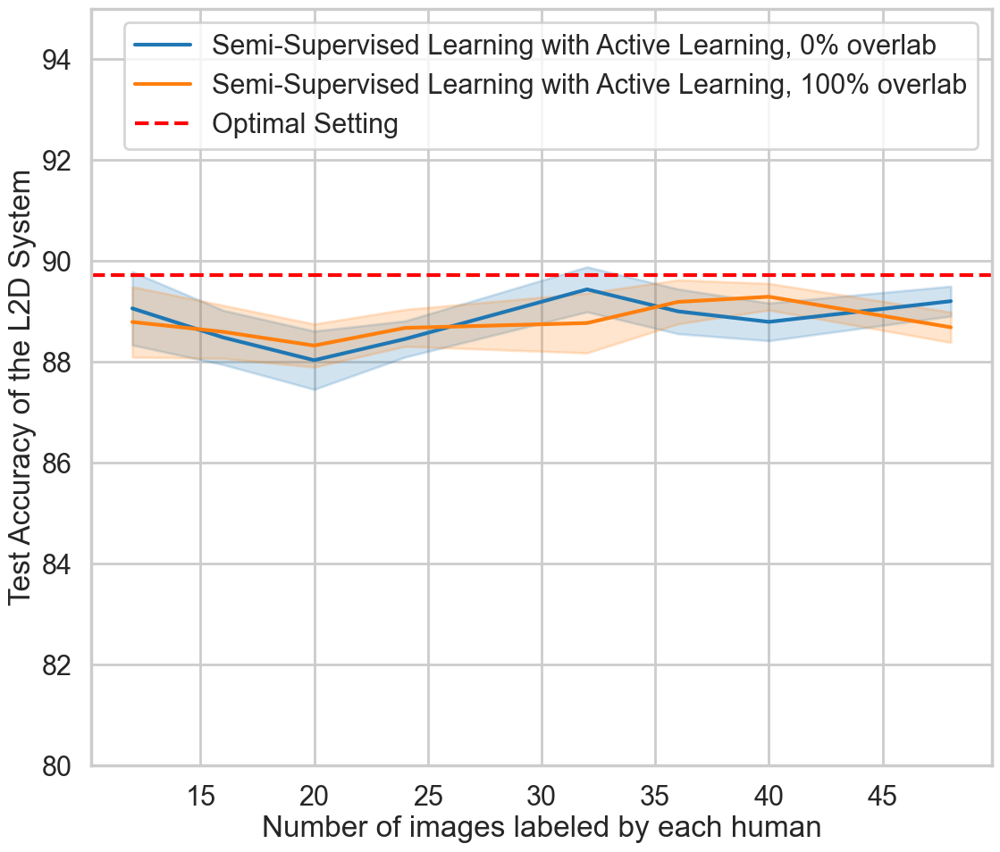

In [384]:
build_df = df.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]


dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "overlap"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning, 0% overlab", "Semi-Supervised Learning with Active Learning, 100% overlab"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/parameters_overlap_right.png", bbox_inches="tight")

In [385]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group", "overlap"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "overlap"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/approach_acc_overlap_right.csv")
pivoted_df

setting  overlap       mean                                   \
group                            0         12         16         20   
0      PERFECT  perfect  89.715056        NaN        NaN        NaN   
1       SSL_AL        0        NaN  89.060543  88.483789  88.032667   
2       SSL_AL      100        NaN  88.791380  88.595455  88.323493   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.905087   
1      88.453955  89.437843  89.001618  88.793265  ...  89.411765       NaN   
2      88.673495  88.769922  89.189175  89.291549  ...  89.411765       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      2.907954  2.153060  3.270614  2.482220  2.523795  2.509651  2.590818   
2      2.795654  2.105018  2.418524  2.536795  3.351047  2.468017  1.829013   

                 
group        48  
0           NaN  
1      2.376056  
2      2.409784  

[3 rows x 28 columns]

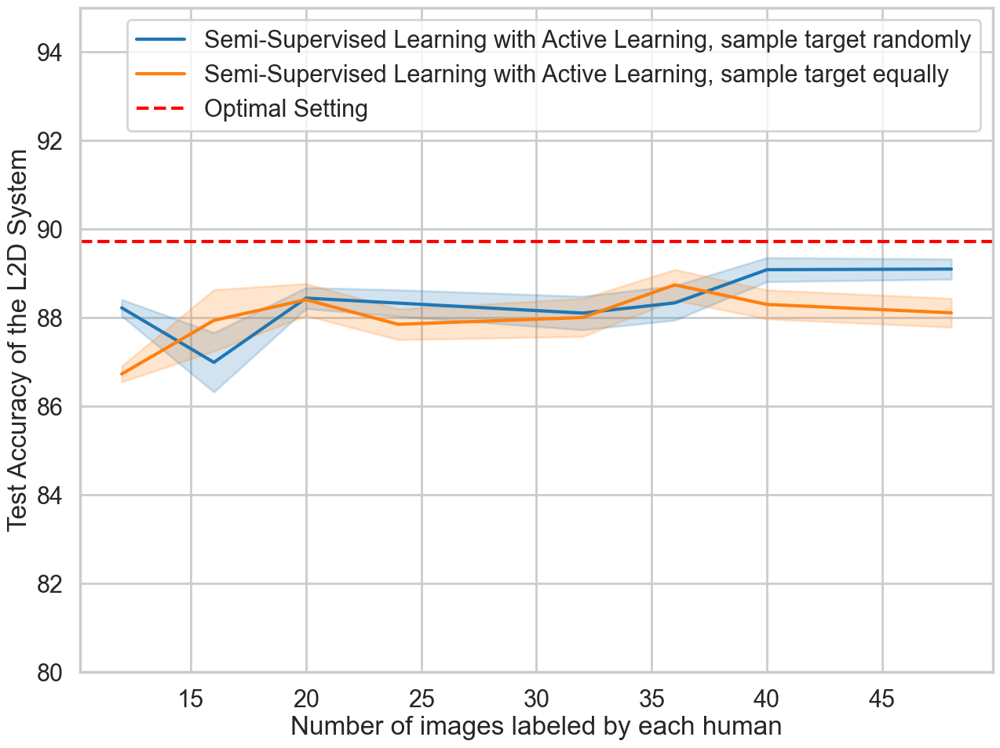

In [387]:
build_df = df.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format_w)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))

#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))

from scipy import stats

(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x)))


ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/parameters_sample_target.png", bbox_inches="tight")

In [388]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group", "sample_equal"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "sample_equal"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/approach_acc_sample_target.csv")
pivoted_df

setting sample_equal       mean                                   \
group                                0         12         16         20   
0      PERFECT      perfect  89.715056        NaN        NaN        NaN   
1       SSL_AL        False        NaN  88.223345  86.991289  88.442098   
2       SSL_AL         True        NaN  86.728419  87.938940  88.407236   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.905087   
1      88.329495  88.104156  88.333697  89.084161  ...  89.106790       NaN   
2      87.850196  88.004234  88.741322  88.299417  ...  88.505747       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      3.299916  3.792800  2.894163  2.937435  3.022337  3.121988  2.652698   
2      2.942883  3.924479  3.446186  3.381389  3.426159  2.760016  3.207743   

                 
group        48  
0           NaN  
1      2.578125  
2      3.677851  

[3 rows x 28 columns]

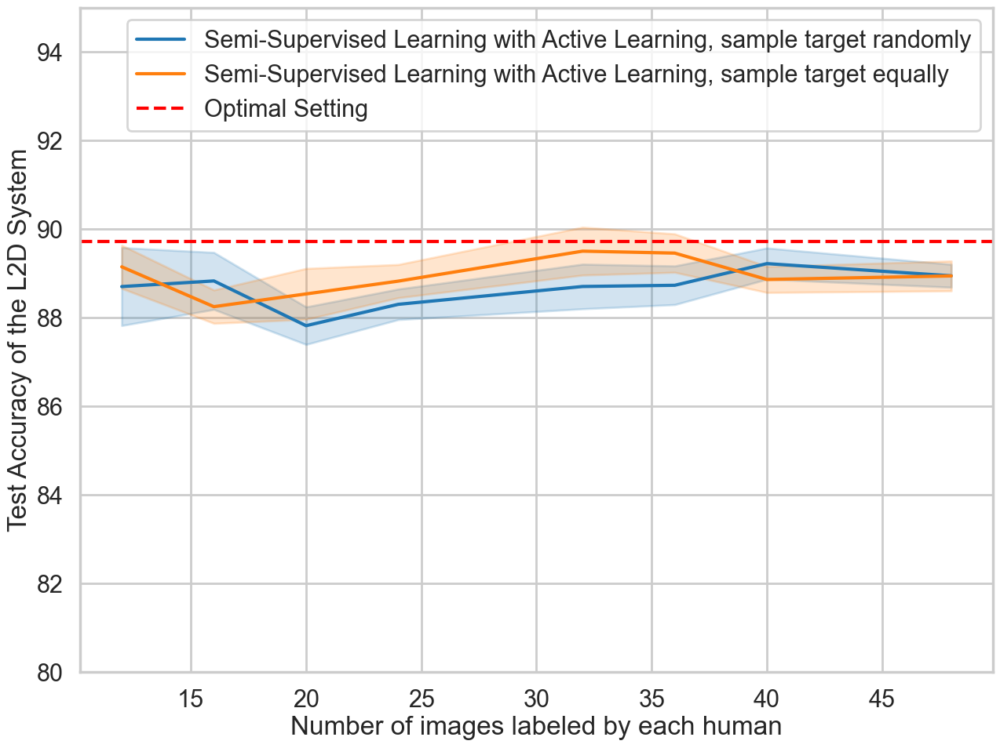

In [393]:
build_df = df.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format_w)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))

#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))

from scipy import stats

(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x)))


ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/parameters_sample_right.png", bbox_inches="tight")

In [394]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group", "sample_equal"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "sample_equal"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/approach_acc_sample_right.csv")
pivoted_df

setting sample_equal       mean                                   \
group                                0         12         16         20   
0      PERFECT      perfect  89.715056        NaN        NaN        NaN   
1       SSL_AL        False        NaN  88.702863  88.830214  87.819338   
2       SSL_AL         True        NaN  89.149061  88.249031  88.536822   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.905087   
1      88.301803  88.704847  88.731959  89.221596  ...  89.411765       NaN   
2      88.825647  89.502918  89.458833  88.863218  ...  89.411765       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      3.521510  2.573625  2.396368  2.391337  2.853651  2.470527  2.442749   
2      1.950206  1.506561  3.252930  2.600527  3.058964  2.455894  2.037598   

                 
group        48  
0           NaN  
1      2.074888  
2      2.698823  

[3 rows x 28 columns]

### Labeler [4295349121, 4295342357]

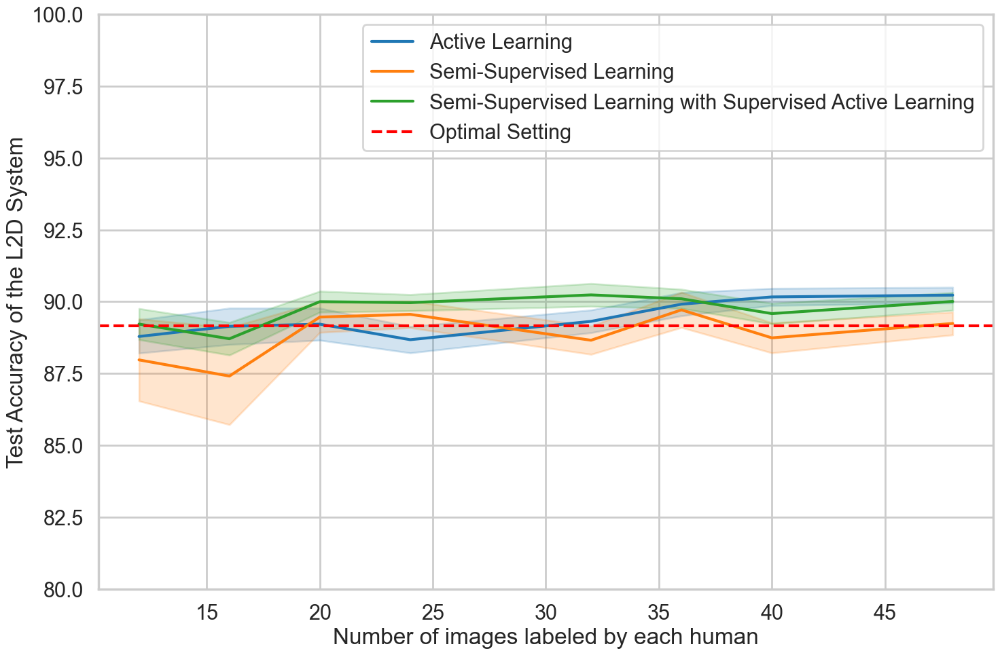

In [400]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "NORMAL"]
#dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=wide_format_h)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",),("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/overall_setting.png", bbox_inches="tight")

In [401]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/overall_setting_acc.csv")
pivoted_df

setting       mean                                              \
group                   0         12         16         20         24   
0           AL        NaN  88.788644  89.142155  89.217018  88.676565   
1      PERFECT  89.170683        NaN        NaN        NaN        NaN   
2          SSL        NaN  87.973816  87.411041  89.463952  89.558014   
3       SSL_AL        NaN  89.219597  88.709486  89.999532  89.965226   

                                                   ...     median       std  \
group         32         36         40         48  ...         48         0   
0      89.315012  89.912407  90.164638  90.226713  ...  90.400000       NaN   
1            NaN        NaN        NaN        NaN  ...        NaN  2.558562   
2      88.657393  89.713757  88.740317  89.240896  ...  88.829851       NaN   
3      90.234865  90.099702  89.584528  90.007445  ...  90.298507       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0      2.316569  2.529909  3.149850  3.181169  2.235777  2.279613  2.060945   
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2      4.039232  4.777202  2.132976  2.274835  1.961839  2.451863  2.564148   
3      2.647578  2.779309  2.525205  2.387533  2.240412  2.297327  2.857973   

                 
group        48  
0      2.177480  
1           NaN  
2      2.247009  
3      2.475483  

[4 rows x 27 columns]

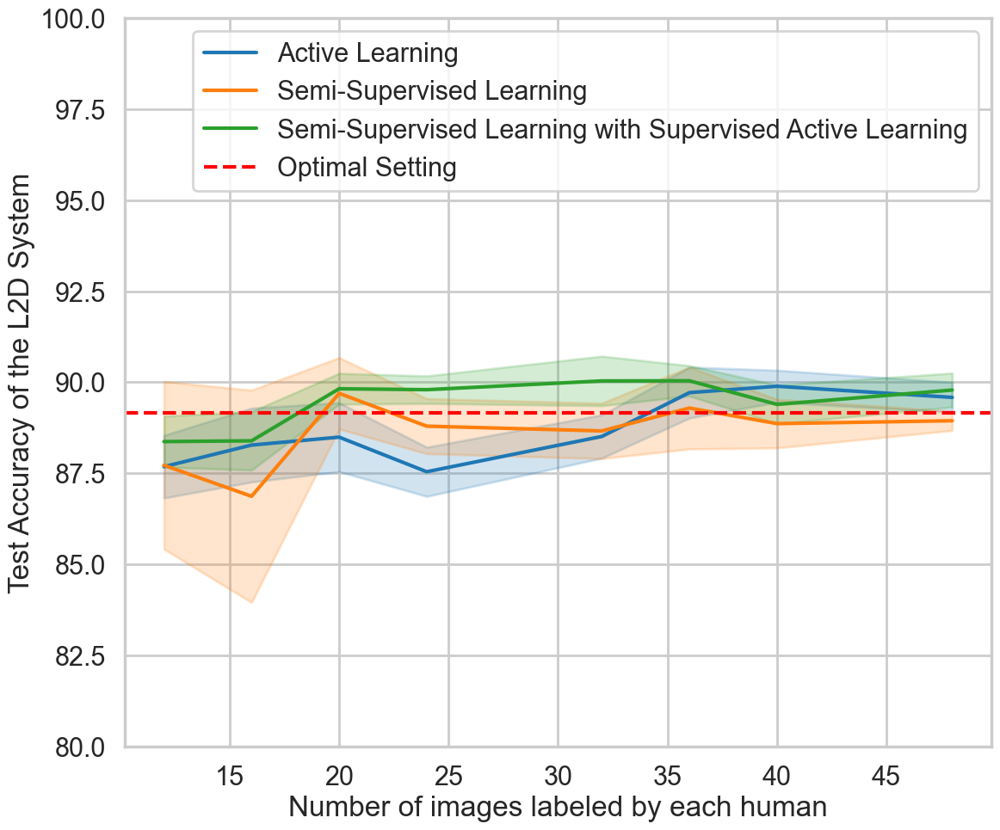

In [402]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "NORMAL"]
#dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",),("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/overall_setting_target.png", bbox_inches="tight")

In [404]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/overall_setting_acc_target.csv")
pivoted_df

setting       mean                                              \
group                   0         12         16         20         24   
0           AL        NaN  87.682280  88.275290  88.493087  87.543009   
1      PERFECT  89.170683        NaN        NaN        NaN        NaN   
2          SSL        NaN  87.720831  86.869269  89.695356  88.794354   
3       SSL_AL        NaN  88.370790  88.392075  89.821330  89.795606   

                                                   ...     median       std  \
group         32         36         40         48  ...         48         0   
0      88.511899  89.715347  89.890351  89.584807  ...  89.657143       NaN   
1            NaN        NaN        NaN        NaN  ...        NaN  2.558562   
2      88.663836  89.291861  88.864383  88.942876  ...  88.829851       NaN   
3      90.036175  90.039559  89.391439  89.786031  ...  89.976119       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0      2.433497  2.871667  3.784264  3.310784  2.379866  2.795227  2.151825   
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2      4.602616  5.827911  2.771364  2.614993  2.149693  3.178044  2.308822   
3      2.801907  3.214331  2.396441  2.618477  2.721402  2.351717  3.360978   

                 
group        48  
0      2.341447  
1           NaN  
2      1.066113  
3      2.635035  

[4 rows x 27 columns]

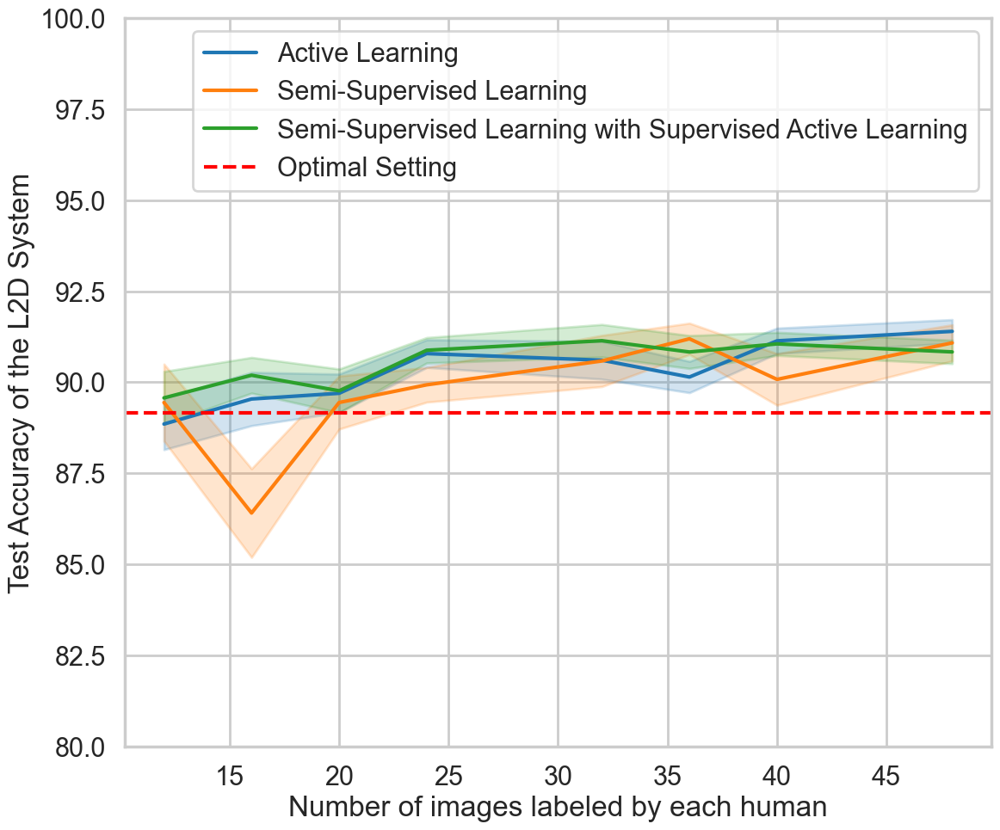

In [406]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = df[df["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "NORMAL"]
#dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",),("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/overall_setting_right.png", bbox_inches="tight")

In [407]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/overall_setting_acc_right.csv")
pivoted_df

setting       mean                                              \
group                   0         12         16         20         24   
0           AL        NaN  88.852928  89.540360  89.697182  90.786885   
1      PERFECT  89.170683        NaN        NaN        NaN        NaN   
2          SSL        NaN  89.442911  86.410016  89.443602  89.929481   
3       SSL_AL        NaN  89.570734  90.192320  89.765907  90.878327   

                                                   ...     median       std  \
group         32         36         40         48  ...         48         0   
0      90.604984  90.143474  91.136696  91.397114  ...  91.044776       NaN   
1            NaN        NaN        NaN        NaN  ...        NaN  2.558562   
2      90.583960  91.192951  90.078621  91.080676  ...  89.505882       NaN   
3      91.140428  90.830629  91.053088  90.832742  ...  90.856844       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0      3.445829  3.584940  3.654463  3.222482  3.598689  2.977900  2.962498   
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2      3.655262  4.215380  3.572189  2.849548  3.444589  2.104221  4.246964   
3      3.559582  2.400077  4.146218  2.959034  3.095299  3.135181  2.690503   

                 
group        48  
0      3.158980  
1           NaN  
2      3.435635  
3      3.156338  

[4 rows x 27 columns]

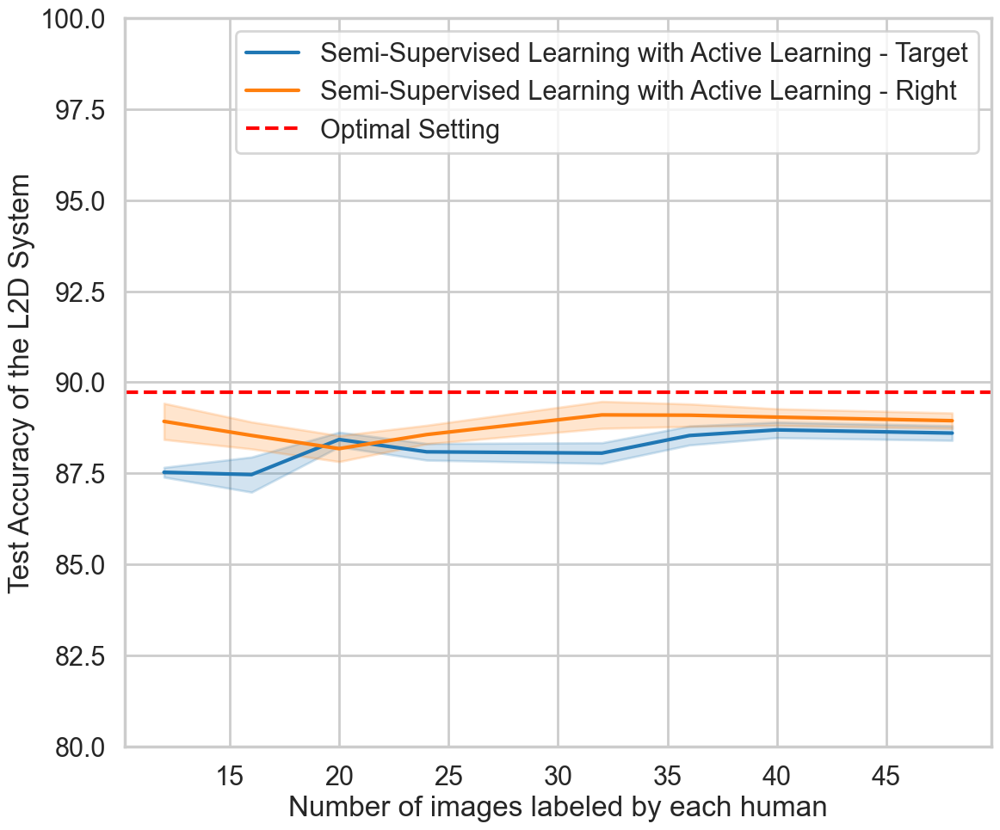

In [409]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Target", "Semi-Supervised Learning with Active Learning - Right"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/expert_strategy.png", bbox_inches="tight")

In [411]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "expert_predict", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "expert_predict"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/approach_acc_model_strategy.csv")
pivoted_df

setting expert_predict       mean                                   \
group                                  0         12         16         20   
0      PERFECT        perfect  89.715056        NaN        NaN        NaN   
1       SSL_AL          right        NaN  88.925962  88.539622  88.178080   
2       SSL_AL         target        NaN  87.528629  87.465114  88.428879   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.905087   
1      88.563725  89.103882  89.095396  89.042407  ...  89.411765       NaN   
2      88.089846  88.054195  88.537510  88.691789  ...  89.024390       NaN   

                                                                            \
group        12        16       20        24        32        36        40   
0           NaN       NaN      NaN       NaN       NaN       NaN       NaN   
1      2.809303  2.095319  2.85714  2.498850  2.961951  2.470898  2.244684   
2      3.223943  3.858122  3.10796  3.168023  3.218211  2.942066  2.961860   

                 
group        48  
0           NaN  
1      2.397661  
2      3.208060  

[3 rows x 28 columns]

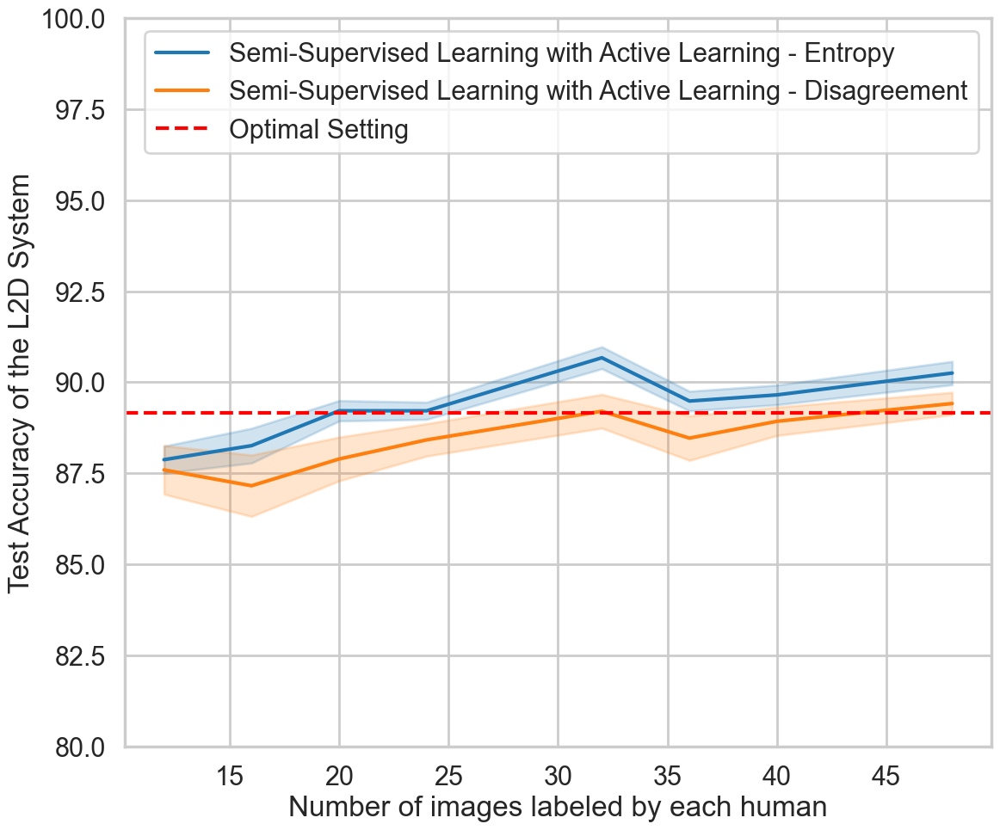

In [413]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/al_strategy_target.png", bbox_inches="tight")

In [415]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "mod", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "mod"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/approach_acc_al_strategy_target.csv")
pivoted_df

setting                mod       mean                                   \
group                                      0         12         16         20   
0      PERFECT            perfect  89.170683        NaN        NaN        NaN   
1       SSL_AL         confidence        NaN  87.874124  88.259331  89.216972   
2       SSL_AL  disagreement_diff        NaN  87.593844  87.158424  87.893313   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.558562   
1      89.216356  90.672677  89.483538  89.653112  ...  90.857143       NaN   
2      88.418175  89.203606  88.466194  88.927832  ...  89.576119       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      2.577336  3.305576  2.739426  2.834487  1.901160  2.643819  2.854922   
2      2.670726  3.373447  3.396005  3.086452  2.619884  3.458647  2.699990   

                 
group        48  
0           NaN  
1      2.563273  
2      2.457007  

[3 rows x 28 columns]

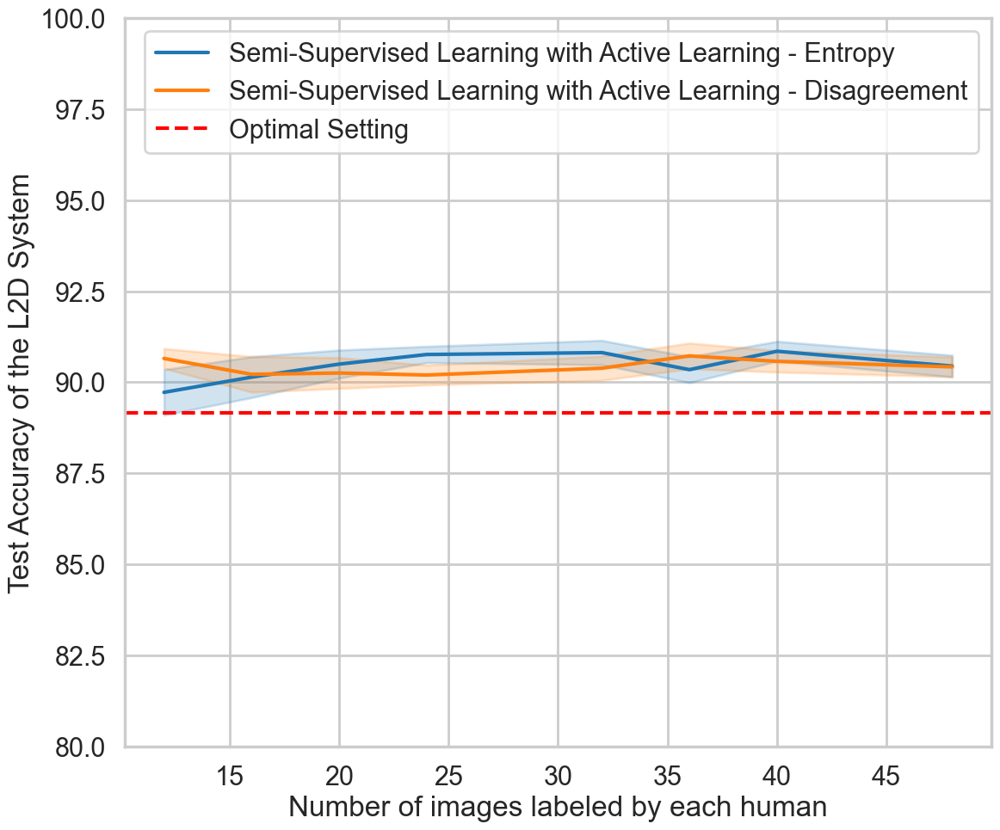

In [417]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/al_strategy_right.png", bbox_inches="tight")

In [418]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "mod", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "mod"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/approach_acc_al_strategy_right.csv")
pivoted_df

setting                mod       mean                                   \
group                                      0         12         16         20   
0      PERFECT            perfect  89.170683        NaN        NaN        NaN   
1       SSL_AL         confidence        NaN  89.722726  90.140134  90.497850   
2       SSL_AL  disagreement_diff        NaN  90.653062  90.217737  90.253209   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.558562   
1      90.761796  90.814047  90.345395  90.850861  ...  90.298507       NaN   
2      90.198598  90.385233  90.722677  90.574244  ...  90.417391       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      2.498686  2.246809  2.183238  1.554502  1.892916  2.020294  1.885815   
2      1.085167  1.952539  2.391649  1.877099  1.877936  1.998188  2.038733   

                 
group        48  
0           NaN  
1      2.378361  
2      2.170488  

[3 rows x 28 columns]

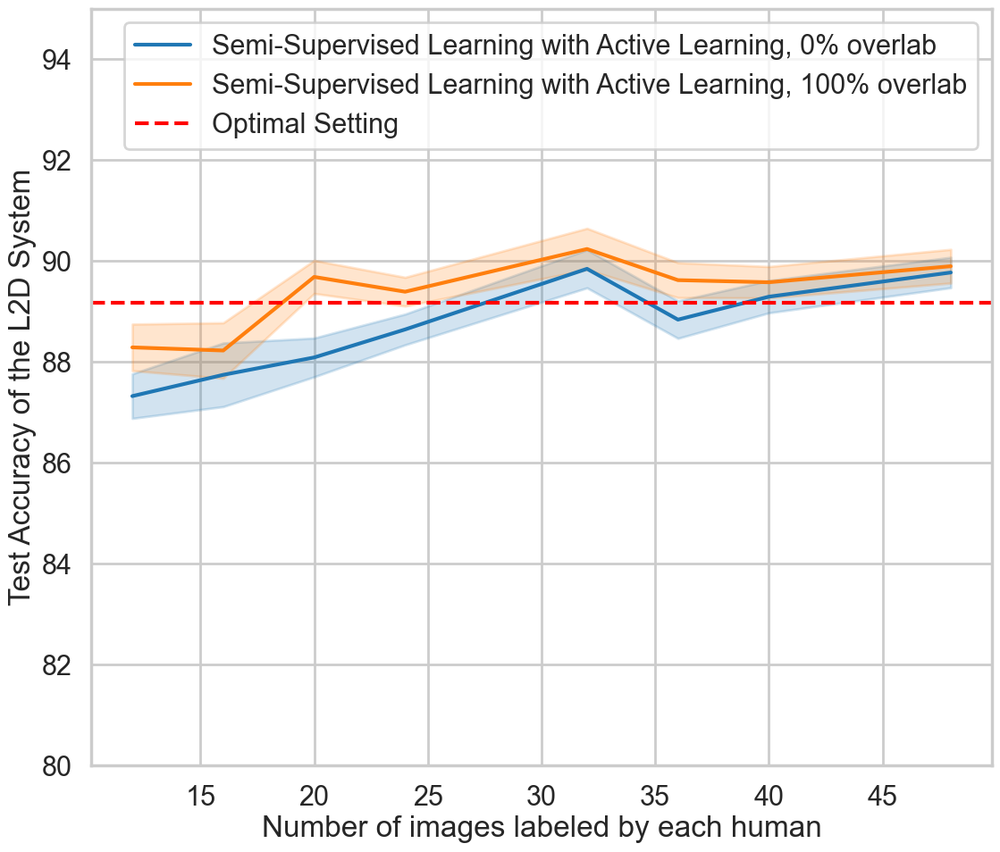

In [420]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]


dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "overlap"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning, 0% overlab", "Semi-Supervised Learning with Active Learning, 100% overlab"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/parameters_overlap_target.png", bbox_inches="tight")

In [421]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "overlap", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "overlap"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/approach_acc_overlap_target.csv")
pivoted_df

setting  overlap       mean                                   \
group                            0         12         16         20   
0      PERFECT  perfect  89.170683        NaN        NaN        NaN   
1       SSL_AL        0        NaN  87.320879  87.742920  88.087717   
2       SSL_AL      100        NaN  88.287229  88.225288  89.684398   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.558562   
1      88.642576  89.845240  88.837659  89.292452  ...  90.349254       NaN   
2      89.391045  90.237902  89.620745  89.578604  ...  90.349254       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      2.499278  3.569323  3.077972  2.989887  2.387555  2.969588  2.865143   
2      2.612378  3.111593  2.624834  2.797440  2.321357  2.773207  2.786101   

                 
group        48  
0           NaN  
1      2.410967  
2      2.672514  

[3 rows x 28 columns]

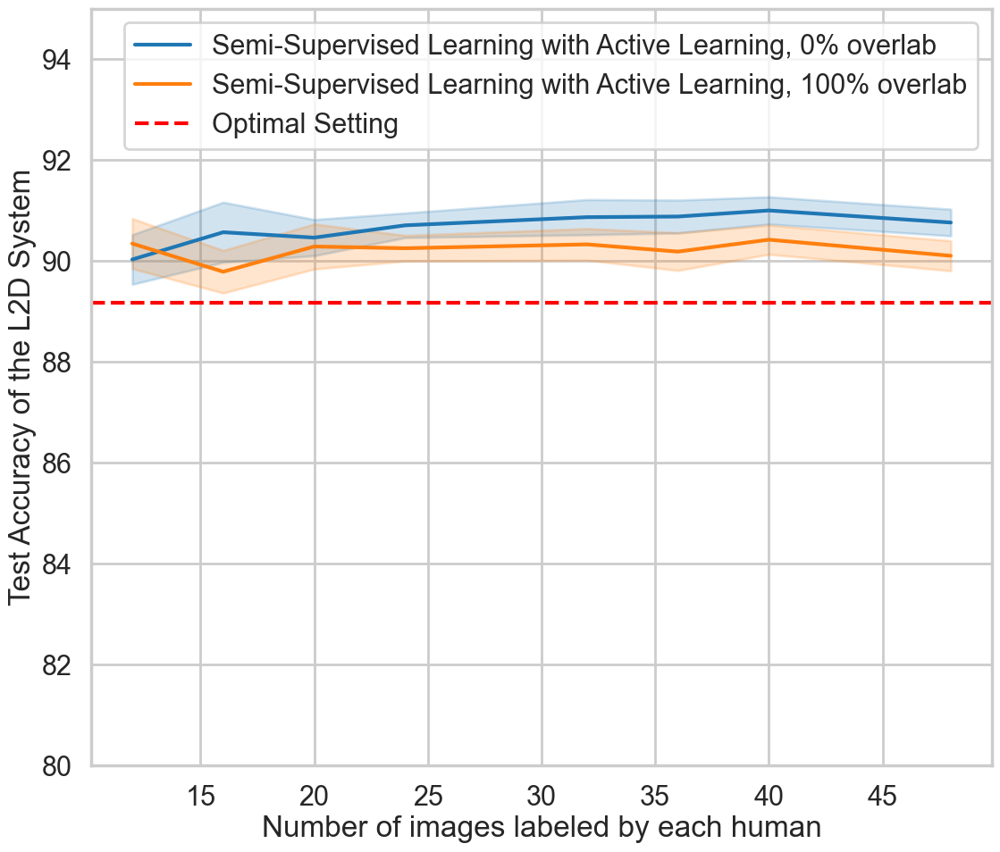

In [426]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]


dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "overlap"]].apply(tuple, axis=1), hue_order=[("SSL_AL", "right", 0), ("SSL_AL", "right", 100)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning, 0% overlab", "Semi-Supervised Learning with Active Learning, 100% overlab"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/parameters_overlap_right.png", bbox_inches="tight")

In [428]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "overlap", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "overlap"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/approach_acc_overlap_right.csv")
pivoted_df

setting  overlap       mean                                   \
group                            0         12         16         20   
0      PERFECT  perfect  89.170683        NaN        NaN        NaN   
1       SSL_AL        0        NaN  90.030333  90.570395  90.463679   
2       SSL_AL      100        NaN  90.345455  89.787476  90.287381   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.558562   
1      90.707313  90.869298  90.881633  91.002130  ...  90.739779       NaN   
2      90.253081  90.329983  90.186439  90.422976  ...  90.298507       NaN   

                                                                            \
group        12        16        20       24        32        36        40   
0           NaN       NaN       NaN      NaN       NaN       NaN       NaN   
1      1.970438  2.381701  2.030226  1.69646  1.975303  1.845807  1.876390   
2      1.986716  1.692442  2.525776  1.76596  1.775594  2.119284  2.014867   

                 
group        48  
0           NaN  
1      2.114458  
2      2.382430  

[3 rows x 28 columns]

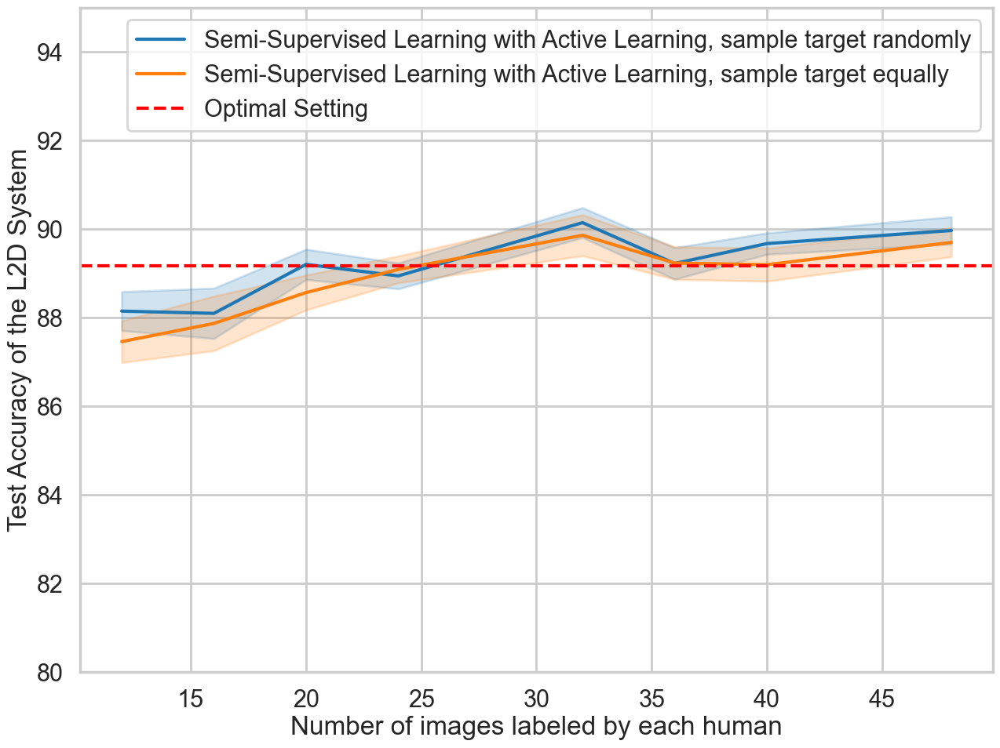

In [431]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format_w)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))

#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))

from scipy import stats

(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x)))


ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/parameters_sample_target.png", bbox_inches="tight")

In [432]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "sample_equal", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "sample_equal"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/approach_acc_sample_target.csv")
pivoted_df

setting sample_equal       mean                                   \
group                                0         12         16         20   
0      PERFECT      perfect  89.170683        NaN        NaN        NaN   
1       SSL_AL        False        NaN  88.148449  88.097612  89.204094   
2       SSL_AL         True        NaN  87.459658  87.870597  88.568021   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.558562   
1      88.943735  90.146723  89.224815  89.673891  ...  90.349254       NaN   
2      89.089887  89.861049  89.233589  89.197165  ...  90.349254       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      2.484790  3.220581  2.739416  2.864029  2.136340  2.855445  2.166054   
2      2.670925  3.484742  3.154154  2.972321  2.619173  2.943977  3.347537   

                 
group        48  
0           NaN  
1      2.481885  
2      2.601214  

[3 rows x 28 columns]

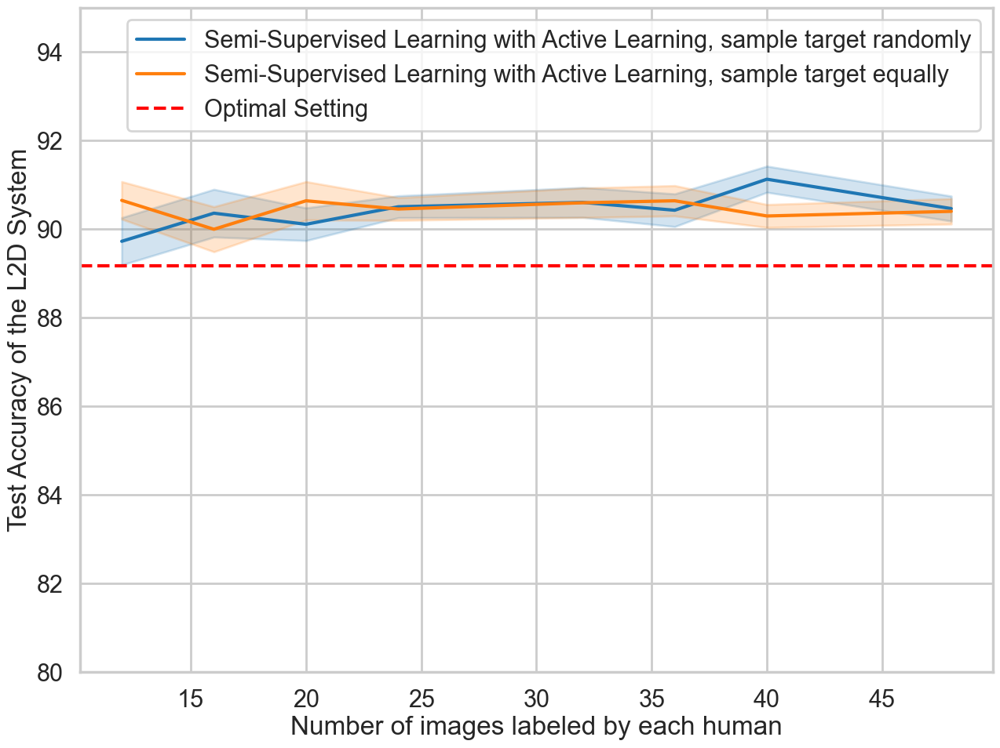

In [435]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format_w)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), hue_order=[("SSL_AL", "right", False), ("SSL_AL", "right", True)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))

#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))

from scipy import stats

(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x)))


ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/parameters_sample_right.png", bbox_inches="tight")

In [436]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "sample_equal", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "sample_equal"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/approach_acc_sample_right.csv")
pivoted_df

setting sample_equal       mean                                  \
group                                0         12        16         20   
0      PERFECT      perfect  89.170683        NaN       NaN        NaN   
1       SSL_AL        False        NaN  89.725406  90.36032  90.110362   
2       SSL_AL         True        NaN  90.650382  89.99755  90.640697   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.558562   
1      90.505760  90.603741  90.427198  91.127763  ...  90.417391       NaN   
2      90.454634  90.595540  90.640873  90.297343  ...  90.349254       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      2.134584  2.156135  2.088619  1.714613  1.910366  2.090628  2.044625   
2      1.694069  2.035845  2.451511  1.777840  1.885509  1.937400  1.794208   

                 
group        48  
0           NaN  
1      2.256296  
2      2.296737  

[3 rows x 28 columns]

### Labeler [4295342357, 4295354117]

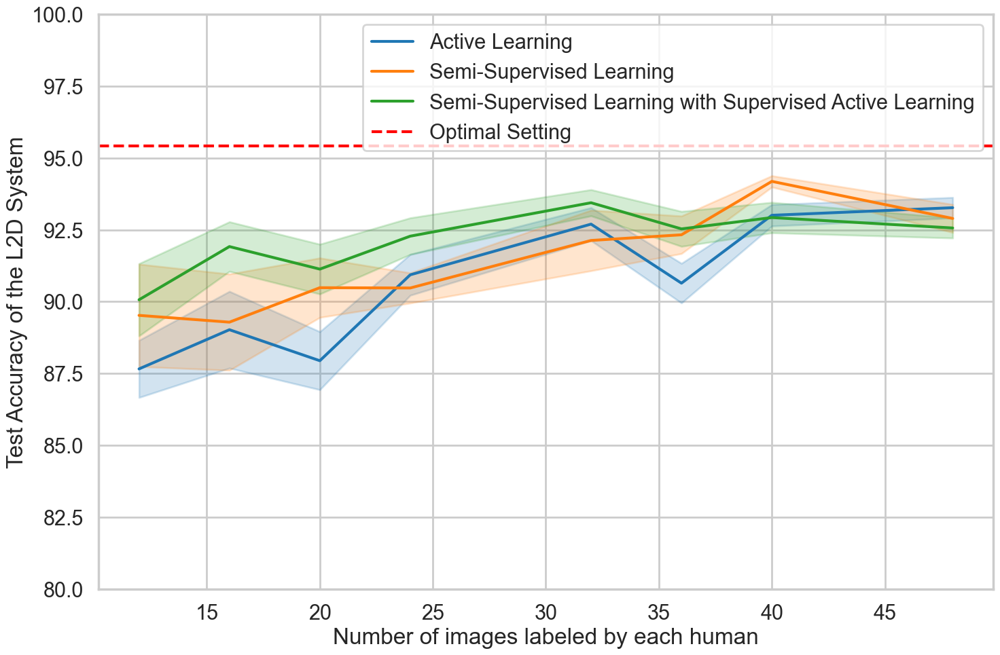

In [438]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "NORMAL"]
#dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=wide_format_h)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/overall_setting.png", bbox_inches="tight")

In [439]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/overall_setting_acc.csv")
pivoted_df

setting       mean                                              \
group                   0         12         16         20         24   
0           AL        NaN  87.660035  89.023505  87.945294  90.934079   
1      PERFECT  95.422374        NaN        NaN        NaN        NaN   
2          SSL        NaN  89.523003  89.286499  90.485413  90.475400   
3       SSL_AL        NaN  90.065615  91.916331  91.131934  92.278213   

                                                   ...     median       std  \
group         32         36         40         48  ...         48         0   
0      92.697064  90.642913  93.004788  93.268278  ...  94.029851       NaN   
1            NaN        NaN        NaN        NaN  ...        NaN  2.470611   
2      92.128733  92.326116  94.184309  92.894563  ...  93.750000       NaN   
3      93.440745  92.531293  92.925368  92.562768  ...  92.753623       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0      3.978991  5.337499  5.711678  4.929550  3.240035  3.898780  2.586551   
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2      5.038306  4.735218  4.136909  2.573357  4.217160  2.612620  0.961180   
3      5.029345  3.445835  4.899306  4.411836  2.580455  3.444901  3.667364   

                 
group        48  
0      2.854345  
1           NaN  
2      2.757161  
3      2.802432  

[4 rows x 27 columns]

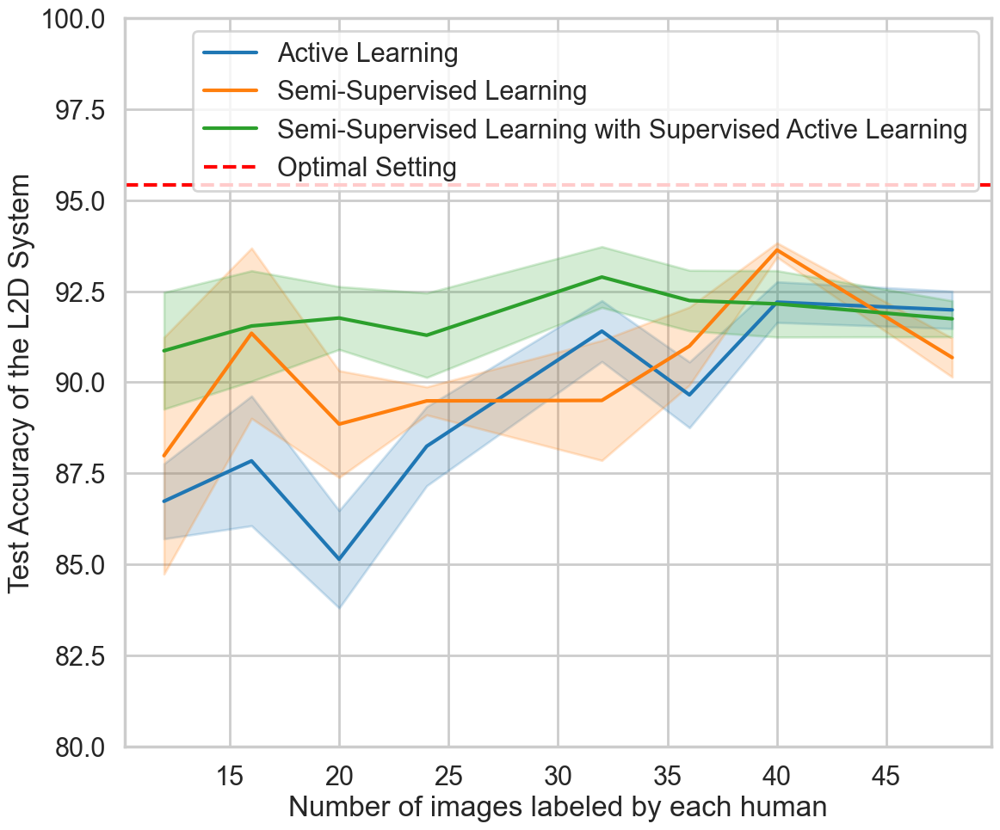

In [441]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "NORMAL"]
#dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/overall_setting_target.png", bbox_inches="tight")

In [295]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/overall_setting_acc_target.csv")
pivoted_df

setting       mean                                              \
group                   0         12         16         20         24   
0           AL        NaN  86.731974  87.841829  85.140745  88.243551   
1      PERFECT  95.422374        NaN        NaN        NaN        NaN   
2          SSL        NaN  87.984669  91.345413  88.850838  89.488022   
3       SSL_AL        NaN  90.864757  91.544866  91.763478  91.290533   

                                                   ...     median       std  \
group         32         36         40         48  ...         48         0   
0      91.403462  89.653972  92.198822  91.987223  ...  91.920831       NaN   
1            NaN        NaN        NaN        NaN  ...        NaN  2.470611   
2      89.501372  90.993910  93.630016  90.677388  ...  90.449924       NaN   
3      92.888120  92.242380  92.151744  91.742365  ...  92.753623       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0      2.913580  5.038434  5.351682  5.317037  3.340651  3.613901  2.734522   
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2      6.497620  4.676044  4.148224  1.332929  4.659604  3.025874  0.680199   
3      4.531135  4.291415  3.454014  5.677881  3.341605  3.326634  4.464813   

                 
group        48  
0      2.904297  
1           NaN  
2      2.135691  
3      2.795568  

[4 rows x 27 columns]

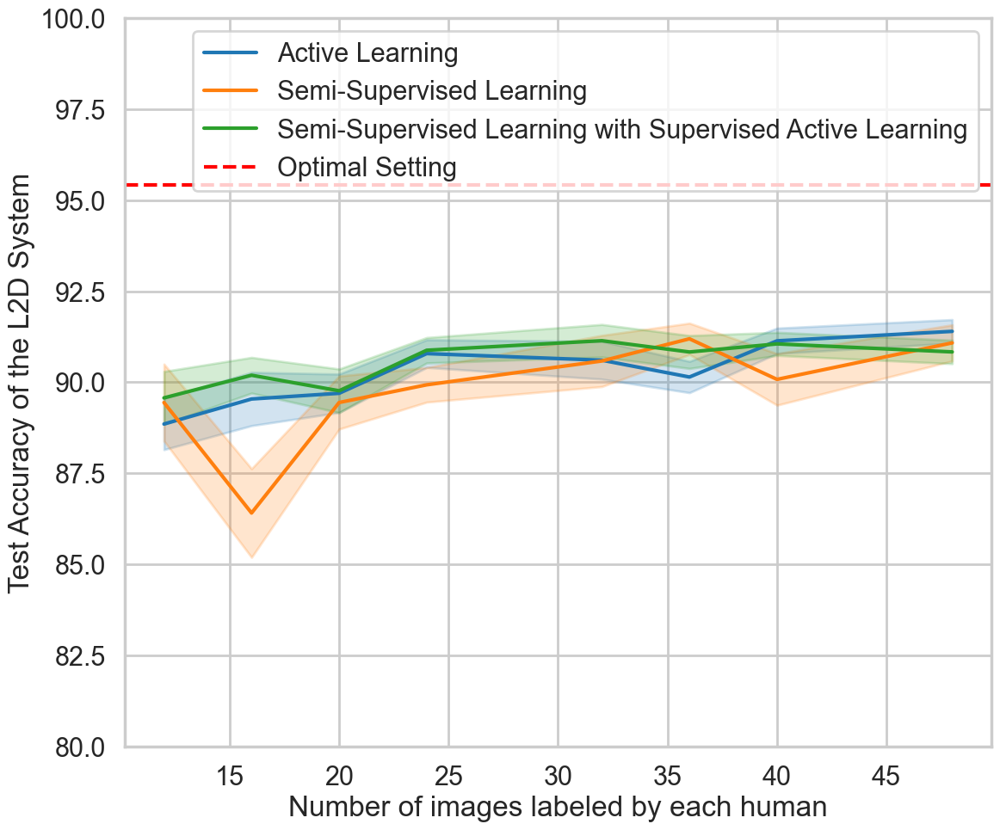

In [299]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = df[df["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "NORMAL"]
#dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/overall_setting_right.png", bbox_inches="tight")

In [300]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/overall_setting_acc_right.csv")
pivoted_df

setting       mean                                              \
group                   0         12         16         20         24   
0           AL        NaN  88.852928  89.540360  89.697182  90.786885   
1      PERFECT  95.422374        NaN        NaN        NaN        NaN   
2          SSL        NaN  89.442911  86.410016  89.443602  89.929481   
3       SSL_AL        NaN  89.570734  90.192320  89.765907  90.878327   

                                                   ...     median       std  \
group         32         36         40         48  ...         48         0   
0      90.604984  90.143474  91.136696  91.397114  ...  91.044776       NaN   
1            NaN        NaN        NaN        NaN  ...        NaN  2.470611   
2      90.583960  91.192951  90.078621  91.080676  ...  89.505882       NaN   
3      91.140428  90.830629  91.053088  90.832742  ...  90.856844       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0      3.445829  3.584940  3.654463  3.222482  3.598689  2.977900  2.962498   
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2      3.655262  4.215380  3.572189  2.849548  3.444589  2.104221  4.246964   
3      3.559582  2.400077  4.146218  2.959034  3.095299  3.135181  2.690503   

                 
group        48  
0      3.158980  
1           NaN  
2      3.435635  
3      3.156338  

[4 rows x 27 columns]

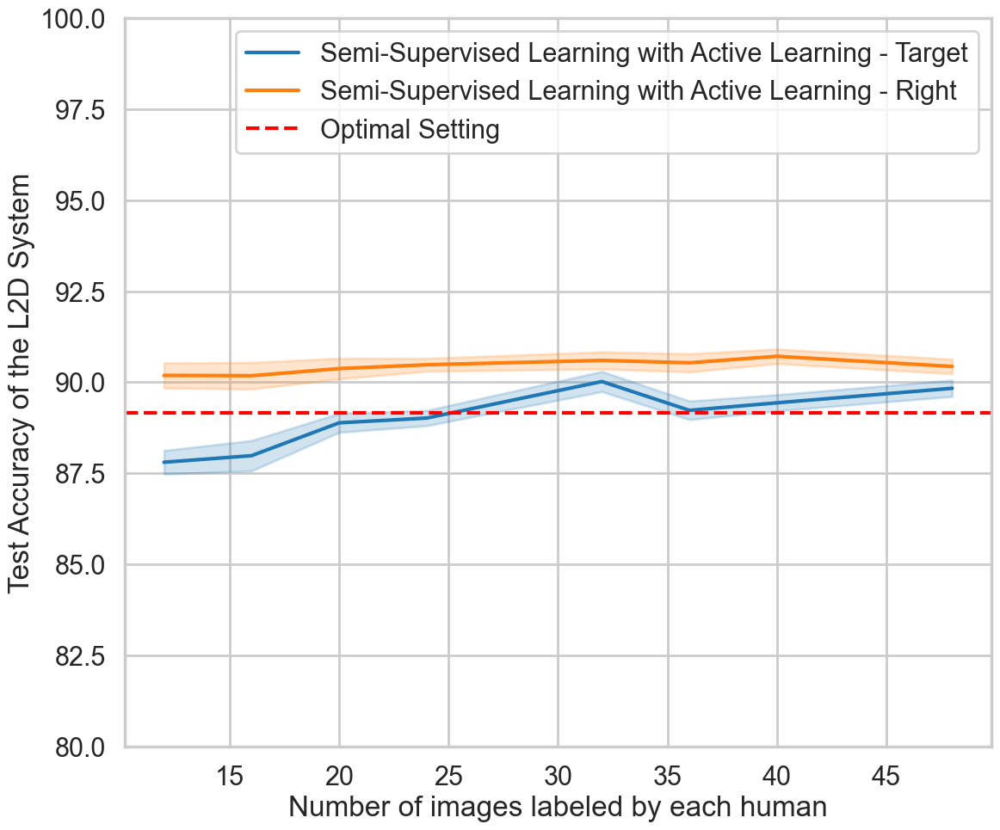

In [444]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), hue_order=[("SSL_AL", "target"), ("SSL_AL", "right")], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Target", "Semi-Supervised Learning with Active Learning - Right"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/expert_strategy.png", bbox_inches="tight")

In [445]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "expert_predict", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "expert_predict"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/approach_acc_model_strategy.csv")
pivoted_df

setting expert_predict       mean                                   \
group                                  0         12         16         20   
0      PERFECT        perfect  89.170683        NaN        NaN        NaN   
1       SSL_AL          right        NaN  90.187894  90.178935  90.375530   
2       SSL_AL         target        NaN  87.804054  87.984104  88.886057   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.558562   
1      90.480197  90.599640  90.534036  90.712553  ...  90.400000       NaN   
2      89.016811  90.019757  89.229202  89.435528  ...  90.349254       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      1.952991  2.070971  2.274913  1.737486  1.882859  2.002308  1.958342   
2      2.582418  3.330492  2.959691  2.911949  2.350028  2.888612  2.820652   

                 
group        48  
0           NaN  
1      2.267844  
2      2.535832  

[3 rows x 28 columns]

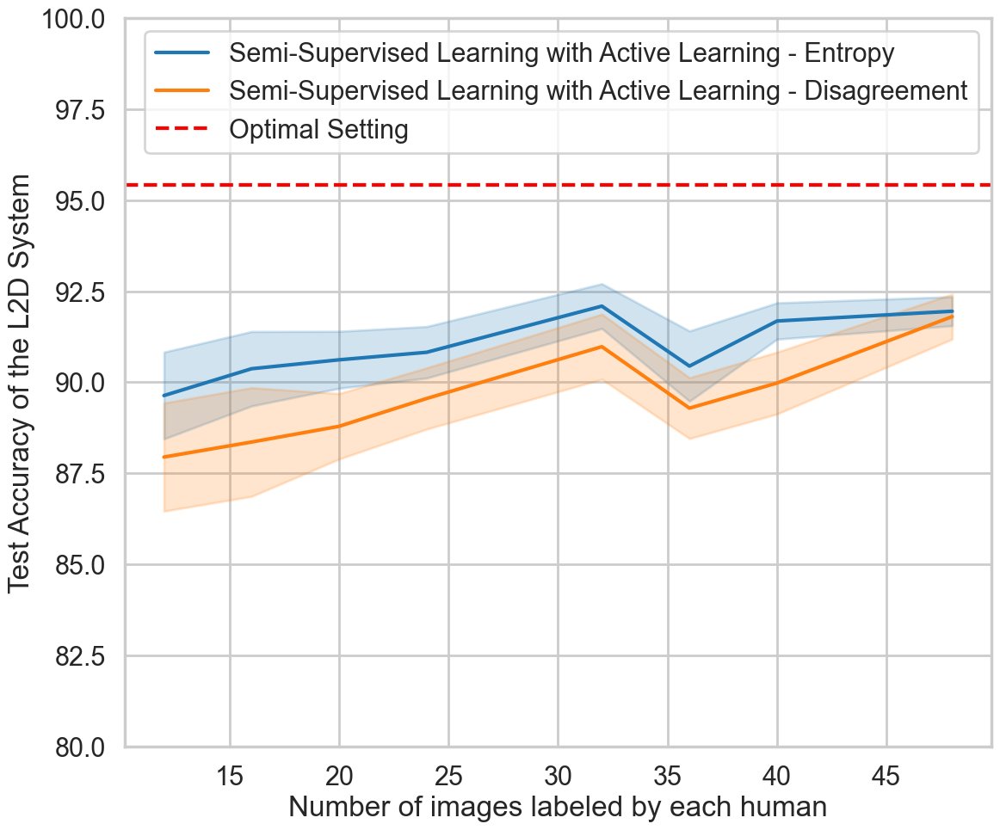

In [447]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/al_strategy_target.png", bbox_inches="tight")

In [449]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "mod", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "mod"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/approach_acc_al_strategy_target.csv")
pivoted_df

setting                mod       mean                                   \
group                                      0         12         16         20   
0      PERFECT            perfect  95.422374        NaN        NaN        NaN   
1       SSL_AL         confidence        NaN  89.634813  90.370899  90.616286   
2       SSL_AL  disagreement_diff        NaN  87.946498  88.358437  88.790771   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.470611   
1      90.822531  92.090087  90.443355  91.681165  ...  92.537313       NaN   
2      89.554520  90.976524  89.288960  89.977751  ...  92.753623       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      4.768648  4.088708  4.422043  4.899554  3.479921  5.454794  3.452389   
2      5.942569  5.966495  5.081399  5.823906  5.055488  4.723828  5.094200   

                 
group        48  
0           NaN  
1      3.186011  
2      3.026597  

[3 rows x 28 columns]

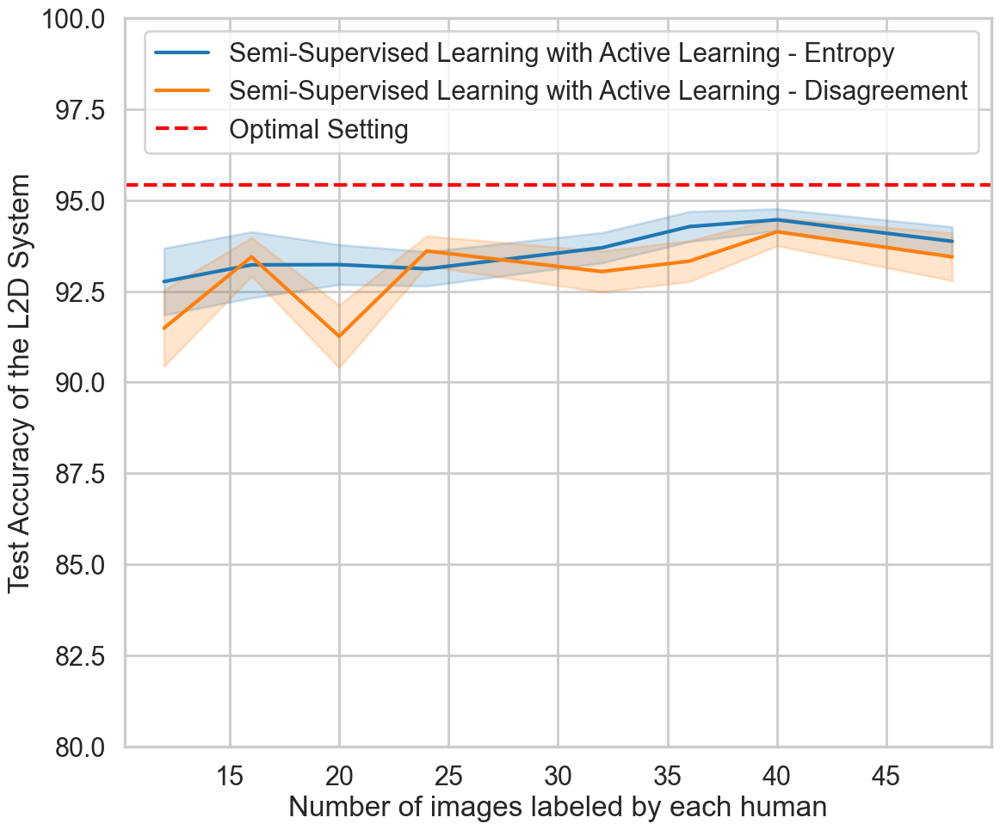

In [307]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/al_strategy_right.png", bbox_inches="tight")

In [310]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "mod", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "mod"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/approach_acc_al_strategy_right.csv")
pivoted_df

setting                mod       mean                                   \
group                                      0         12         16         20   
0      PERFECT            perfect  95.422374        NaN        NaN        NaN   
1       SSL_AL         confidence        NaN  92.764227  93.223569  93.229811   
2       SSL_AL  disagreement_diff        NaN  91.485930  93.442815  91.262068   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.470611   
1      93.114372  93.692162  94.273854  94.459945  ...  94.116375       NaN   
2      93.603906  93.038544  93.324953  94.131593  ...  94.029851       NaN   

                                                                            \
group        12        16        20        24        32       36        40   
0           NaN       NaN       NaN       NaN       NaN      NaN       NaN   
1      3.665347  3.629910  3.103906  3.255967  2.353191  2.34417  1.800838   
2      4.193342  2.116386  4.858964  2.859811  3.185168  3.16395  2.312866   

                
group       48  
0          NaN  
1      1.95360  
2      3.20599  

[3 rows x 28 columns]

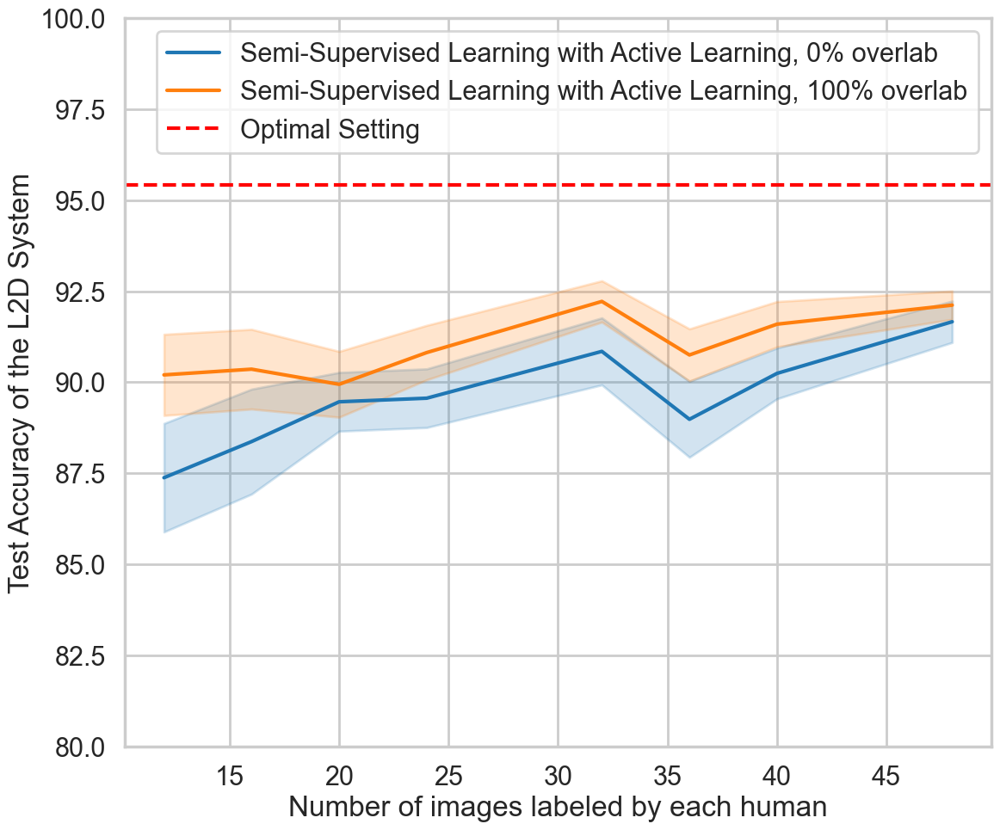

In [315]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]


dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "overlap"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning, 0% overlab", "Semi-Supervised Learning with Active Learning, 100% overlab"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/parameters_overlap_target.png", bbox_inches="tight")

In [314]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "overlap", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "overlap"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/approach_acc_overlap_target.csv")
pivoted_df

setting  overlap       mean                                   \
group                            0         12         16         20   
0      PERFECT  perfect  95.422374        NaN        NaN        NaN   
1       SSL_AL        0        NaN  87.379319  88.370520  89.463560   
2       SSL_AL      100        NaN  90.201992  90.358816  89.943498   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.470611   
1      89.562104  90.847731  88.982989  90.243281  ...  92.645468       NaN   
2      90.814947  92.218880  90.749325  91.594630  ...  92.753623       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      5.955568  5.761628  4.565545  5.578678  5.201287  5.890239  4.408451   
2      4.456034  4.378561  5.111947  5.178937  3.206881  4.056097  4.125808   

                 
group        48  
0           NaN  
1      3.593387  
2      2.699302  

[3 rows x 28 columns]

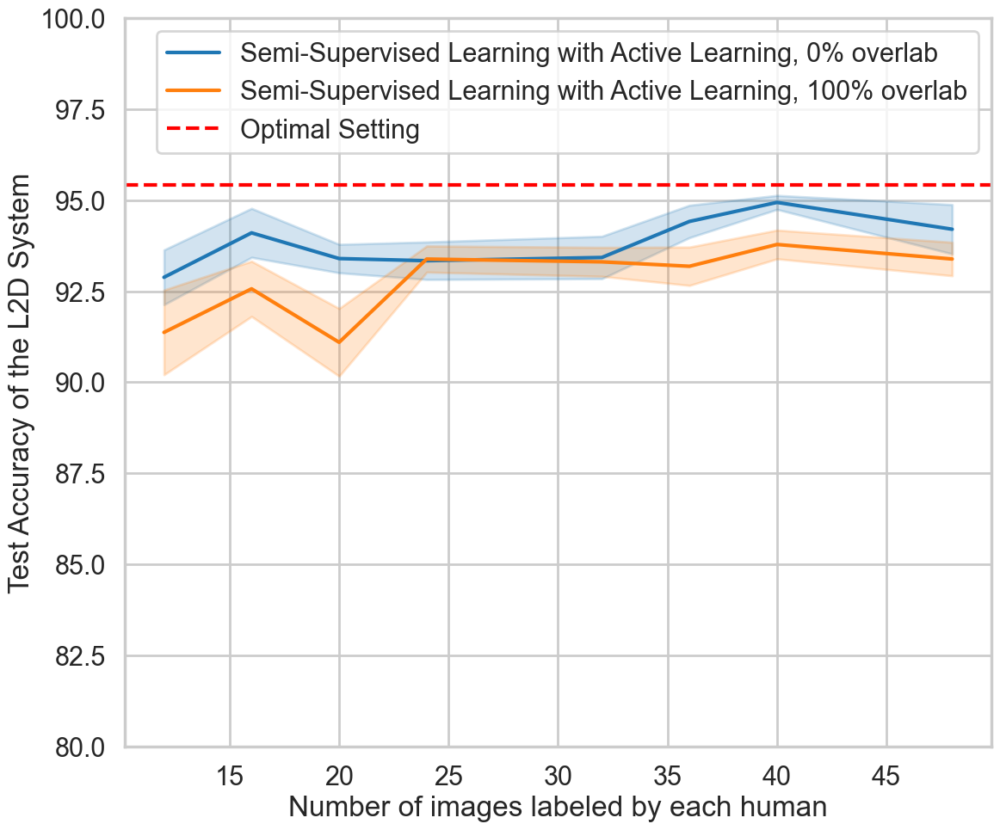

In [321]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]


dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "overlap"]].apply(tuple, axis=1), hue_order=[("SSL_AL", 0), ("SSL_AL", 100)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning, 0% overlab", "Semi-Supervised Learning with Active Learning, 100% overlab"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/parameters_overlap_right.png", bbox_inches="tight")

In [323]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "overlap", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "overlap"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/approach_acc_overlap_right.csv")
pivoted_df

setting  overlap       mean                                   \
group                            0         12         16         20   
0      PERFECT  perfect  95.422374        NaN        NaN        NaN   
1       SSL_AL        0        NaN  92.881043  94.101440  93.395455   
2       SSL_AL      100        NaN  91.369114  92.564944  91.096424   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.470611   
1      93.336406  93.425314  94.414614  94.937454  ...  95.417444       NaN   
2      93.381872  93.305393  93.184194  93.782421  ...  93.889925       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      3.006065  2.688157  2.211275  3.565028  3.289566  2.514061  1.086942   
2      4.651321  3.032439  5.255898  2.488319  2.252695  2.978011  2.492715   

                 
group        48  
0           NaN  
1      2.705772  
2      2.599201  

[3 rows x 28 columns]

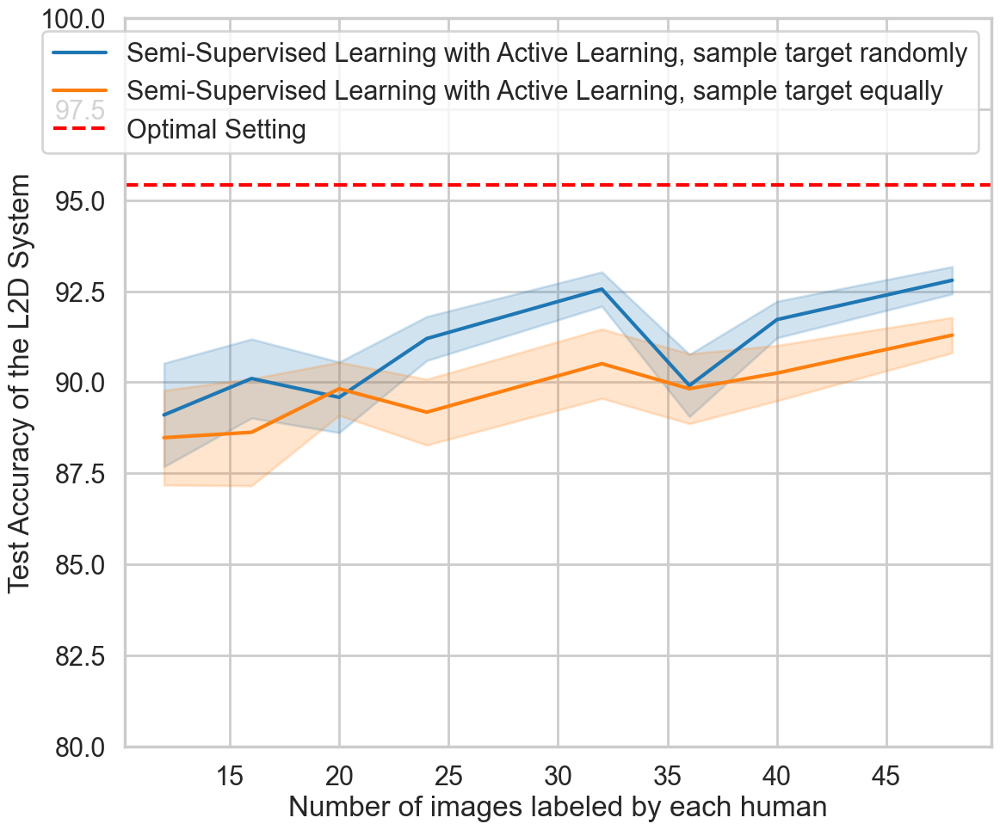

In [325]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))

#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))

from scipy import stats

(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x)))


ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/parameters_sample_target.png", bbox_inches="tight")

In [327]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "sample_equal", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "sample_equal"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/approach_acc_sample_target.csv")
pivoted_df

setting sample_equal       mean                                   \
group                                0         12         16         20   
0      PERFECT      perfect  95.422374        NaN        NaN        NaN   
1       SSL_AL        False        NaN  89.102551  90.102498  89.585868   
2       SSL_AL         True        NaN  88.478759  88.626839  89.821190   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.470611   
1      91.198925  92.556505  89.909773  91.721091  ...  92.753623       NaN   
2      89.178126  90.510107  89.822542  90.251167  ...  92.470562       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      5.683141  4.338345  5.479304  4.184533  2.667780  4.828002  3.172323   
2      5.202762  5.873158  4.128405  6.256914  5.387889  5.426196  5.035711   

                 
group        48  
0           NaN  
1      2.249157  
2      3.501465  

[3 rows x 28 columns]

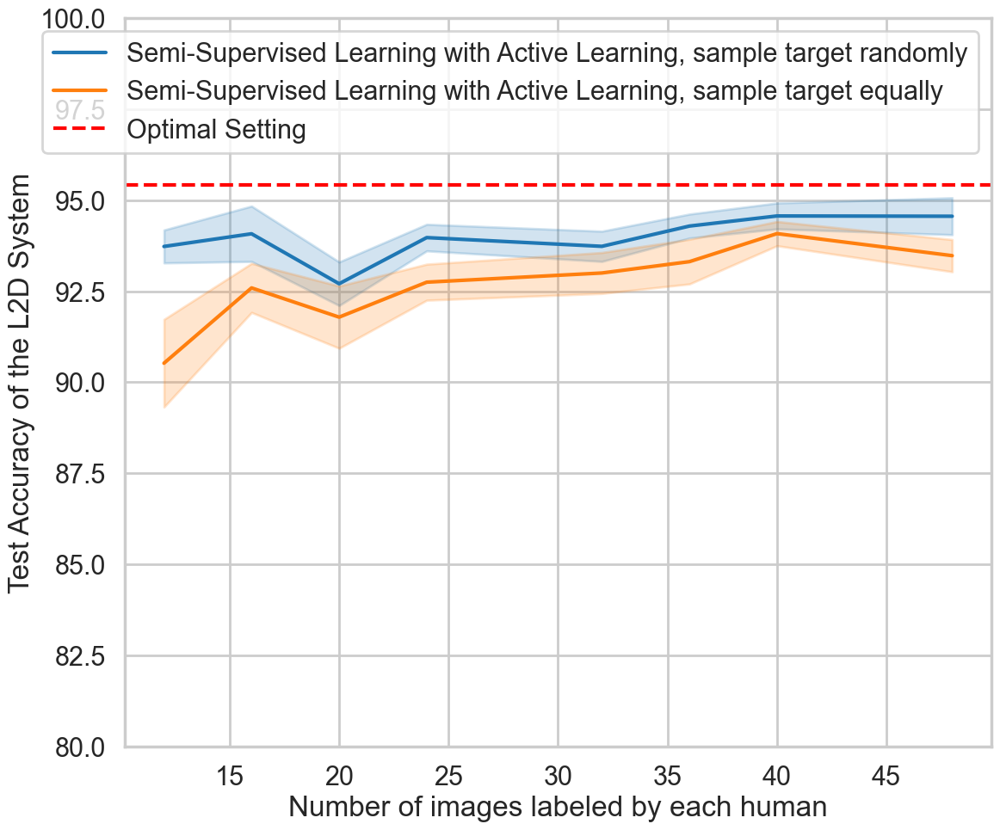

In [332]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "sample_equal"]].apply(tuple, axis=1), hue_order=[("SSL_AL", False), ("SSL_AL", True)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))

#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))

from scipy import stats

(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x)))


ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/parameters_sample_right.png", bbox_inches="tight")

In [333]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "sample_equal", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting", "sample_equal"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/approach_acc_sample_right.csv")
pivoted_df

setting sample_equal       mean                                   \
group                                0         12         16         20   
0      PERFECT      perfect  95.422374        NaN        NaN        NaN   
1       SSL_AL        False        NaN  93.727672  94.076239  92.704341   
2       SSL_AL         True        NaN  90.522485  92.590145  91.787538   

                                                   ...     median       std  \
group         24         32         36         40  ...         48         0   
0            NaN        NaN        NaN        NaN  ...        NaN  2.470611   
1      93.971288  93.731210  94.287690  94.565038  ...  95.417444       NaN   
2      92.746990  92.999496  93.311117  94.080354  ...  94.029851       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
1      1.806598  3.039809  3.384411  2.527617  2.348557  1.860000  2.013387   
2      4.811188  2.694936  4.832615  3.427530  3.179818  3.466787  2.105132   

                 
group        48  
0           NaN  
1      1.433535  
2      2.792769  

[3 rows x 28 columns]

# Other metrics

In [82]:
metricManager.get_l2d_dataframe("verma", "test").columns

Index(['coverage', 'system_accuracy', 'expert_accuracy', 'classifier_accuracy',
       'alone_classifier', 'validation_loss', 'n_experts', 'expert_0',
       'expert_1', 'expert_0_coverage', 'expert_1_coverage', 'cov_classifier',
       'coverage_frac', 'expert_2', 'expert_2_coverage'],
      dtype='object')

In [81]:
df_runs = metricManager.runs

,labeled
0,12
20,20
38,36
43,16
48,24
58,40
74,68
153,72
161,32
169,48


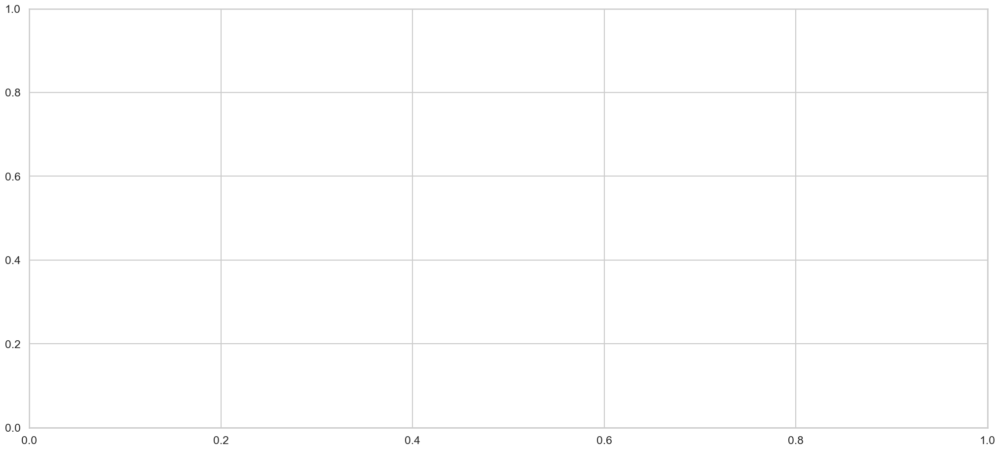

In [106]:
grouped_columns = []
cut_out = [("labeler_ids", "[4295349121, 4295342357, 4295354117]")]#, ("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff")]#, ("overlap", 0), ("sample_equal", False)]#("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff"), ("expert_predict", "target")]#, ("sample_equal", True), ("overlap", 100), 
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "expert_predict", "overlap", "sample_equal", "labeler_ids", "init_size", "labels_per_round", "rounds"]#, "expert_predict"]

method = "verma"
metric_name = "coverage_frac"
#metric_name = "coverage"
step = "test"

sns.set_style("whitegrid")
sns.set_context("talk")

df_test_overlap = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics_overlap, selected_runs_overlap = get_runs_grouped_metric(df_runs.iloc[:], df_test_overlap, grouped_columns, False, cut_out)

selected_runs_overlap["labeler_ids"] = selected_runs_overlap["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics_overlap.columns = [str(name) for name in df_grouped_metrics_overlap.columns]

df_overlap, runs_df_overlap, series_overlap = plot_runs_hue_metric(selected_runs_overlap, df_grouped_metrics_overlap, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=None, plot=False)
#group_test = group_ttest(df)

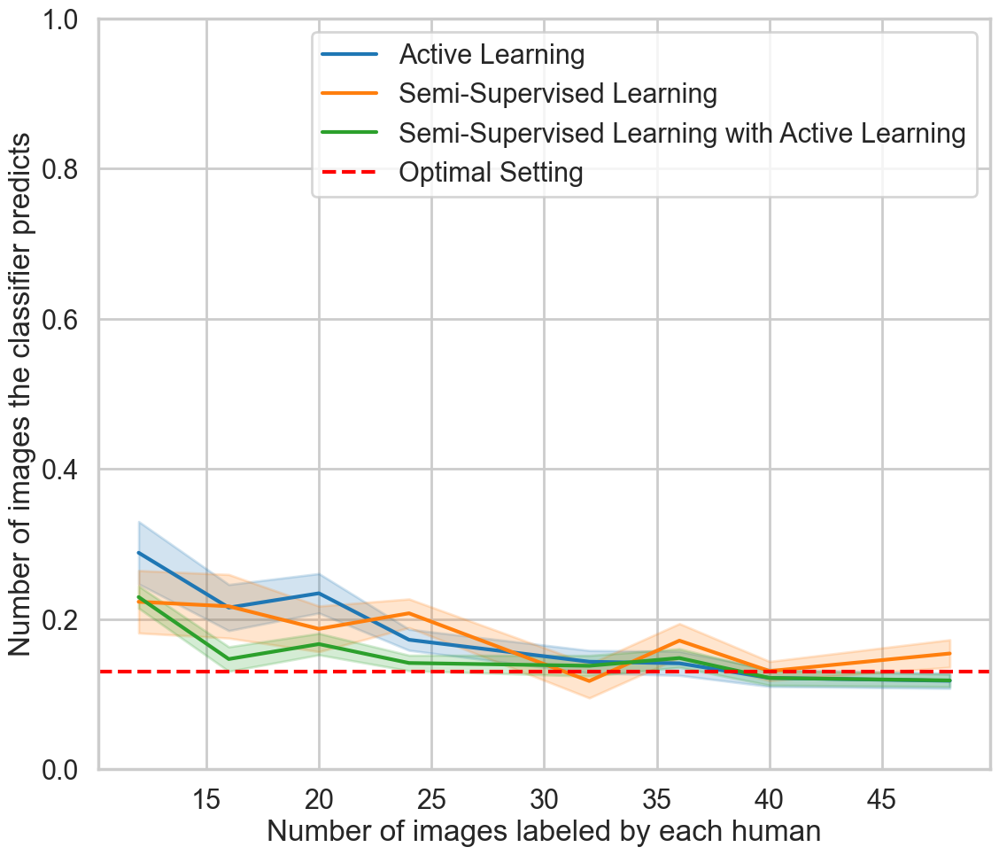

In [126]:
build_df = df_overlap.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_overlap.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(0, 1))

ax.set(xlabel='Number of images labeled by each human', ylabel="Number of images the classifier predicts")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/overall_clf_cov.png", bbox_inches="tight")

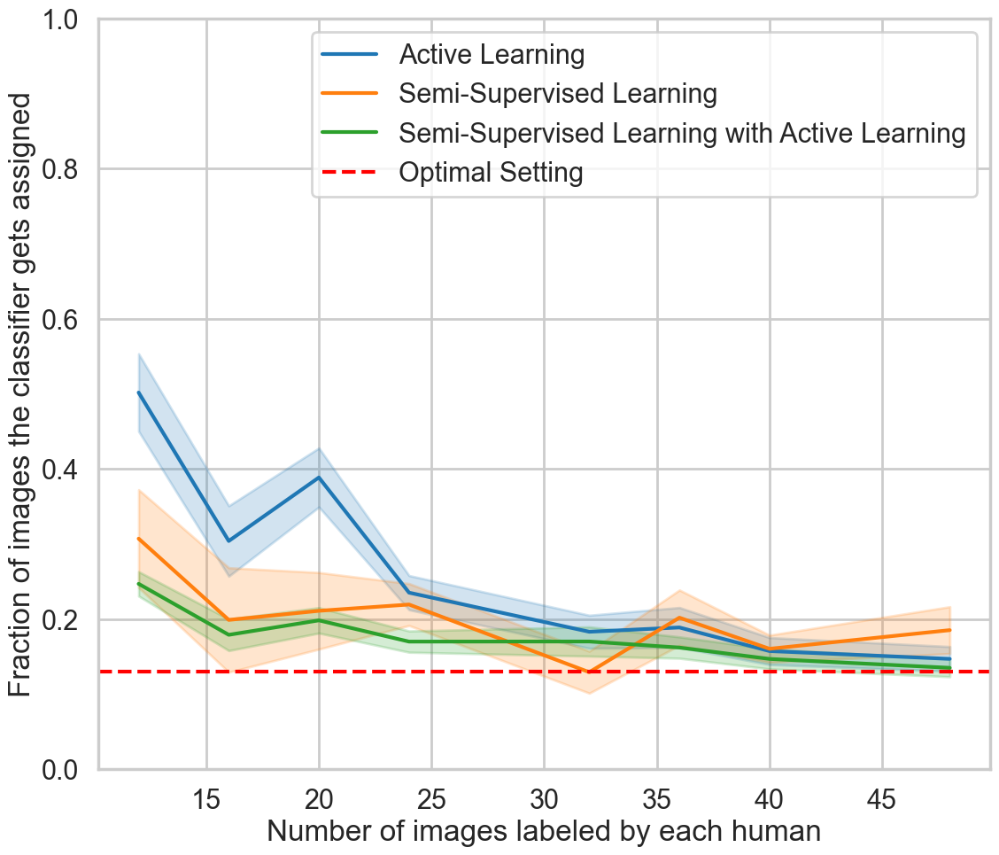

In [199]:
build_df = df_overlap.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_overlap.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(0, 1))

ax.set(xlabel='Number of images labeled by each human', ylabel="Fraction of images the classifier gets assigned")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/overall_clf_cov_target.png", bbox_inches="tight")

In [128]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/overall_clf_cov_target.csv")
pivoted_df

setting      mean                                                    \
group                  0        12        16        20        24        32   
0           AL       NaN  0.501634  0.303808  0.388427  0.234977  0.182856   
1      PERFECT  0.129839       NaN       NaN       NaN       NaN       NaN   
2          SSL       NaN  0.306939  0.198635  0.210773  0.219144  0.128978   
3       SSL_AL       NaN  0.246713  0.178789  0.198046  0.169741  0.169885   

                                     ...    median       std            \
group        36        40        48  ...        48         0        12   
0      0.188579  0.157139  0.146727  ...  0.089552       NaN  0.258327   
1           NaN       NaN       NaN  ...       NaN  0.172895       NaN   
2      0.201614  0.160165  0.185014  ...  0.081575       NaN  0.235253   
3      0.161797  0.146652  0.134787  ...  0.082353       NaN  0.192413   

                                                                             
group        16        20        24        32        36        40        48  
0      0.229764  0.275313  0.193316  0.152369  0.184145  0.152501  0.160669  
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN  
2      0.240932  0.255314  0.167603  0.136924  0.180708  0.108928  0.216266  
3      0.132978  0.152632  0.155102  0.156337  0.127374  0.140554  0.134215  

[4 rows x 27 columns]

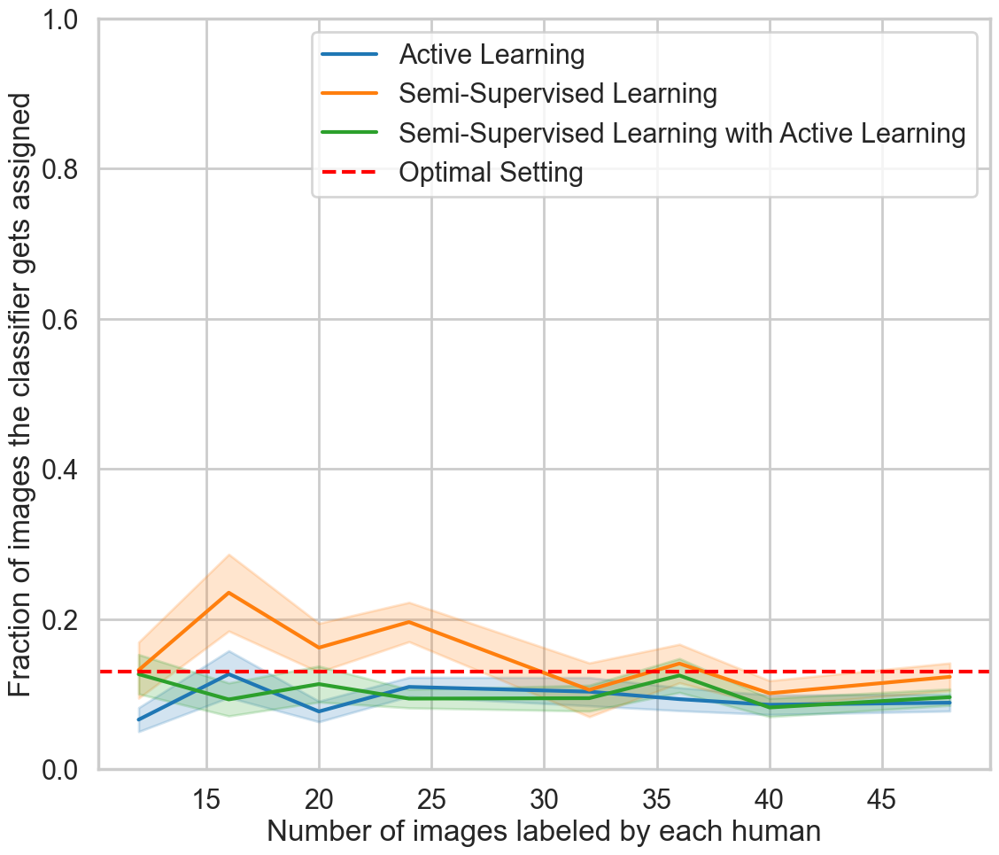

In [197]:
build_df = df_overlap.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_overlap.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(0, 1))

ax.set(xlabel='Number of images labeled by each human', ylabel="Fraction of images the classifier gets assigned")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/overall_clf_cov_right.png", bbox_inches="tight")

In [130]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/overall_clf_cov_target.csv")
pivoted_df

setting      mean                                                    \
group                  0        12        16        20        24        32   
0           AL       NaN  0.065750  0.126370  0.076632  0.109401  0.103049   
1      PERFECT  0.129839       NaN       NaN       NaN       NaN       NaN   
2          SSL       NaN  0.131703  0.234967  0.161660  0.195840  0.105464   
3       SSL_AL       NaN  0.126306  0.092682  0.113131  0.093773  0.094353   

                                     ...    median       std            \
group        36        40        48  ...        48         0        12   
0      0.093046  0.085606  0.088324  ...  0.044776       NaN  0.077942   
1           NaN       NaN       NaN  ...       NaN  0.172895       NaN   
2      0.140497  0.100886  0.122761  ...  0.045826       NaN  0.129261   
3      0.124607  0.081956  0.095702  ...  0.049649       NaN  0.128435   

                                                                             
group        16        20        24        32        36        40        48  
0      0.152639  0.095010  0.107969  0.130624  0.106381  0.110493  0.109014  
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN  
2      0.177173  0.159087  0.157235  0.175473  0.125887  0.100749  0.127745  
3      0.108000  0.165962  0.104879  0.119187  0.156306  0.104579  0.106793  

[4 rows x 27 columns]

,labeled
0,12
20,20
38,36
43,16
48,24
58,40
74,68
153,72
161,32
169,48


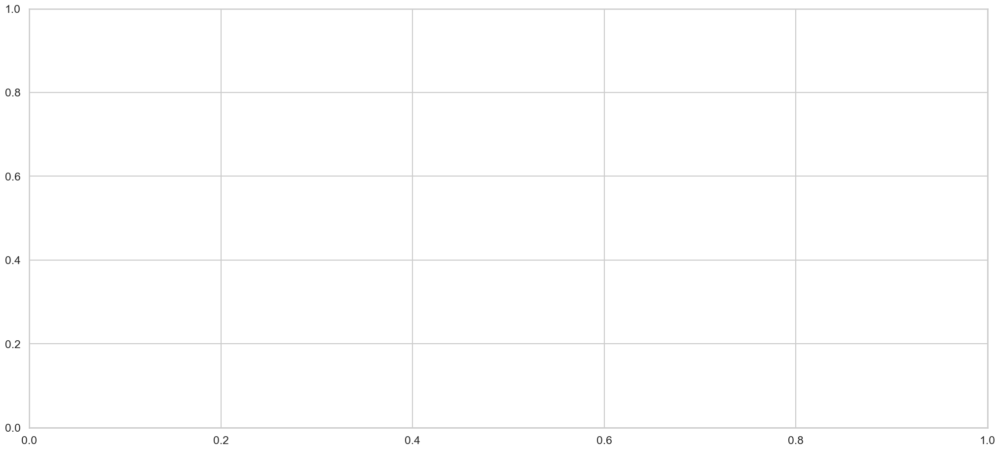

In [150]:
grouped_columns = []
cut_out = [("labeler_ids", "[4295349121, 4295342357, 4295354117]")]#, ("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff")]#, ("overlap", 0), ("sample_equal", False)]#("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff"), ("expert_predict", "target")]#, ("sample_equal", True), ("overlap", 100), 
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "expert_predict", "overlap", "sample_equal", "labeler_ids", "init_size", "labels_per_round", "rounds"]#, "expert_predict"]

method = "verma"
metric_name = "classifier_accuracy"
#metric_name = "coverage"
step = "test"

sns.set_style("whitegrid")
sns.set_context("talk")

df_test_classifier_accuracy = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics_classifier_accuracy, selected_runs_classifier_accuracy = get_runs_grouped_metric(df_runs.iloc[:], df_test_classifier_accuracy, grouped_columns, False, cut_out)

selected_runs_classifier_accuracy["labeler_ids"] = selected_runs_classifier_accuracy["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics_classifier_accuracy.columns = [str(name) for name in df_grouped_metrics_classifier_accuracy.columns]

df_classifier_accuracy, runs_df_classifier_accuracy, series_classifier_accuracy = plot_runs_hue_metric(selected_runs_classifier_accuracy, df_grouped_metrics_classifier_accuracy, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=None, plot=False)
#group_test = group_ttest(df)

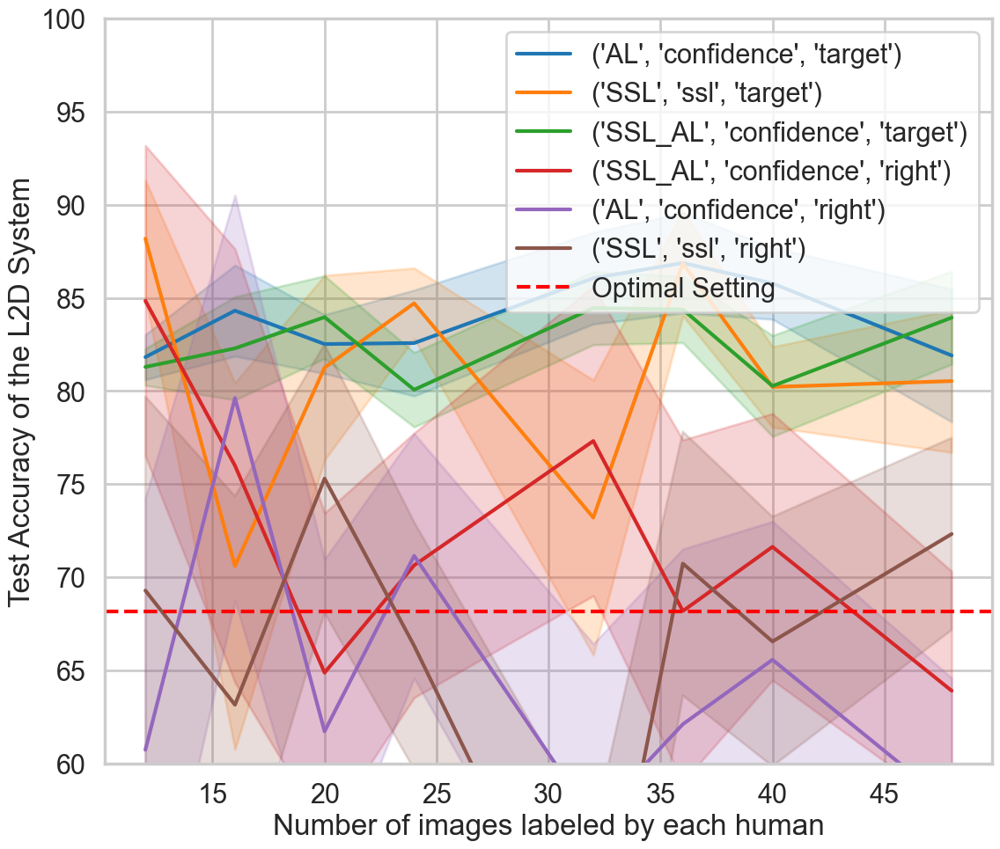

In [163]:
build_df = df_classifier_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=
(lambda x: (estimator(x)-stats.sem(x), estimator(x)+stats.sem(x))))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(60, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/overall_clf_acc.png", bbox_inches="tight")

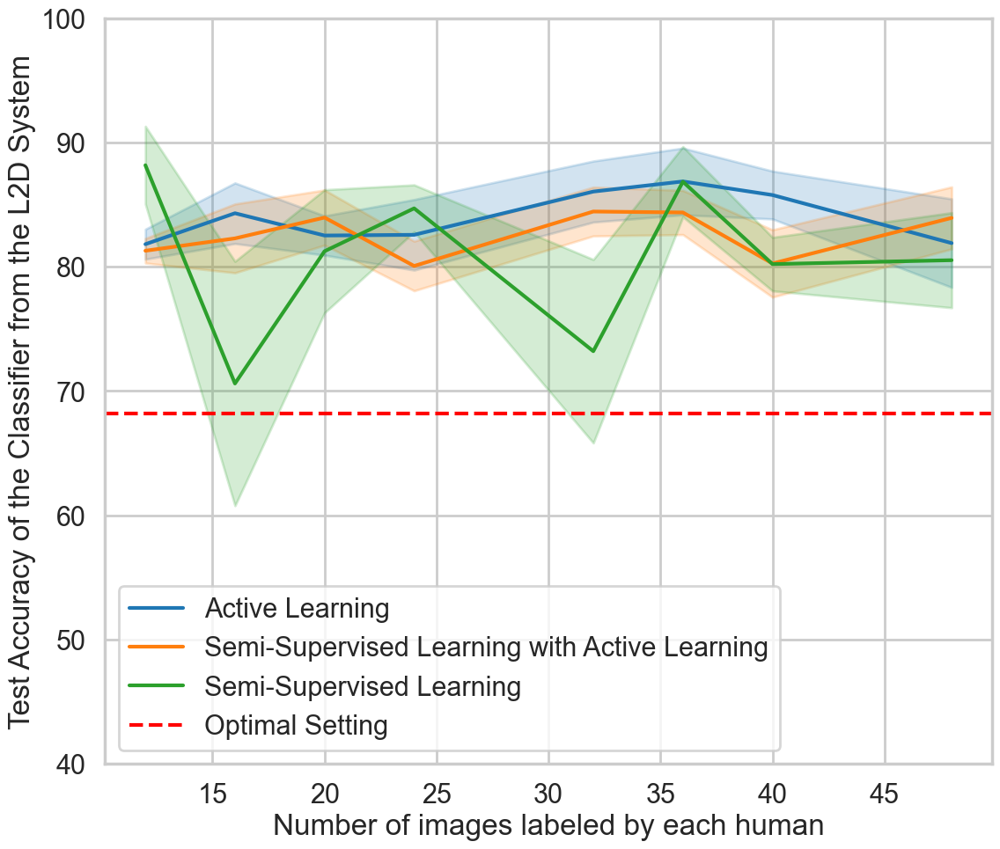

In [210]:
build_df = df_classifier_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=
#(lambda x: (estimator(x)-stats.sem(x), estimator(x)+stats.sem(x))))
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL_AL",), ("SSL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(40, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the Classifier from the L2D System")
plt.legend()
leg_texts = ["Active Learning", "Semi-Supervised Learning with Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/overall_clf_acc_target.png", bbox_inches="tight")

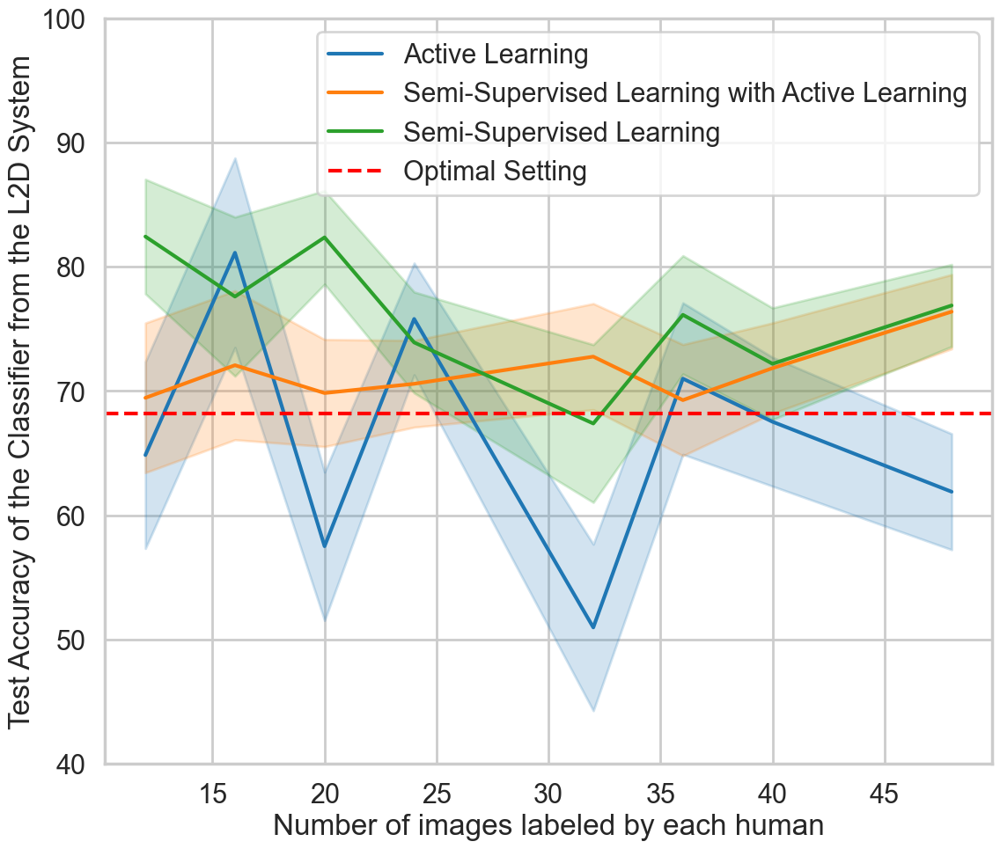

In [207]:
build_df = df_classifier_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=
#(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=np.mean, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(40, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the Classifier from the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning with Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/overall_clf_acc_right.png", bbox_inches="tight")

In [180]:
dfff["value"].median()

88.76208207943965

,labeled
0,12
20,20
38,36
43,16
48,24
58,40
74,68
153,72
161,32
169,48


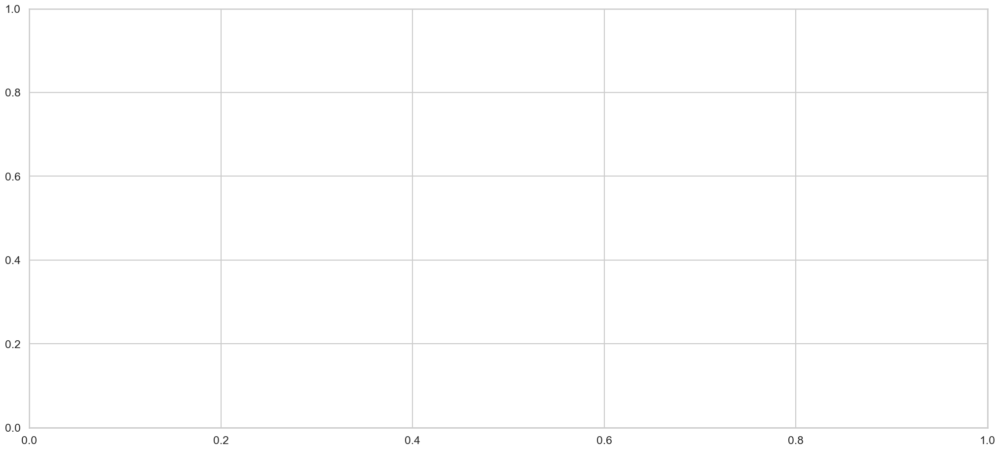

In [155]:
grouped_columns = []
cut_out = [("labeler_ids", "[4295349121, 4295342357, 4295354117]")]#, ("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff")]#, ("overlap", 0), ("sample_equal", False)]#("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff"), ("expert_predict", "target")]#, ("sample_equal", True), ("overlap", 100), 
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "expert_predict", "overlap", "sample_equal", "labeler_ids", "init_size", "labels_per_round", "rounds"]#, "expert_predict"]

method = "verma"
metric_name = "expert_accuracy"
#metric_name = "coverage"
step = "test"

sns.set_style("whitegrid")
sns.set_context("talk")

df_test_expert_accuracy = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics_expert_accuracy, selected_runs_expert_accuracy = get_runs_grouped_metric(df_runs.iloc[:], df_test_expert_accuracy, grouped_columns, False, cut_out)

selected_runs_expert_accuracy["labeler_ids"] = selected_runs_expert_accuracy["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics_expert_accuracy.columns = [str(name) for name in df_grouped_metrics_expert_accuracy.columns]

df_expert_accuracy, runs_df_expert_accuracy, series_expert_accuracy = plot_runs_hue_metric(selected_runs_expert_accuracy, df_grouped_metrics_expert_accuracy, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=None, plot=False)
#group_test = group_ttest(df)

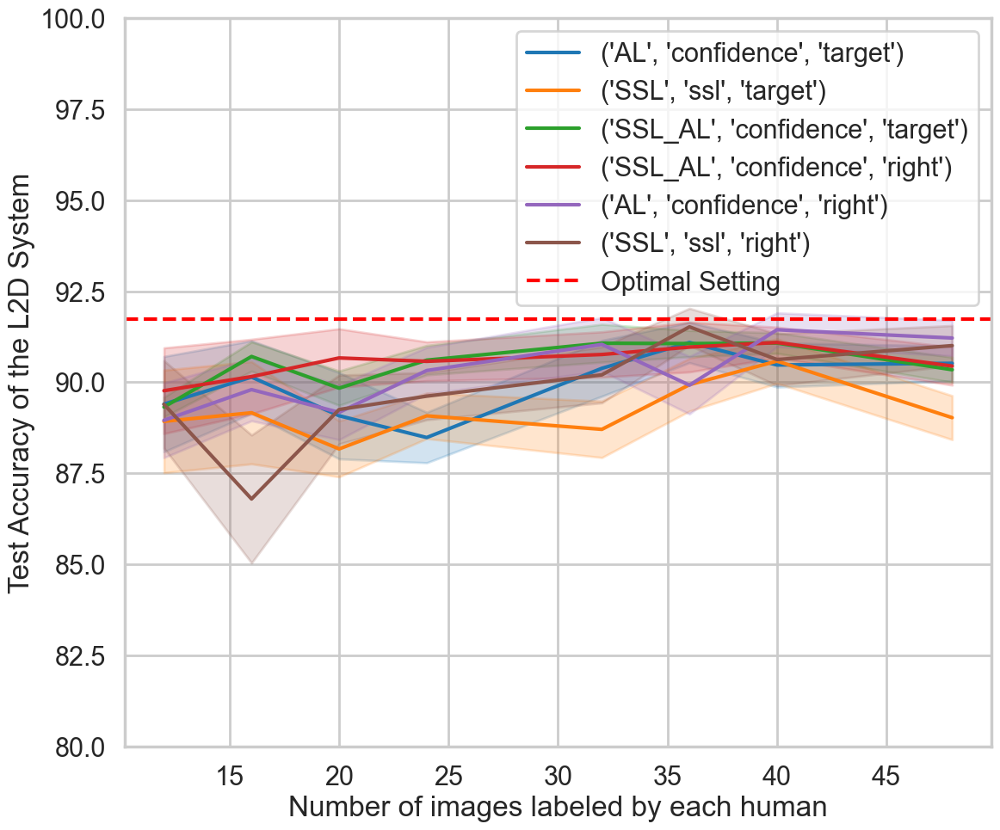

In [184]:
build_df = df_expert_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
#plt.savefig("../../images/NIH/4996/parameters_target.png", bbox_inches="tight")

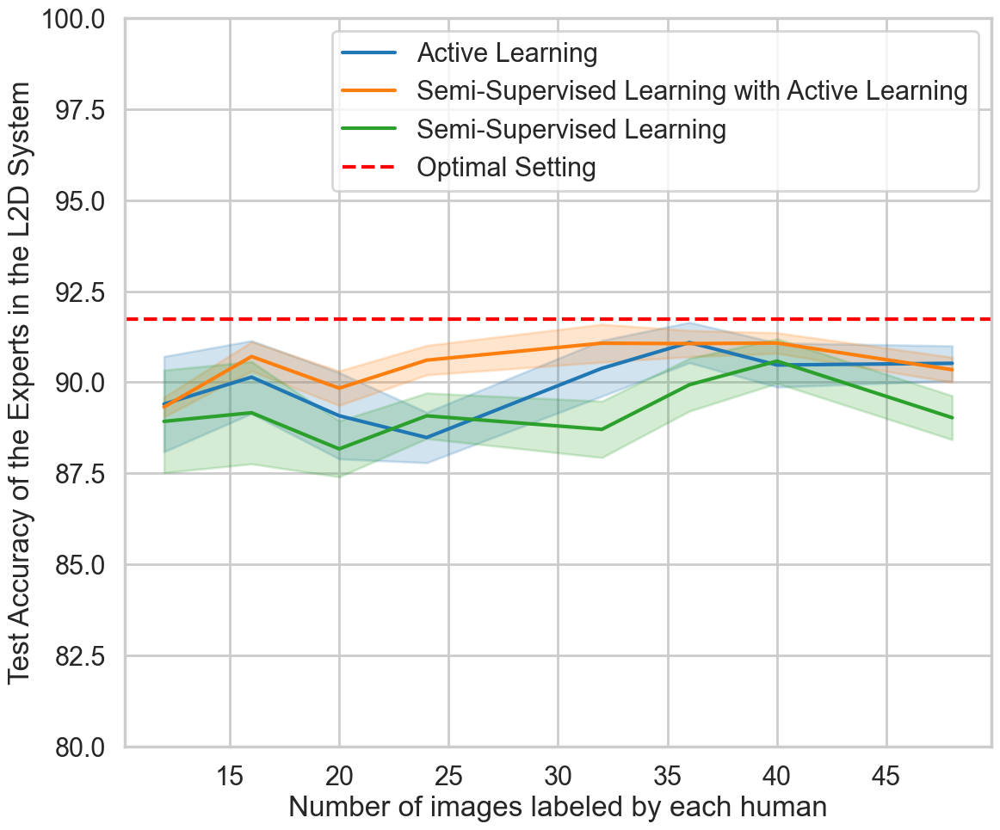

In [218]:
build_df = df_expert_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting",]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL_AL",), ("SSL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the Experts in the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning with Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/overall_expert_acc_target.png", bbox_inches="tight")

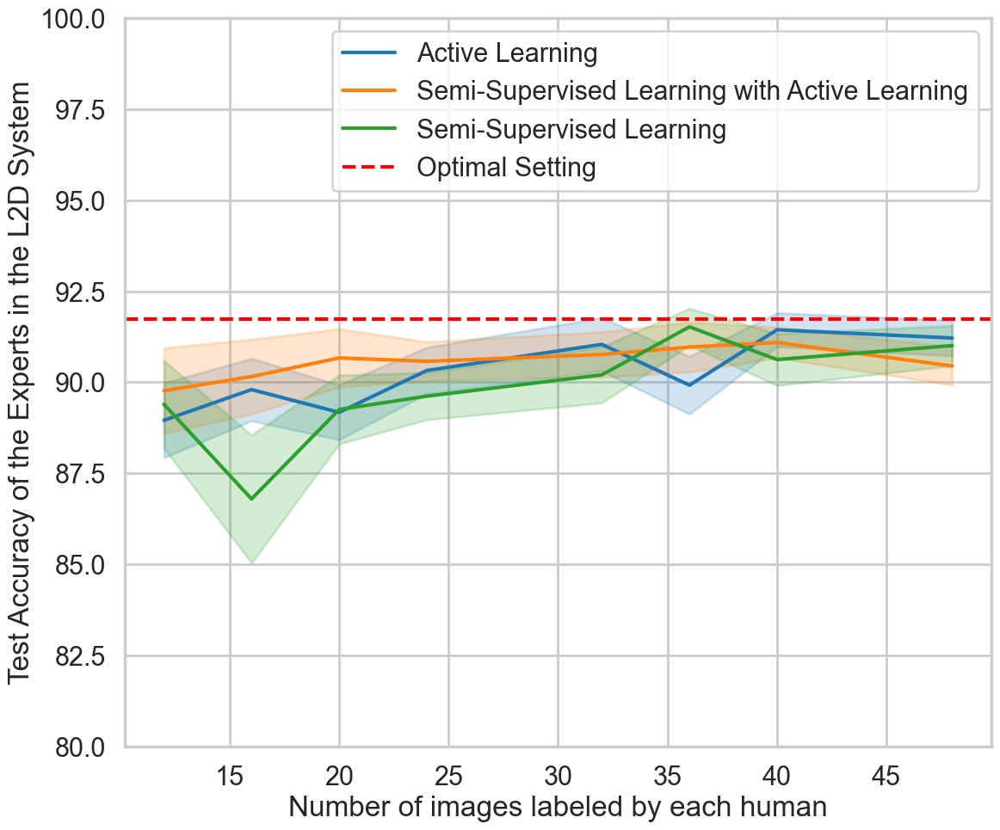

In [217]:
build_df = df_expert_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL_AL",), ("SSL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the Experts in the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning with Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/overall_expert_acc_rigth.png", bbox_inches="tight")

# Other Metrics - Single Teams

### Fraction

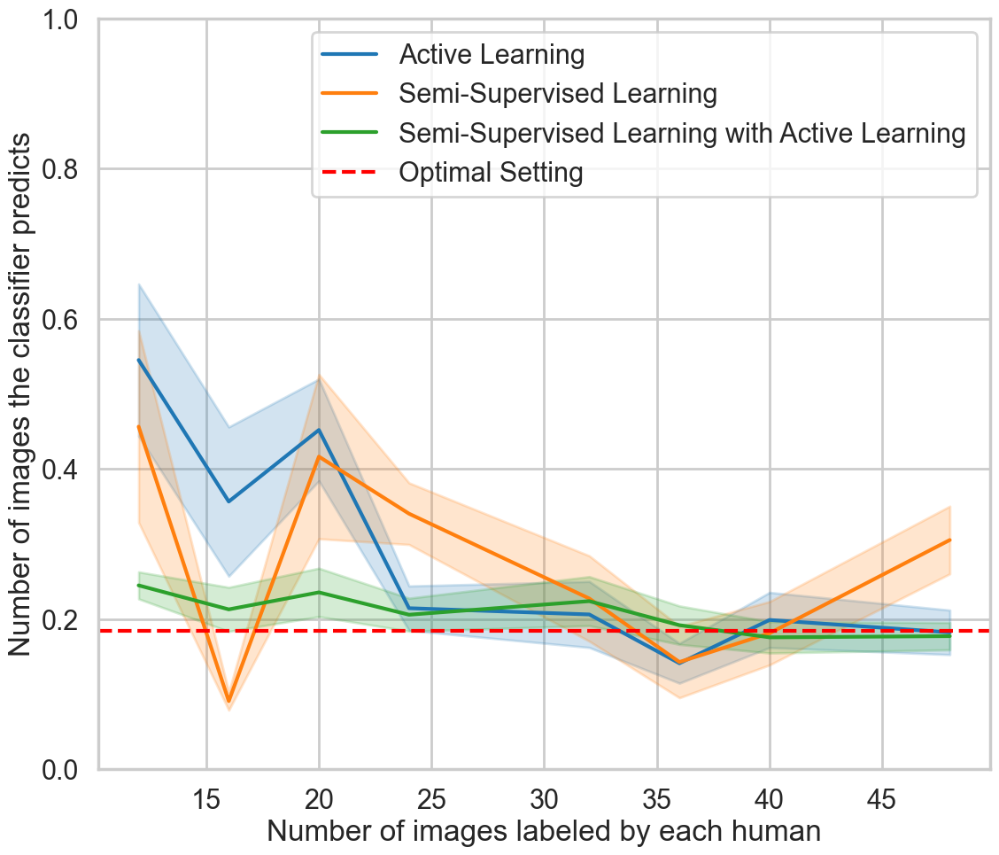

In [149]:
build_df = df_overlap.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_overlap.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(0, 1))

ax.set(xlabel='Number of images labeled by each human', ylabel="Number of images the classifier predicts")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/overall_clf_cov_target.png", bbox_inches="tight")

In [132]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/overall_clf_cov_target.csv")
pivoted_df

setting      mean                                                    \
group                  0        12        16        20        24        32   
0           AL       NaN  0.544955  0.356351  0.451751  0.214263  0.205932   
1      PERFECT  0.184294       NaN       NaN       NaN       NaN       NaN   
2          SSL       NaN  0.456201  0.090484  0.416257  0.340203  0.227172   
3       SSL_AL       NaN  0.244661  0.212682  0.235352  0.205576  0.223642   

                                     ...    median       std            \
group        36        40        48  ...        48         0        12   
0      0.140884  0.198580  0.182054  ...  0.117265       NaN  0.303874   
1           NaN       NaN       NaN  ...       NaN  0.193419       NaN   
2      0.142535  0.180890  0.305124  ...  0.266317       NaN  0.285577   
3      0.191620  0.175442  0.177009  ...  0.131779       NaN  0.193672   

                                                                             
group        16        20        24        32        36        40        48  
0      0.281239  0.279749  0.144924  0.176097  0.106230  0.179921  0.167672  
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN  
2      0.024110  0.328450  0.142310  0.160963  0.134700  0.146291  0.180223  
3      0.117528  0.185057  0.152362  0.184852  0.145095  0.144767  0.145773  

[4 rows x 27 columns]

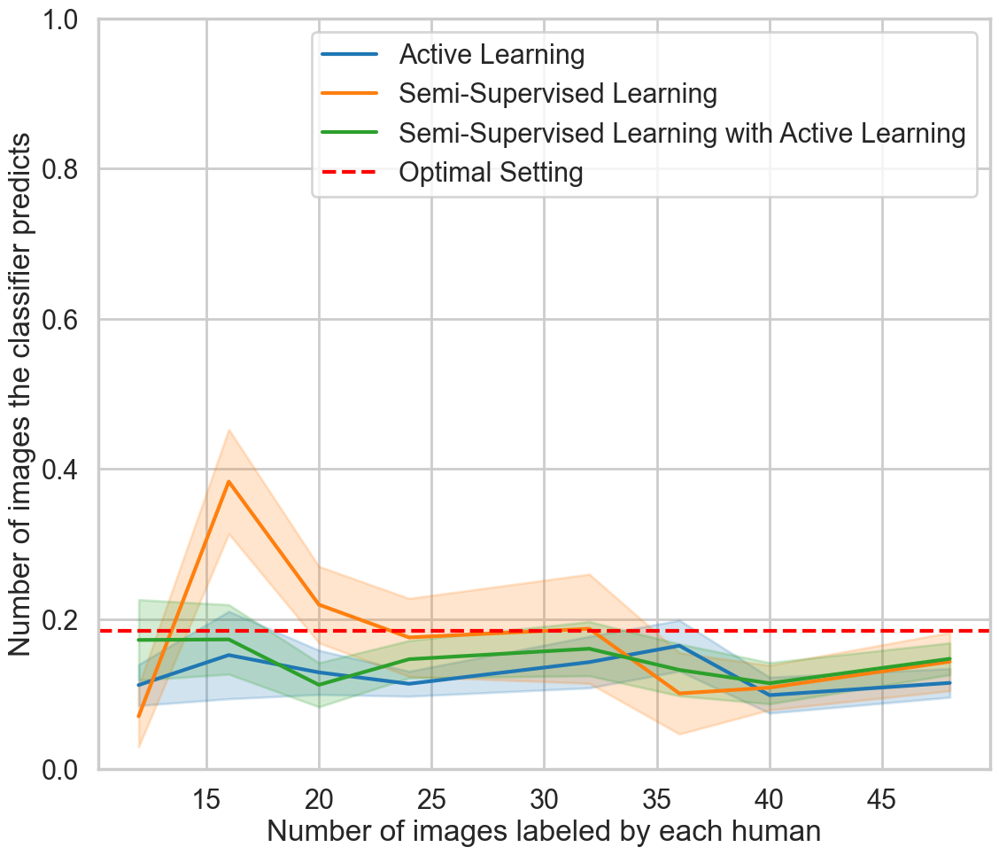

In [148]:
build_df = df_overlap.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_overlap.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(0, 1))

ax.set(xlabel='Number of images labeled by each human', ylabel="Number of images the classifier predicts")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/overall_clf_cov_right.png", bbox_inches="tight")

In [134]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/overall_clf_cov_target.csv")
pivoted_df

setting      mean                                                    \
group                  0        12        16        20        24        32   
0           AL       NaN  0.111862  0.151803  0.128728  0.113542  0.142397   
1      PERFECT  0.184294       NaN       NaN       NaN       NaN       NaN   
2          SSL       NaN  0.070197  0.382960  0.219015  0.175281  0.186861   
3       SSL_AL       NaN  0.171951  0.172640  0.112133  0.146265  0.160275   

                                     ...   median       std            \
group        36        40        48  ...       48         0        12   
0      0.164293  0.098391  0.114726  ...  0.10000       NaN  0.077328   
1           NaN       NaN       NaN  ...      NaN  0.193419       NaN   
2      0.100677  0.108420  0.142988  ...  0.09632       NaN  0.081082   
3      0.132000  0.114279  0.146840  ...  0.14881       NaN  0.151868   

                                                                             
group        16        20        24        32        36        40        48  
0      0.164817  0.117755  0.081444  0.137315  0.135587  0.117249  0.108218  
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN  
2      0.139039  0.144007  0.180125  0.205771  0.153016  0.102794  0.155389  
3      0.131012  0.117653  0.122154  0.144408  0.138477  0.134544  0.120196  

[4 rows x 27 columns]

In [135]:
# Team 2

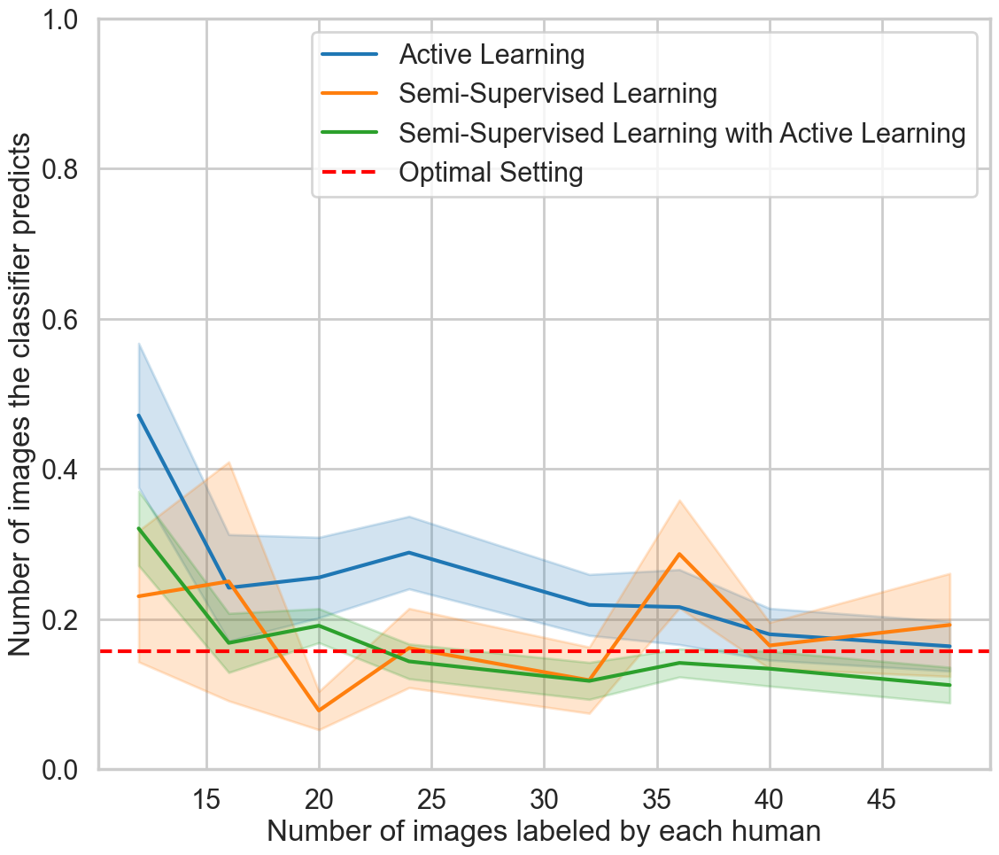

In [147]:
build_df = df_overlap.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_overlap.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(0, 1))

ax.set(xlabel='Number of images labeled by each human', ylabel="Number of images the classifier predicts")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/overall_clf_cov_target.png", bbox_inches="tight")

In [137]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/overall_clf_cov_target.csv")
pivoted_df

setting      mean                                                    \
group                  0        12        16        20        24        32   
0           AL       NaN  0.471220  0.241496  0.255125  0.288361  0.218624   
1      PERFECT  0.157287       NaN       NaN       NaN       NaN       NaN   
2          SSL       NaN  0.230162  0.250000  0.077886  0.161201  0.118341   
3       SSL_AL       NaN  0.320548  0.168011  0.190971  0.143404  0.117395   

                                     ...    median       std            \
group        36        40        48  ...        48         0        12   
0      0.215757  0.179533  0.163529  ...  0.076000       NaN  0.271534   
1           NaN       NaN       NaN  ...       NaN  0.194427       NaN   
2      0.286492  0.164583  0.191956  ...  0.053851       NaN  0.174821   
3      0.141365  0.133640  0.111781  ...  0.065582       NaN  0.197651   

                                                                             
group        16        20        24        32        36        40        48  
0      0.200587  0.214364  0.236723  0.162443  0.199852  0.168975  0.187062  
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN  
2      0.318425  0.072324  0.182718  0.124809  0.203286  0.106568  0.274670  
3      0.157601  0.128327  0.160711  0.098497  0.106009  0.146980  0.134346  

[4 rows x 27 columns]

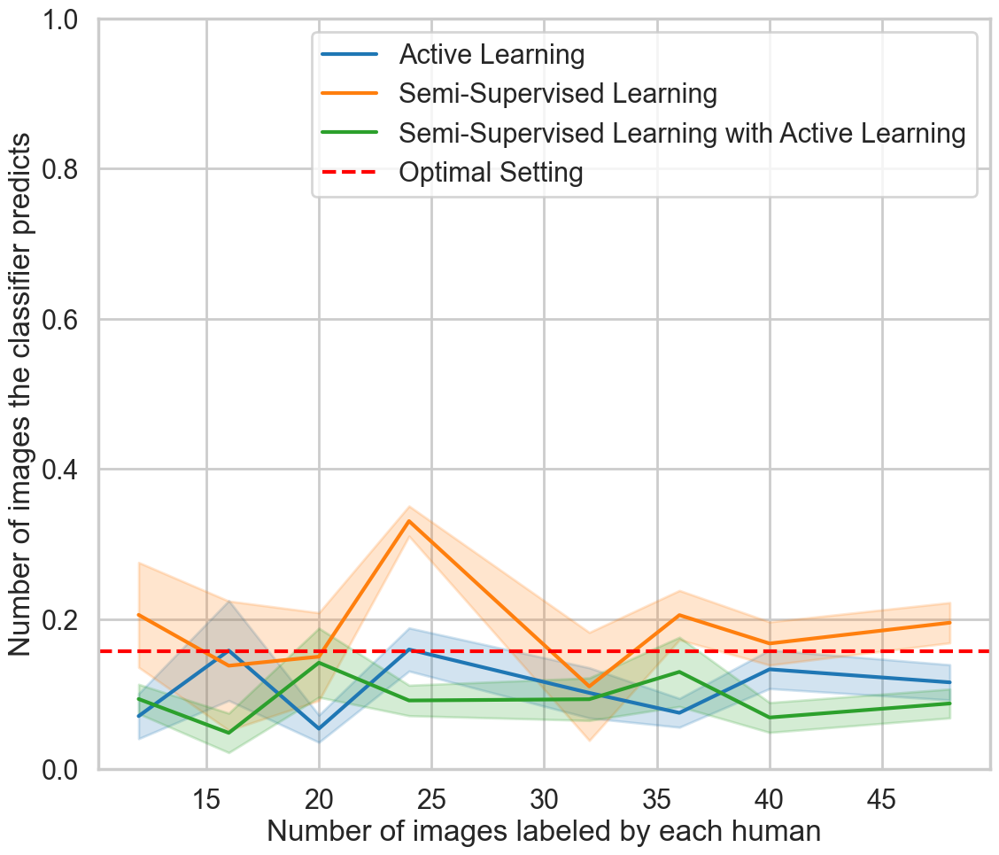

In [146]:
build_df = df_overlap.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_overlap.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(0, 1))

ax.set(xlabel='Number of images labeled by each human', ylabel="Number of images the classifier predicts")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/overall_clf_cov_right.png", bbox_inches="tight")

In [139]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/overall_clf_cov_target.csv")
pivoted_df

setting      mean                                                    \
group                  0        12        16        20        24        32   
0           AL       NaN  0.070463  0.157806  0.053739  0.159227  0.101443   
1      PERFECT  0.157287       NaN       NaN       NaN       NaN       NaN   
2          SSL       NaN  0.205375  0.137638  0.149701  0.330365  0.110000   
3       SSL_AL       NaN  0.093250  0.048099  0.141649  0.091289  0.092975   

                                     ...    median       std            \
group        36        40        48  ...        48         0        12   
0      0.074820  0.132819  0.115454  ...  0.056554       NaN  0.085068   
1           NaN       NaN       NaN  ...       NaN  0.194427       NaN   
2      0.205051  0.167245  0.194920  ...  0.230362       NaN  0.139715   
3      0.129413  0.068613  0.087293  ...  0.038657       NaN  0.055394   

                                                                             
group        16        20        24        32        36        40        48  
0      0.188129  0.072595  0.140865  0.133789  0.076787  0.125854  0.132765  
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN  
2      0.172219  0.165491  0.069530  0.203680  0.092915  0.099581  0.107320  
3      0.074247  0.183928  0.099537  0.113365  0.184520  0.097461  0.108944  

[4 rows x 27 columns]

In [140]:
# Team 3

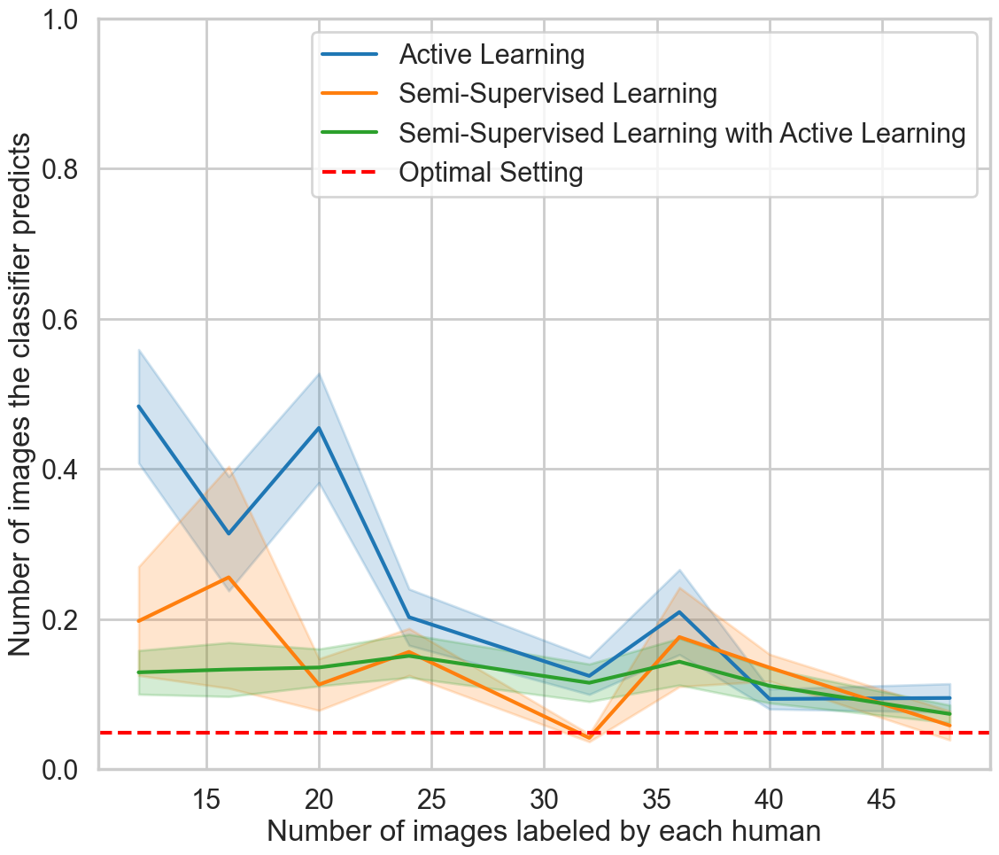

In [145]:
build_df = df_overlap.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_overlap.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(0, 1))

ax.set(xlabel='Number of images labeled by each human', ylabel="Number of images the classifier predicts")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/overall_clf_cov_target.png", bbox_inches="tight")

In [142]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/overall_clf_cov_target.csv")
pivoted_df

setting      mean                                                    \
group                  0        12        16        20        24        32   
0           AL       NaN  0.483311  0.313576  0.454447  0.202308  0.124012   
1      PERFECT  0.047937       NaN       NaN       NaN       NaN       NaN   
2          SSL       NaN  0.197138  0.255422  0.112490  0.156026  0.041420   
3       SSL_AL       NaN  0.128787  0.132559  0.135253  0.150748  0.114862   

                                     ...    median       std            \
group        36        40        48  ...        48         0        12   
0      0.209097  0.093304  0.094599  ...  0.066083       NaN  0.213735   
1           NaN       NaN       NaN  ...       NaN  0.072831       NaN   
2      0.175815  0.135021  0.057961  ...  0.014925       NaN  0.144945   
3      0.143018  0.110760  0.073348  ...  0.053288       NaN  0.082513   

                                                                             
group        16        20        24        32        36        40        48  
0      0.215467  0.291503  0.183811  0.098591  0.226628  0.065580  0.107791  
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN  
2      0.295727  0.097275  0.108374  0.014306  0.186665  0.061774  0.077242  
3      0.101799  0.098898  0.140518  0.099997  0.124699  0.111877  0.066642  

[4 rows x 27 columns]

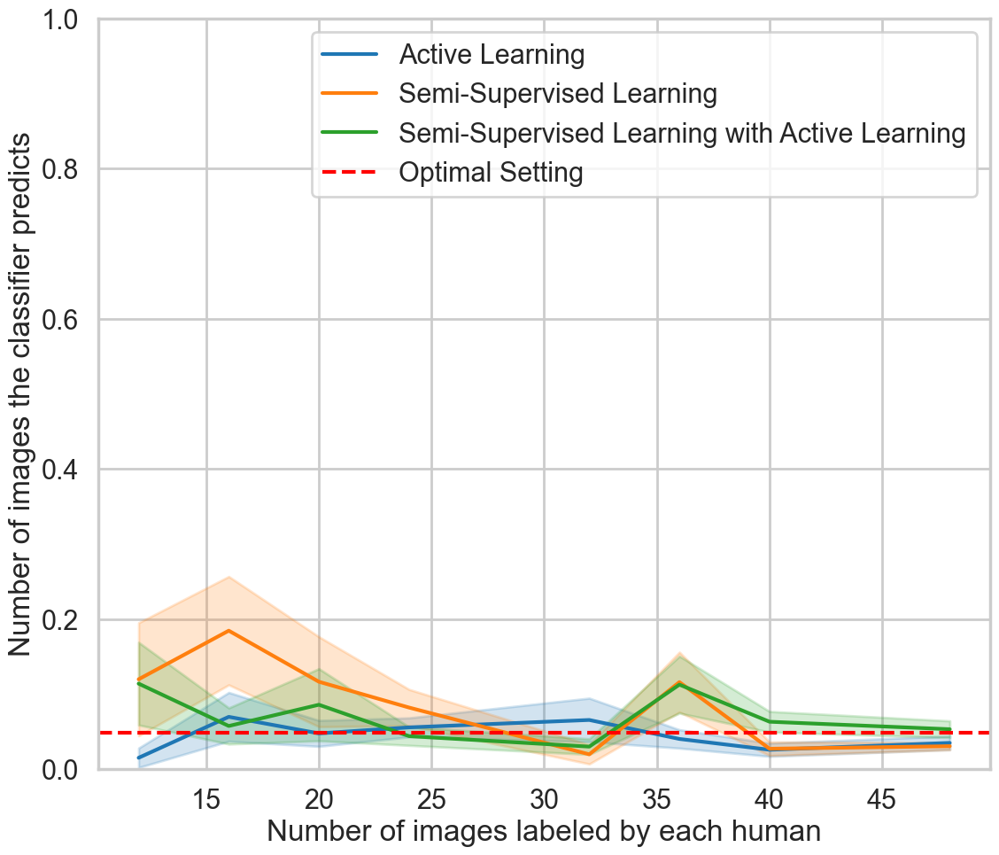

In [143]:
build_df = df_overlap.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_overlap.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(0, 1))

ax.set(xlabel='Number of images labeled by each human', ylabel="Number of images the classifier predicts")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/overall_clf_cov_right.png", bbox_inches="tight")

In [144]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/overall_clf_cov_target.csv")
pivoted_df

setting      mean                                                    \
group                  0        12        16        20        24        32   
0           AL       NaN  0.014925  0.069500  0.047429  0.055433  0.065307   
1      PERFECT  0.047937       NaN       NaN       NaN       NaN       NaN   
2          SSL       NaN  0.119536  0.184302  0.116263  0.081873  0.019531   
3       SSL_AL       NaN  0.113717  0.057308  0.085611  0.043766  0.029809   

                                     ...    median       std            \
group        36        40        48  ...        48         0        12   
0      0.040027  0.025609  0.034792  ...  0.014925       NaN  0.036560   
1           NaN       NaN       NaN  ...       NaN  0.072831       NaN   
2      0.115764  0.026994  0.030375  ...  0.037313       NaN  0.150636   
3      0.112409  0.062975  0.052972  ...  0.030550       NaN  0.155745   

                                                                             
group        16        20        24        32        36        40        48  
0      0.091821  0.069170  0.062142  0.116336  0.049113  0.042992  0.051416  
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN  
2      0.144399  0.169569  0.083735  0.036165  0.112915  0.031483  0.019339  
3      0.068114  0.192236  0.060287  0.041522  0.151943  0.067145  0.063065  

[4 rows x 27 columns]

### CLF Accuracy

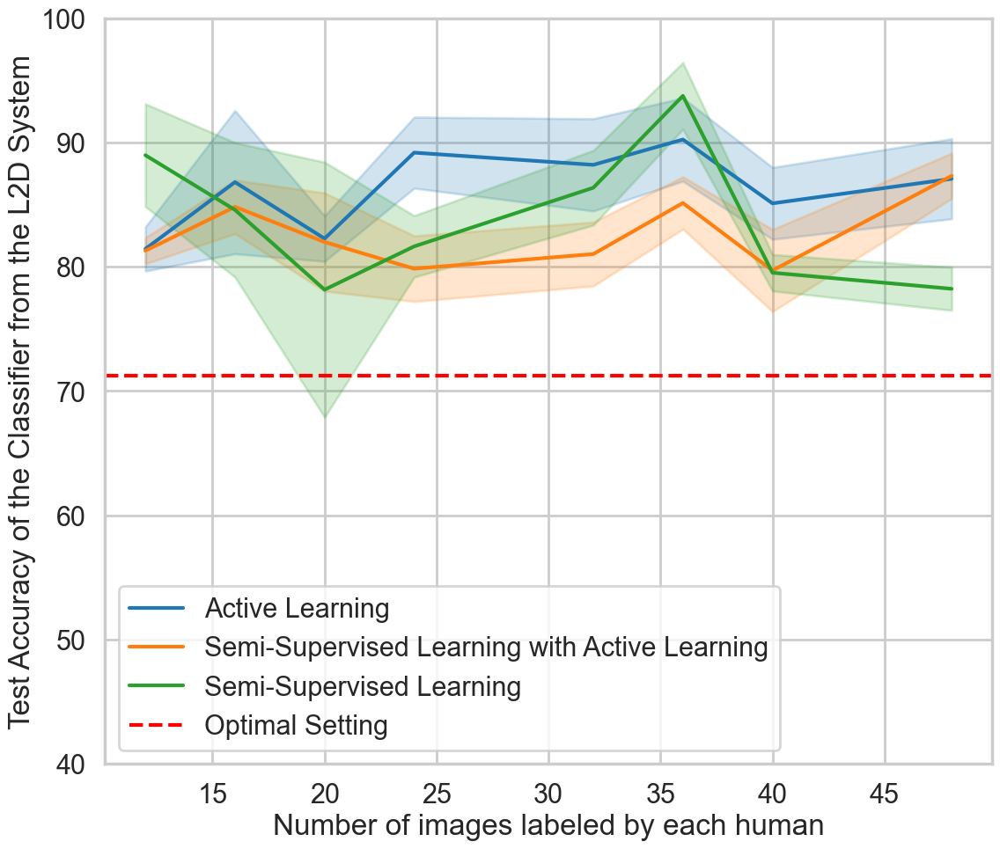

In [219]:
build_df = df_classifier_accuracy.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=
#(lambda x: (estimator(x)-stats.sem(x), estimator(x)+stats.sem(x))))
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL_AL",), ("SSL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(40, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the Classifier from the L2D System")
plt.legend()
leg_texts = ["Active Learning", "Semi-Supervised Learning with Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/overall_clf_acc_target.png", bbox_inches="tight")

In [220]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/overall_clf_acc_target.csv")
pivoted_df

setting      mean                                              \
group                  0         12         16         20         24   
0           AL       NaN  81.436690  86.817459  82.270961  89.192060   
1      PERFECT  71.26593        NaN        NaN        NaN        NaN   
2          SSL       NaN  88.985392  84.582135  78.157802  81.642158   
3       SSL_AL       NaN  81.293273  84.826482  81.995499  79.849588   

                                                   ...     median        std  \
group         32         36         40         48  ...         48          0   
0      88.209484  90.246972  85.108342  87.085657  ...  87.417333        NaN   
1            NaN        NaN        NaN        NaN  ...        NaN  37.762481   
2      86.365683  93.764454  79.522976  78.228597  ...  78.888368        NaN   
3      81.026428  85.139369  79.702008  87.322352  ...  89.443501        NaN   

                                                                         \
group         12         16         20         24         32         36   
0       3.989061  11.534780   5.499867   9.919132  10.506408   9.481922   
1            NaN        NaN        NaN        NaN        NaN        NaN   
2       9.245071  10.832985  30.801288   8.576555   8.499433   7.576834   
3      11.099223   7.472798  19.759646  15.852975  12.609205  10.301052   

                             
group         40         48  
0      10.017569  12.890344  
1            NaN        NaN  
2       5.084335   6.936960  
3      19.820305  12.638999  

[4 rows x 27 columns]

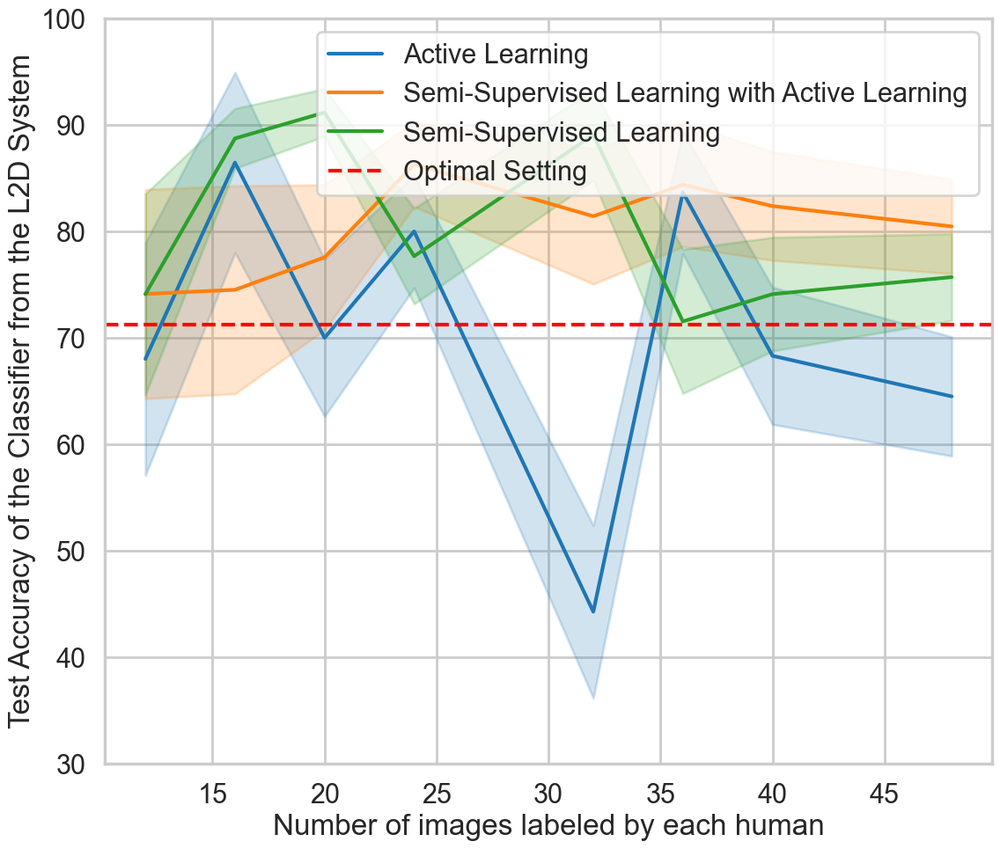

In [235]:
build_df = df_classifier_accuracy.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=
#(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=np.mean, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(30, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the Classifier from the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning with Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/overall_clf_acc_right.png", bbox_inches="tight")

In [223]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/overall_clf_acc_right.csv")
pivoted_df

setting      mean                                              \
group                  0         12         16         20         24   
0           AL       NaN  68.012336  86.454801  69.993564  79.989012   
1      PERFECT  71.26593        NaN        NaN        NaN        NaN   
2          SSL       NaN  74.095531  88.725873  91.161672  77.660540   
3       SSL_AL       NaN  74.114287  74.508591  77.554178  86.286174   

                                                   ...     median        std  \
group         32         36         40         48  ...         48          0   
0      44.267690  83.667074  68.305076  64.493608  ...  91.399954        NaN   
1            NaN        NaN        NaN        NaN  ...        NaN  37.762481   
2      89.059118  71.537450  74.100515  75.696306  ...  89.204134        NaN   
3      81.414466  84.378784  82.368624  80.458845  ...  99.990001        NaN   

                                                                         \
group         12         16         20         24         32         36   
0      43.740406  33.865770  41.730104  36.703569  45.890923  32.629342   
1            NaN        NaN        NaN        NaN        NaN        NaN   
2      37.685170  11.238409  12.650763  31.043862  24.151125  38.297498   
3      39.300391  39.062854  38.547662  27.505831  36.056046  32.872987   

                             
group         40         48  
0      44.609923  44.807812  
1            NaN        NaN  
2      36.960064  32.577746  
3      35.297622  35.516110  

[4 rows x 27 columns]

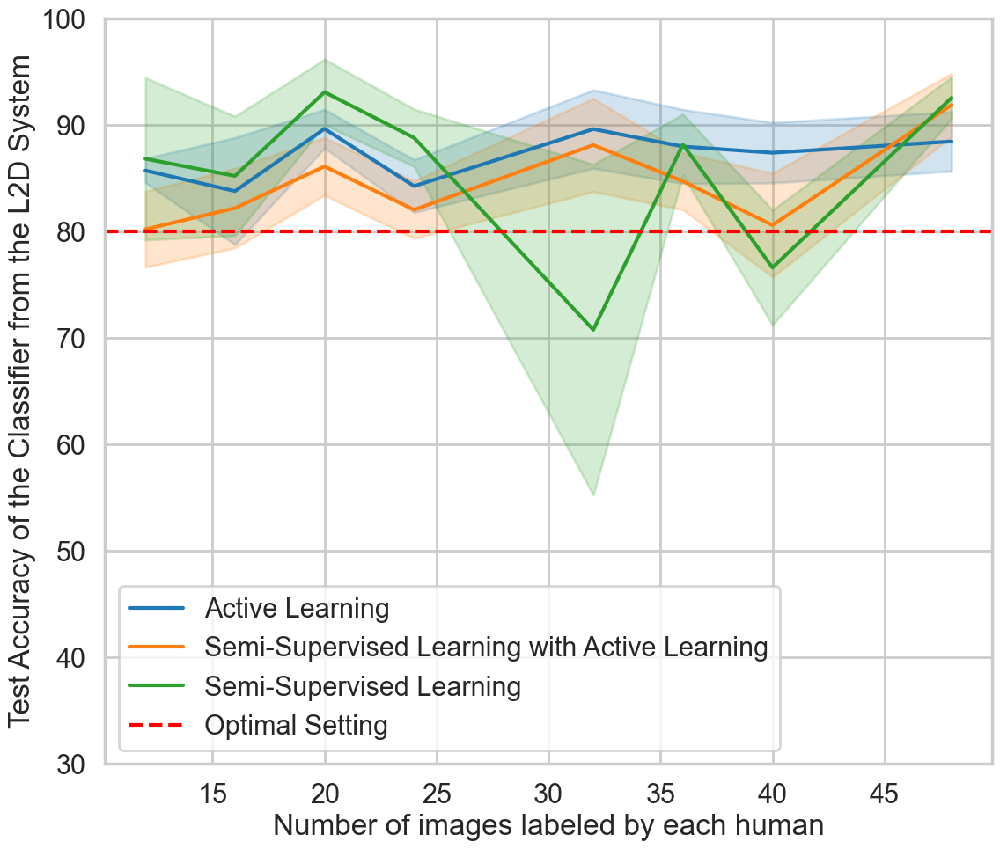

In [237]:
build_df = df_classifier_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=
#(lambda x: (estimator(x)-stats.sem(x), estimator(x)+stats.sem(x))))
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL_AL",), ("SSL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(30, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the Classifier from the L2D System")
plt.legend()
leg_texts = ["Active Learning", "Semi-Supervised Learning with Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/overall_clf_acc_target.png", bbox_inches="tight")

In [225]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/overall_clf_acc_target.csv")
pivoted_df

setting       mean                                              \
group                   0         12         16         20         24   
0           AL        NaN  80.091591  84.579825  79.174241  81.737333   
1      PERFECT  62.236134        NaN        NaN        NaN        NaN   
2          SSL        NaN  88.787424  63.303549  75.690744  82.670554   
3       SSL_AL        NaN  81.406663  82.369464  82.414552  78.600341   

                                                   ...     median        std  \
group         32         36         40         48  ...         48          0   
0      84.283815  86.326093  84.978298  78.638792  ...  86.581371        NaN   
1            NaN        NaN        NaN        NaN  ...        NaN  44.357312   
2      74.431800  86.204532  82.028518  74.528379  ...  81.666231        NaN   
3      83.536363  84.124902  80.086066  81.953259  ...  88.561338        NaN   

                                                                         \
group         12         16         20         24         32         36   
0       3.943684   8.289735   6.726069  20.125796  12.713815  14.830698   
1            NaN        NaN        NaN        NaN        NaN        NaN   
2      10.136919  39.852158  27.987128  11.873140  33.200014  16.180067   
3      11.112638  16.247006  18.940753  19.829259  12.468043  13.703559   

                             
group         40         48  
0      12.460923  28.829535  
1            NaN        NaN  
2       8.730769  30.403320  
3      22.562007  23.911003  

[4 rows x 27 columns]

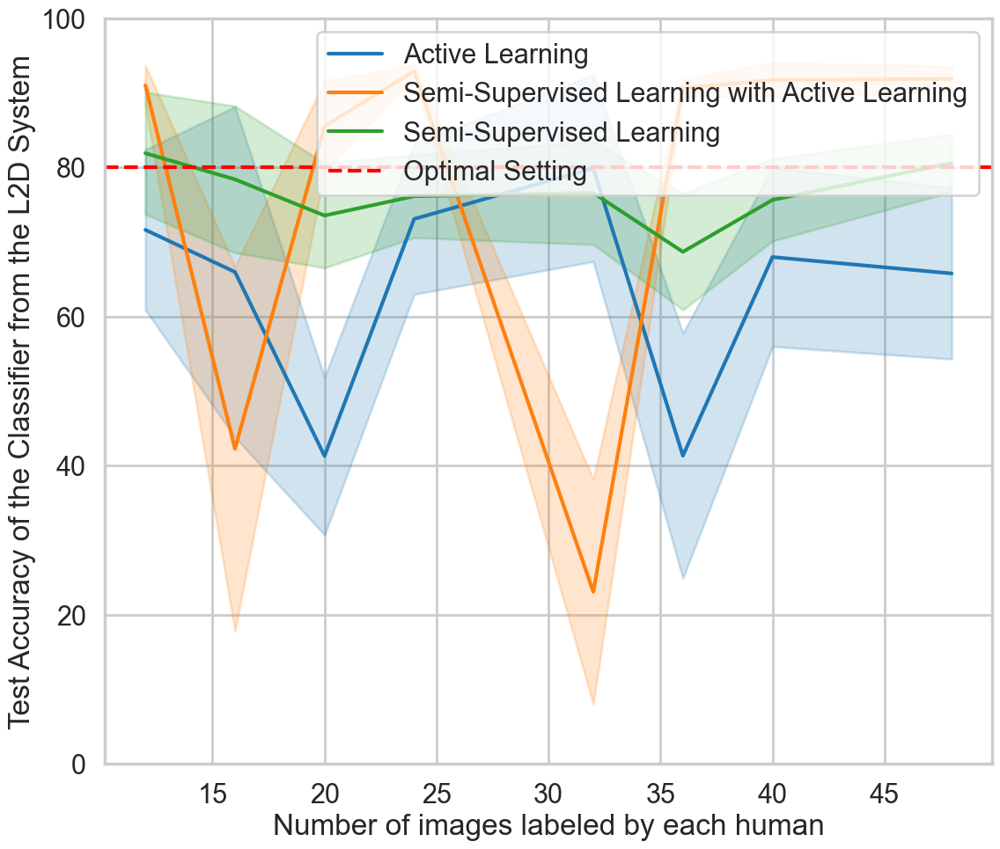

In [234]:
build_df = df_classifier_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=
#(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=np.mean, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(0, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the Classifier from the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning with Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/overall_clf_acc_right.png", bbox_inches="tight")

In [227]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/overall_clf_acc_right.csv")
pivoted_df

setting       mean                                              \
group                   0         12         16         20         24   
0           AL        NaN  71.626823  65.972239  41.277218  73.087151   
1      PERFECT  80.016855        NaN        NaN        NaN        NaN   
2          SSL        NaN  91.033727  42.237202  85.529931  92.930268   
3       SSL_AL        NaN  81.907743  78.399621  73.545305  76.137479   

                                                   ...     median        std  \
group         32         36         40         48  ...         48          0   
0      79.890513  41.316157  67.974654  65.774354  ...  93.781805        NaN   
1            NaN        NaN        NaN        NaN  ...        NaN  28.662451   
2      23.051918  90.655823  91.748175  91.867135  ...  92.826553        NaN   
3      76.574218  68.676910  75.640237  80.584380  ...  93.405384        NaN   

                                                                         \
group         12         16         20         24         32         36   
0      42.970434  44.348686  47.380016  35.041203  35.387038  46.518055   
1            NaN        NaN        NaN        NaN        NaN        NaN   
2      10.513529  48.879832  24.239810   2.665807  42.683858   3.334915   
3      32.758147  39.336869  39.695922  38.509161  39.148689  44.026518   

                             
group         40         48  
0      41.577699  45.938345  
1            NaN        NaN  
2       8.030213   6.732438  
3      38.213723  30.918980  

[4 rows x 27 columns]

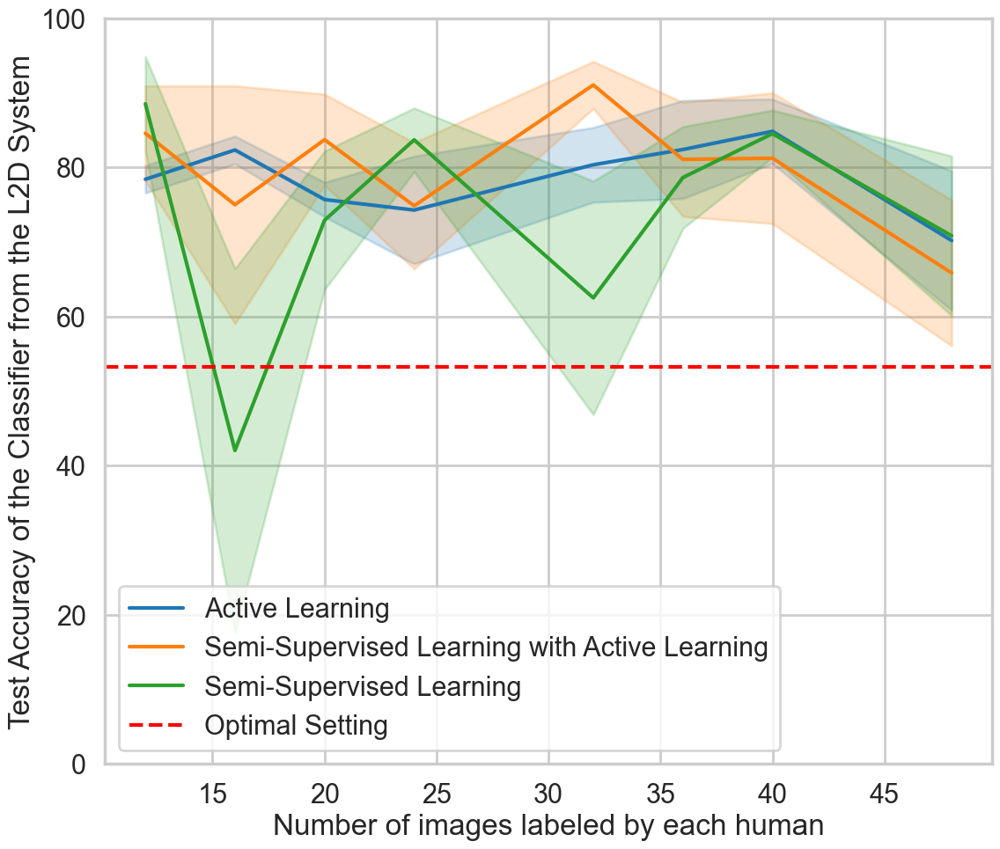

In [233]:
build_df = df_classifier_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=
#(lambda x: (estimator(x)-stats.sem(x), estimator(x)+stats.sem(x))))
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL_AL",), ("SSL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(0, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the Classifier from the L2D System")
plt.legend()
leg_texts = ["Active Learning", "Semi-Supervised Learning with Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/overall_clf_acc_target.png", bbox_inches="tight")

In [229]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/overall_clf_acc_target.csv")
pivoted_df

setting       mean                                              \
group                   0         12         16         20         24   
0           AL        NaN  78.410217  82.342191  75.690431  74.282606   
1      PERFECT  53.206338        NaN        NaN        NaN        NaN   
2          SSL        NaN  88.539965  42.024963  72.915304  83.698951   
3       SSL_AL        NaN  84.581580  74.998412  83.724095  74.852599   

                                                   ...     median       std  \
group         32         36         40         48  ...         48         0   
0      80.358145  82.405215  84.848255  70.191928  ...  84.235698       NaN   
1            NaN        NaN        NaN        NaN  ...        NaN  48.91147   
2      62.497917  78.644610  84.534059  70.828160  ...  91.661320       NaN   
3      91.066168  81.081500  81.238242  65.845979  ...  76.784496       NaN   

                                                                         \
group         12         16         20         24         32         36   
0       3.670432   3.734009   6.529596  25.045531  14.169130  18.608461   
1            NaN        NaN        NaN        NaN        NaN        NaN   
2      12.645564  48.795748  26.257824  14.795058  44.319054  19.311805   
3      12.718435  31.913610  17.284644  29.325074   8.923638  21.653265   

                             
group         40         48  
0      14.975864  37.407491  
1            NaN        NaN  
2      10.946917  42.813755  
3      30.382826  39.137854  

[4 rows x 27 columns]

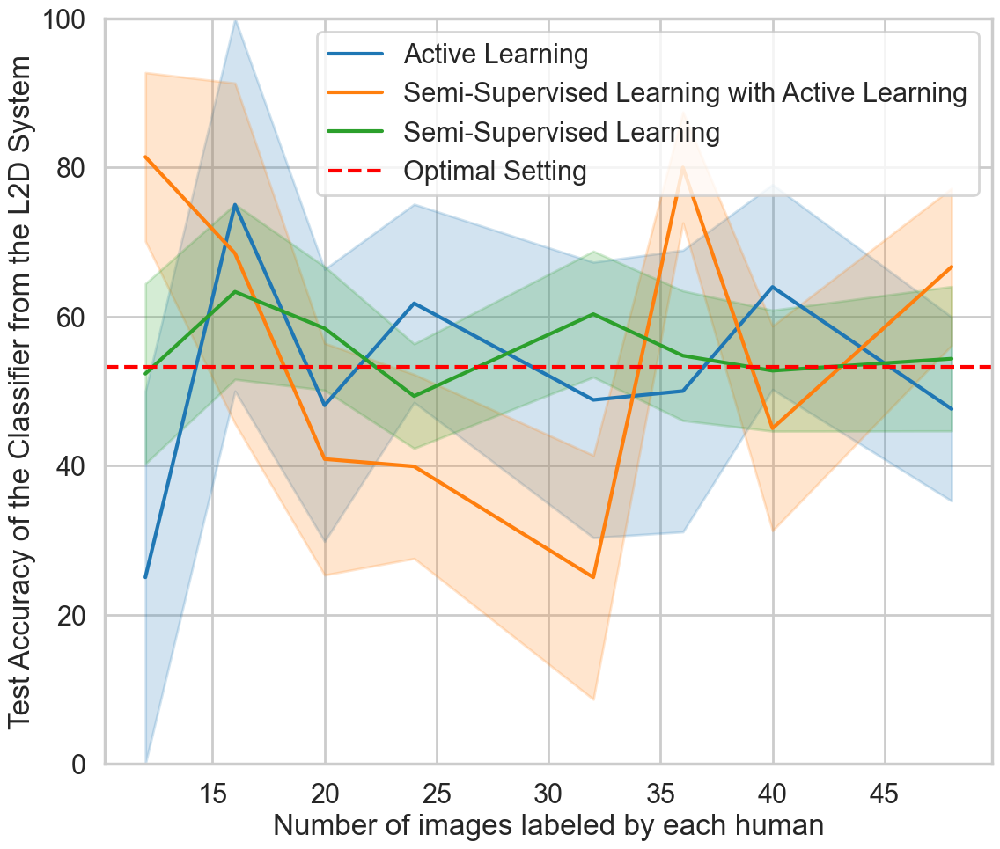

In [232]:
build_df = df_classifier_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=
#(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=np.mean, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(0, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the Classifier from the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning with Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/overall_clf_acc_right.png", bbox_inches="tight")

In [231]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/overall_clf_acc_right.csv")
pivoted_df

setting       mean                                              \
group                   0         12         16         20         24   
0           AL        NaN  24.999643  74.999186  48.076175  61.771074   
1      PERFECT  53.206338        NaN        NaN        NaN        NaN   
2          SSL        NaN  81.410665  68.471724  40.864831  39.880509   
3       SSL_AL        NaN  52.323923  63.316962  58.405464  49.314735   

                                                   ...     median       std  \
group         32         36         40         48  ...         48         0   
0      48.808220  49.997875  63.957812  47.582980  ...  41.666319       NaN   
1            NaN        NaN        NaN        NaN  ...        NaN  48.91147   
2      24.999500  79.998267  44.997100  66.664028  ...  83.329722       NaN   
3      60.314232  54.741269  52.726500  54.333570  ...  79.998800       NaN   

                                                                         \
group         12         16         20         24         32         36   
0      49.999286  49.999458  51.641674  46.068954  52.271167  53.449977   
1            NaN        NaN        NaN        NaN        NaN        NaN   
2      22.634543  45.684620  43.981700  42.761927  46.290079  21.043806   
3      48.329481  46.989649  46.903136  48.595752  47.792777  49.221805   

                             
group         40         48  
0      47.621854  49.383126  
1            NaN        NaN  
2      47.574214  42.161945  
3      48.707149  47.483159  

[4 rows x 27 columns]

### Expert Accuracy

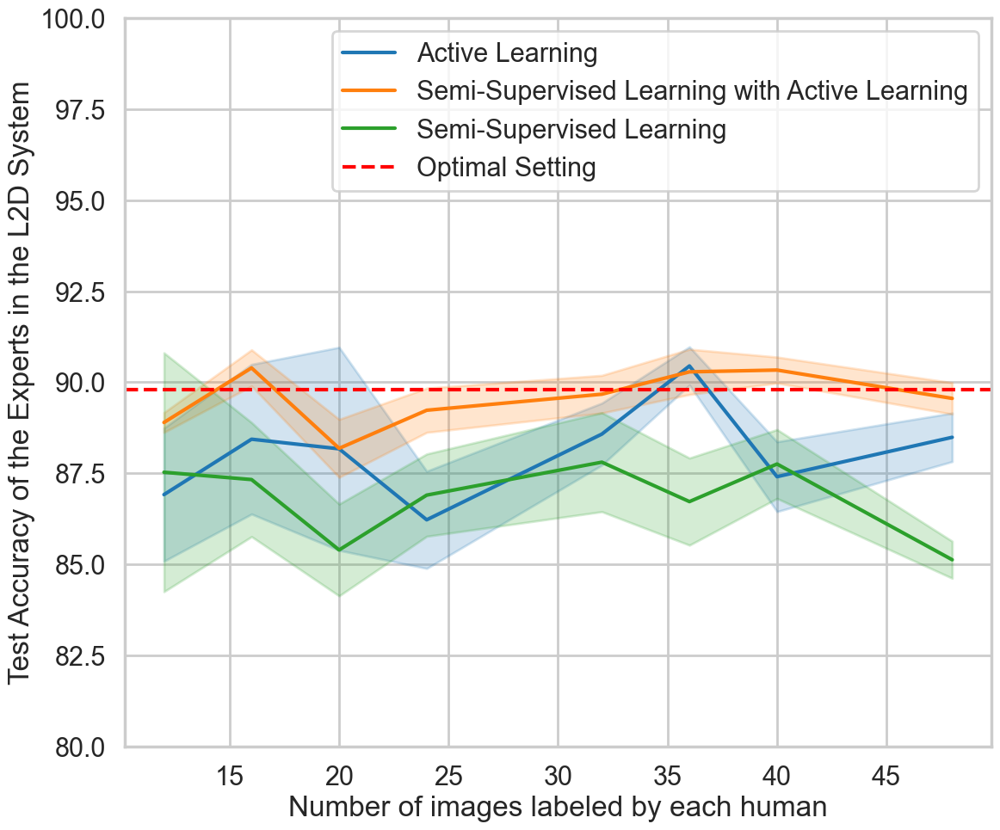

In [238]:
build_df = df_expert_accuracy.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting",]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL_AL",), ("SSL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the Experts in the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning with Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/overall_expert_acc_target.png", bbox_inches="tight")

In [239]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/overall_ex_acc_target.csv")
pivoted_df

setting       mean                                              \
group                   0         12         16         20         24   
0           AL        NaN  86.915243  88.436351  88.172545  86.223569   
1      PERFECT  89.800471        NaN        NaN        NaN        NaN   
2          SSL        NaN  87.529146  87.328127  85.395899  86.901125   
3       SSL_AL        NaN  88.896043  90.393383  88.184958  89.231184   

                                                   ...     median       std  \
group         32         36         40         48  ...         48         0   
0      88.577059  90.447686  87.407345  88.488672  ...  88.523111       NaN   
1            NaN        NaN        NaN        NaN  ...        NaN  3.656836   
2      87.805841  86.723545  87.755045  85.127540  ...  85.479818       NaN   
3      89.672003  90.285265  90.334644  89.556590  ...  89.363382       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0      4.085488  4.108524  8.360543  4.623121  2.405847  1.485177  3.322052   
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2      7.329880  3.132218  3.781260  3.915456  3.843032  3.381380  3.275361   
3      2.881647  1.721492  3.978923  3.643932  2.531254  3.045566  2.141632   

                 
group        48  
0      2.663573  
1           NaN  
2      2.029681  
3      2.987167  

[4 rows x 27 columns]

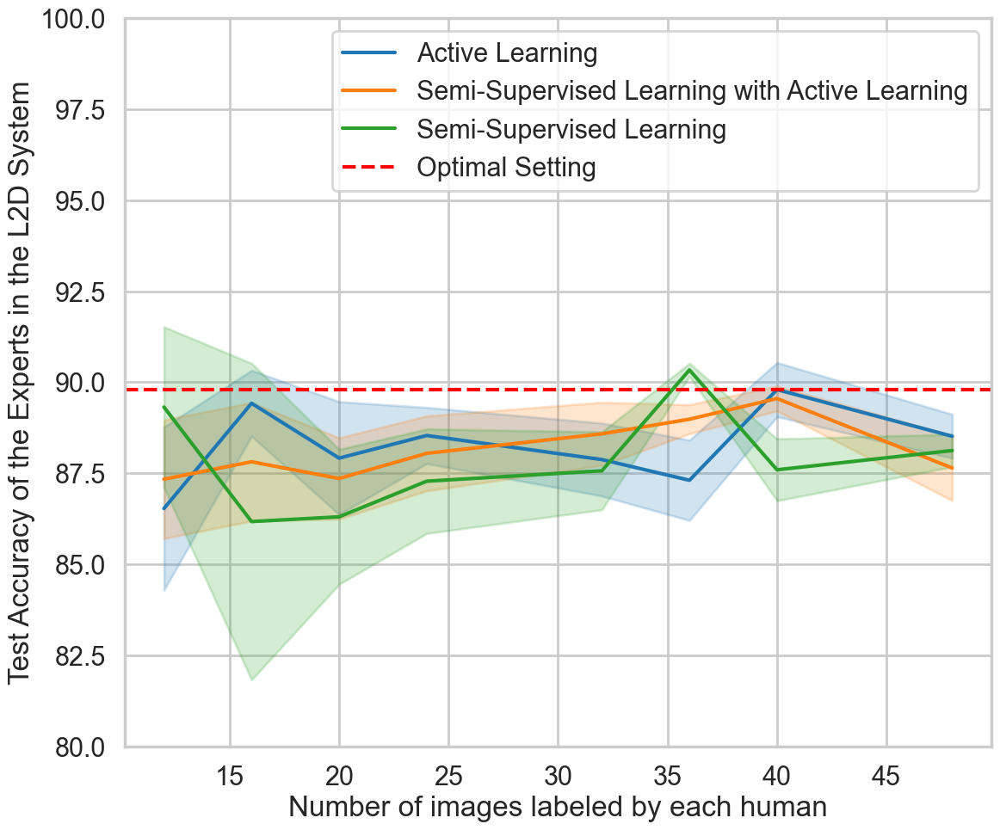

In [240]:
build_df = df_expert_accuracy.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL_AL",), ("SSL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the Experts in the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning with Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/overall_expert_acc_rigth.png", bbox_inches="tight")

In [241]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/overall_ex_acc_right.csv")
pivoted_df

setting       mean                                              \
group                   0         12         16         20         24   
0           AL        NaN  86.534261  89.423244  87.917043  88.538155   
1      PERFECT  89.800471        NaN        NaN        NaN        NaN   
2          SSL        NaN  89.317387  86.175262  86.305774  87.283352   
3       SSL_AL        NaN  87.338552  87.816483  87.358597  88.048028   

                                                   ...     median       std  \
group         32         36         40         48  ...         48         0   
0      87.877248  87.309285  89.798231  88.517434  ...  88.331603       NaN   
1            NaN        NaN        NaN        NaN  ...        NaN  3.656836   
2      87.569169  90.337655  87.596374  88.125174  ...  88.952135       NaN   
3      88.583697  88.985294  89.553258  87.646938  ...  88.358500       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0      4.473951  1.808040  4.382359  2.668773  2.830151  3.116974  2.573933   
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2      4.412462  8.689862  5.238990  4.969705  3.023888  0.514623  2.942419   
3      3.255402  3.250861  3.152244  3.556369  2.451846  1.125895  1.183813   

                 
group        48  
0      2.411562  
1           NaN  
2      1.785733  
3      3.576138  

[4 rows x 27 columns]

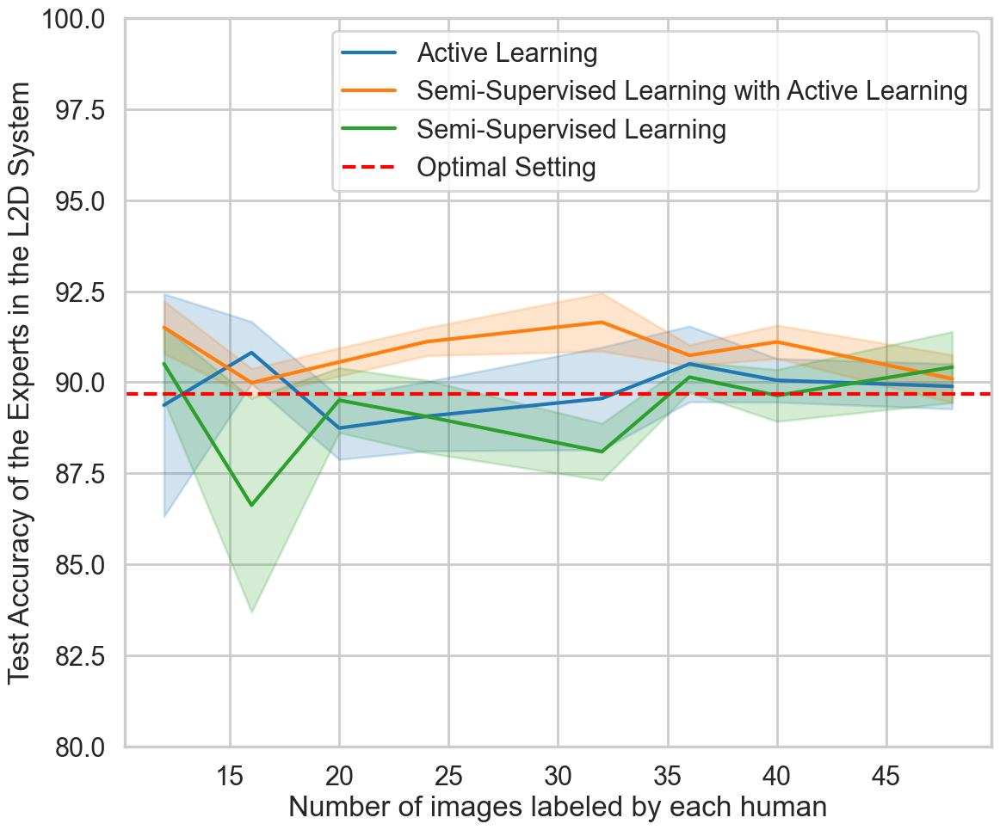

In [242]:
build_df = df_expert_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting",]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL_AL",), ("SSL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the Experts in the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning with Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/overall_expert_acc_target.png", bbox_inches="tight")

In [243]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/overall_ex_acc_target.csv")
pivoted_df

setting      mean                                              \
group                  0         12         16         20         24   
0           AL       NaN  89.372133  90.815426  88.741586  89.066111   
1      PERFECT  89.68276        NaN        NaN        NaN        NaN   
2          SSL       NaN  90.507705  86.625341  89.506970  89.059635   
3       SSL_AL       NaN  91.505702  89.985360  90.554868  91.113413   

                                                   ...     median       std  \
group         32         36         40         48  ...         48         0   
0      89.555479  90.501891  90.052328  89.888135  ...  89.871665       NaN   
1            NaN        NaN        NaN        NaN  ...        NaN  2.678827   
2      88.093424  90.142058  89.636416  90.414351  ...  88.817480       NaN   
3      91.648991  90.738442  91.108210  90.095978  ...  90.199853       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0      6.109602  1.700602  2.427829  3.294061  3.981683  2.939243  2.070187   
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2      2.018327  5.864735  2.515753  3.448365  2.202851  1.175816  2.464250   
3      2.494137  1.359743  1.891664  2.290109  2.253519  1.411608  2.419986   

                 
group        48  
0      2.477079  
1           NaN  
2      3.897917  
3      2.623597  

[4 rows x 27 columns]

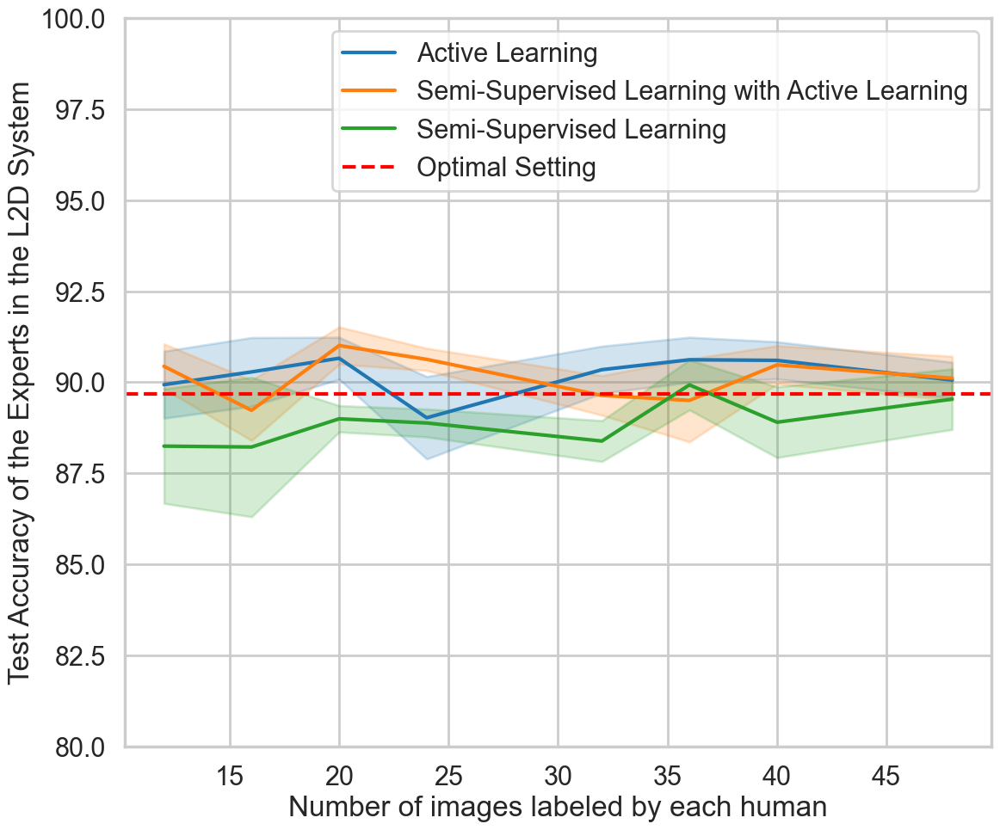

In [244]:
build_df = df_expert_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL_AL",), ("SSL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the Experts in the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning with Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/overall_expert_acc_rigth.png", bbox_inches="tight")

In [245]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/overall_ex_acc_right.csv")
pivoted_df

setting      mean                                              \
group                  0         12         16         20         24   
0           AL       NaN  89.933140  90.283841  90.658978  89.024819   
1      PERFECT  89.68276        NaN        NaN        NaN        NaN   
2          SSL       NaN  88.246324  88.222242  88.996600  88.881747   
3       SSL_AL       NaN  90.437544  89.229230  91.008004  90.628382   

                                                   ...     median       std  \
group         32         36         40         48  ...         48         0   
0      90.344761  90.617759  90.600471  90.060008  ...  89.999856       NaN   
1            NaN        NaN        NaN        NaN  ...        NaN  2.678827   
2      88.385492  89.927639  88.902562  89.535256  ...  89.140112       NaN   
3      89.638974  89.501755  90.477609  90.110742  ...  90.378530       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0      1.841131  1.888474  1.629000  3.921121  1.828902  1.749047  1.770936   
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2      3.144236  3.831018  1.024371  1.327572  1.590476  1.939863  3.363886   
3      1.230564  1.658508  1.445105  1.054955  1.536109  3.221693  1.819393   

                 
group        48  
0      1.964482  
1           NaN  
2      3.322740  
3      2.406761  

[4 rows x 27 columns]

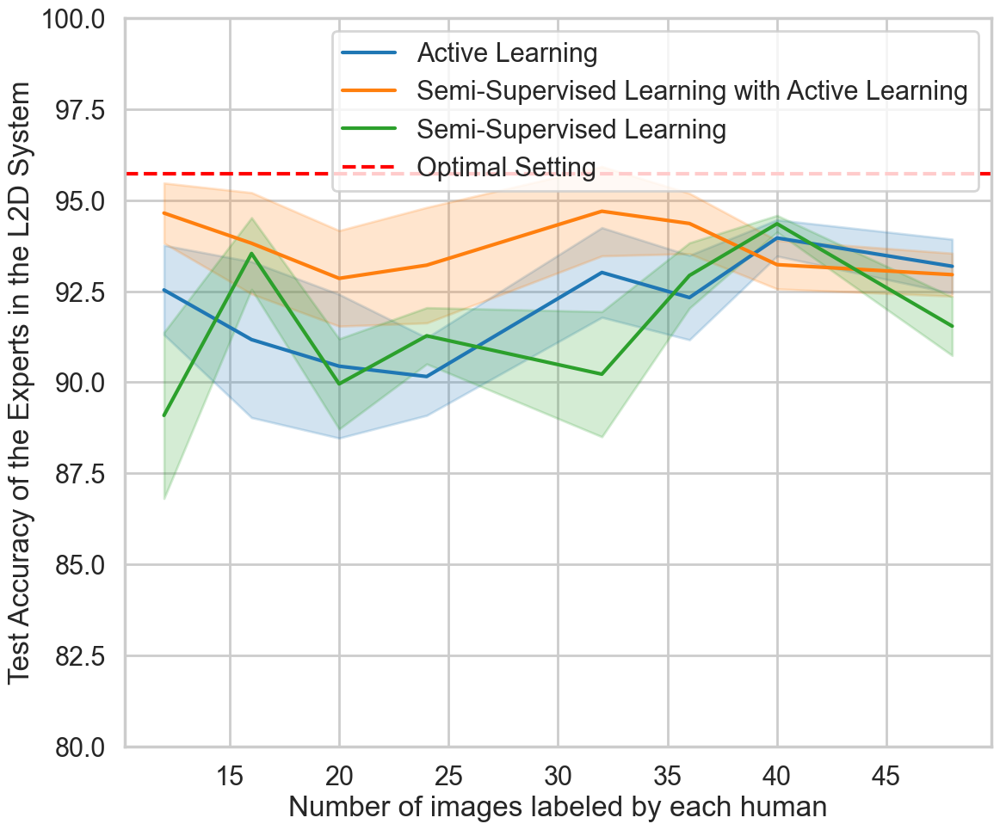

In [246]:
build_df = df_expert_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting",]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL_AL",), ("SSL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the Experts in the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning with Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/overall_expert_acc_target.png", bbox_inches="tight")

In [247]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/overall_ex_acc_target.csv")
pivoted_df

setting       mean                                              \
group                   0         12         16         20         24   
0           AL        NaN  92.533727  91.170727  90.440800  90.157134   
1      PERFECT  95.714213        NaN        NaN        NaN        NaN   
2          SSL        NaN  89.090141  93.534448  89.954542  91.275164   
3       SSL_AL        NaN  94.644853  93.815461  92.852197  93.214183   

                                                   ...     median       std  \
group         32         36         40         48  ...         48         0   
0      93.013933  92.325055  93.961220  93.183836  ...  94.374616       NaN   
1            NaN        NaN        NaN        NaN  ...        NaN  2.276264   
2      90.221163  92.931058  94.351288  91.540395  ...  91.064790       NaN   
3      94.694730  94.358177  93.228293  92.953423  ...  93.495201       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0      2.455186  4.281071  5.581793  3.691300  3.480162  3.278796  1.723759   
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2      4.559231  1.968443  3.502139  2.675977  4.858083  2.536471  0.792443   
3      1.649814  2.782570  3.712913  5.494804  3.469773  2.342647  2.306806   

                 
group        48  
0      2.974100  
1           NaN  
2      3.218154  
3      2.356482  

[4 rows x 27 columns]

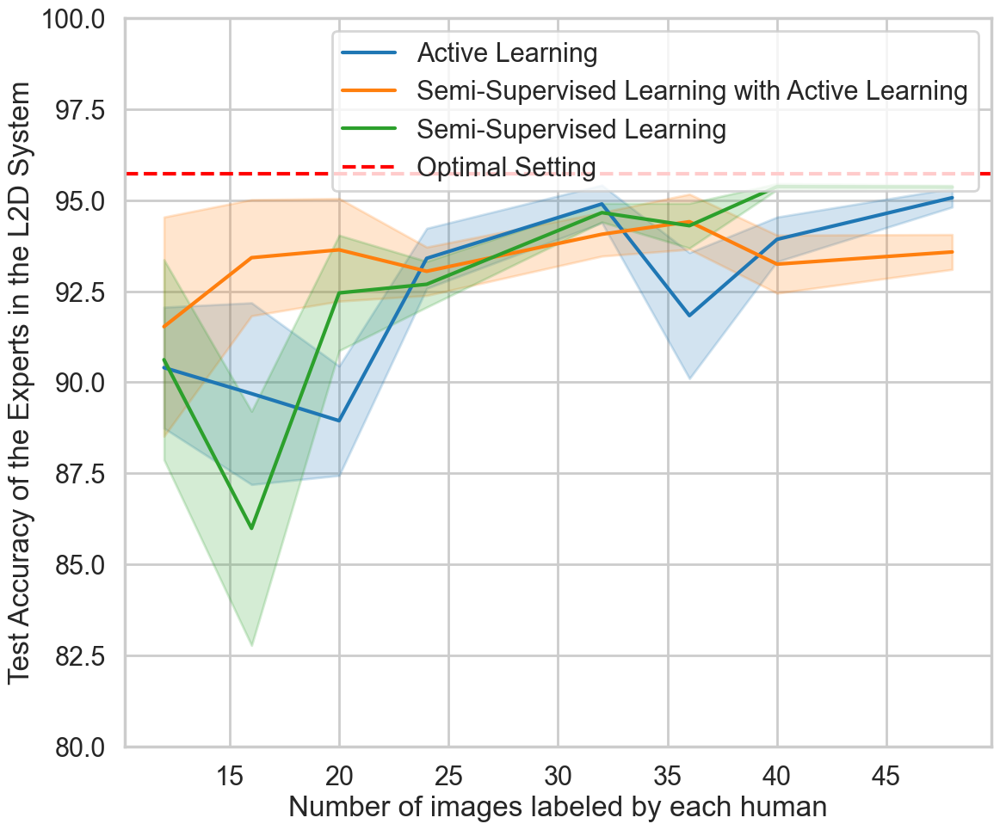

In [248]:
build_df = df_expert_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL_AL",), ("SSL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the Experts in the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning with Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/overall_expert_acc_rigth.png", bbox_inches="tight")

In [249]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/overall_ex_acc_right.csv")
pivoted_df

setting       mean                                              \
group                   0         12         16         20         24   
0           AL        NaN  90.400688  89.687387  88.943643  93.401909   
1      PERFECT  95.714213        NaN        NaN        NaN        NaN   
2          SSL        NaN  90.617983  85.989043  92.452129  92.689743   
3       SSL_AL        NaN  91.526823  93.419619  93.635884  93.046420   

                                                   ...     median       std  \
group         32         36         40         48  ...         48         0   
0      94.895046  91.830459  93.923150  95.066242  ...  95.383229       NaN   
1            NaN        NaN        NaN        NaN  ...        NaN  2.276264   
2      94.656492  94.298186  95.368835  95.357519  ...  95.348262       NaN   
3      94.063121  94.407717  93.242710  93.576943  ...  93.889639       NaN   

                                                                             \
group        12        16        20        24        32        36        40   
0      3.321600  4.988710  4.251538  2.854636  1.461446  4.887296  2.118645   
1           NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2      5.490341  6.426197  4.480284  2.174996  0.725787  1.737655  0.286394   
3      6.018126  3.189617  3.988203  2.303325  1.698163  2.142090  2.761184   

                 
group        48  
0      1.025190  
1           NaN  
2      0.210099  
3      1.915512  

[4 rows x 27 columns]

## Playground

[(80.0, 100.0)]

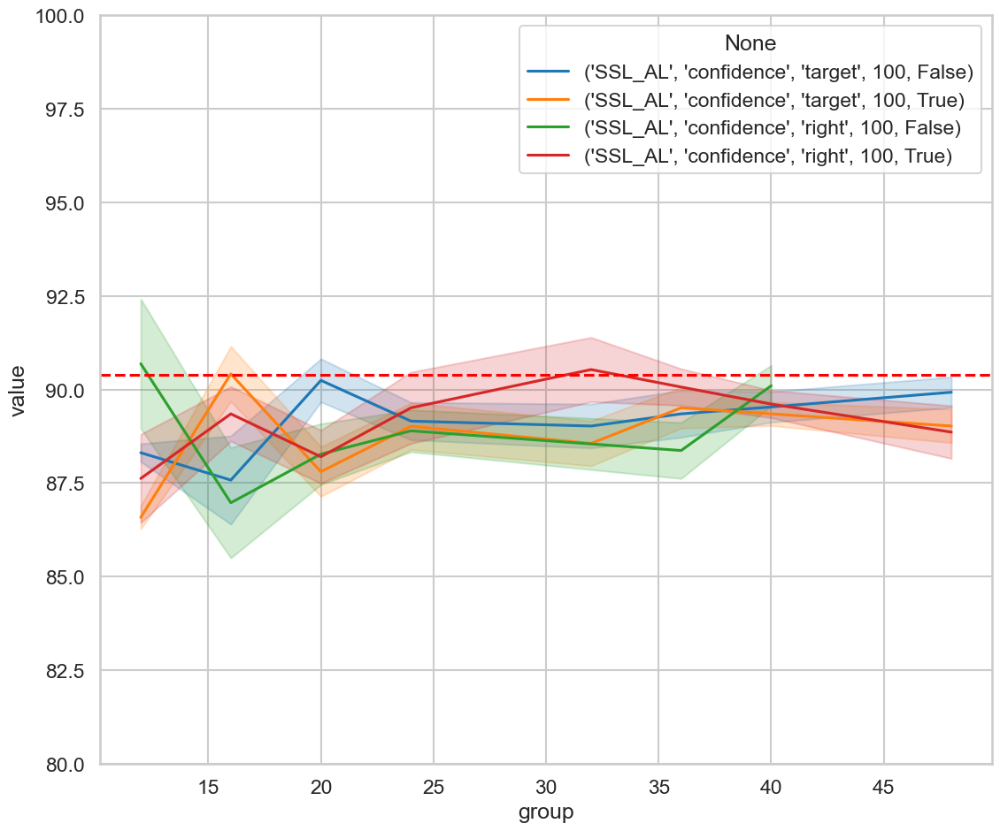

In [25]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
#dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]
dff = dff[dff["mod"] != "disagreement_diff"]

dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("talk")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict", "overlap", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

[(80.0, 100.0)]

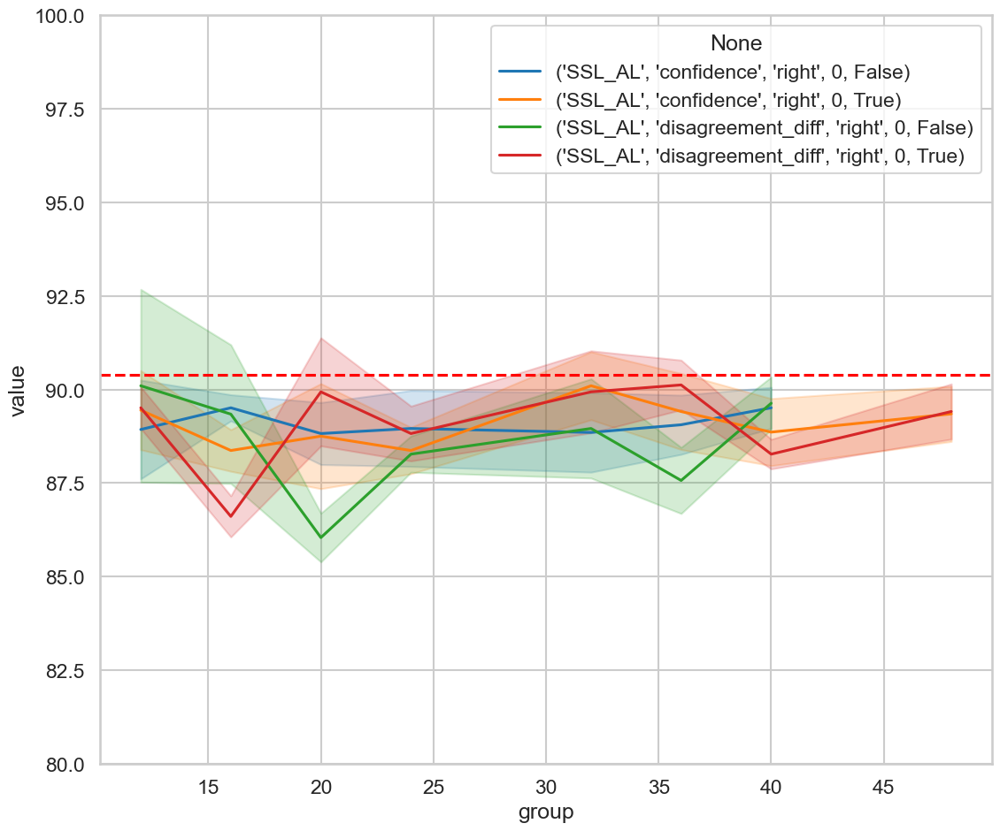

In [26]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["overlap"] != 100]
#dff = dff[dff["sample_equal"] != False]
#dff = dff[dff["mod"] != "disagreement_diff"]

dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("talk")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict", "overlap", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

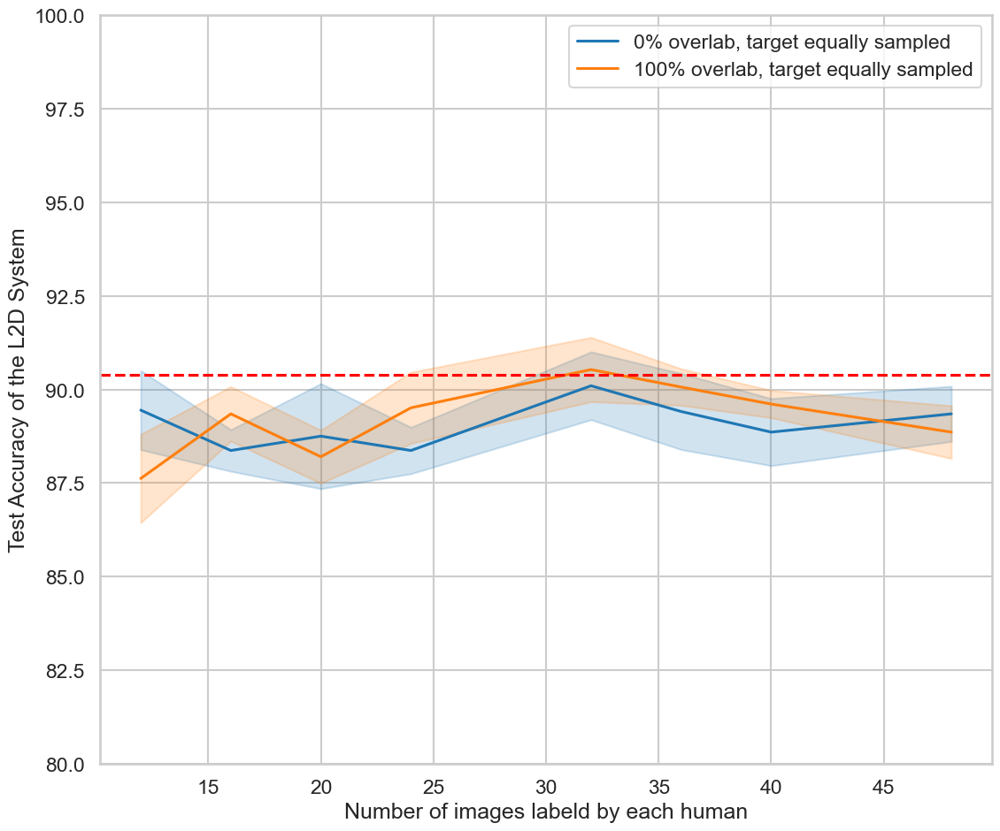

In [35]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
dff = dff[dff["expert_predict"] == "right"]
#dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]
dff = dff[dff["mod"] != "disagreement_diff"]

dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("talk")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict", "overlap", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["0% overlab, target equally sampled", "100% overlab, target equally sampled"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)

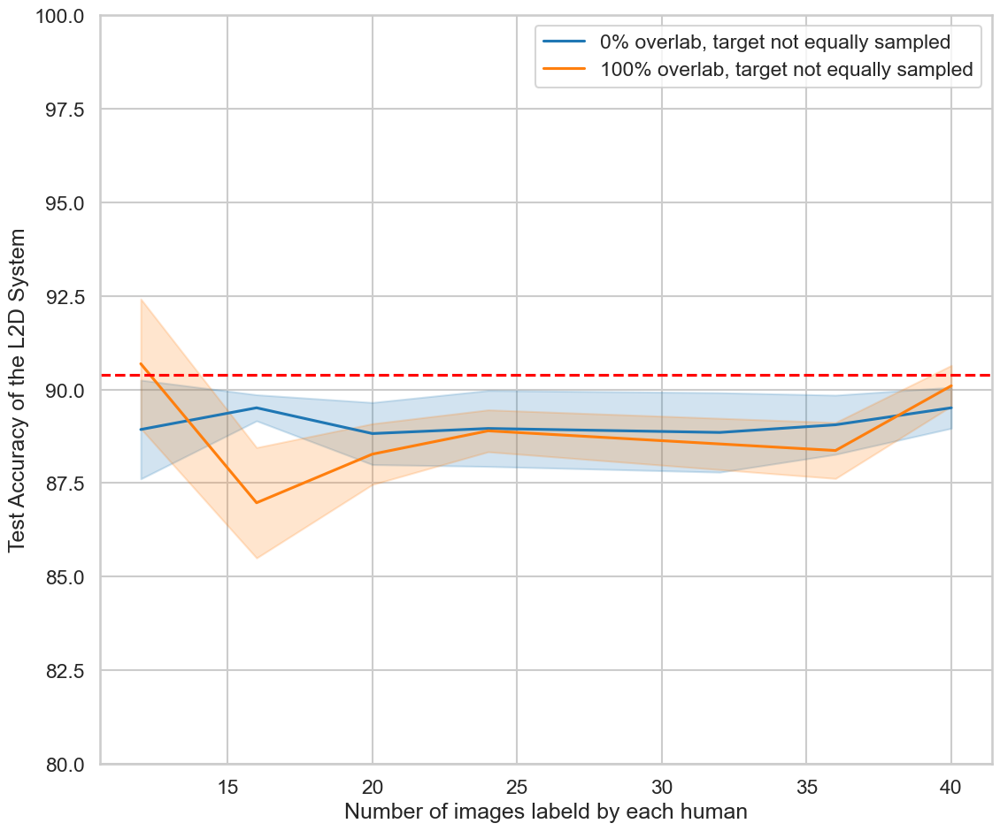

In [38]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
dff = dff[dff["expert_predict"] == "right"]
#dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != True]
dff = dff[dff["mod"] != "disagreement_diff"]

dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("talk")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict", "overlap", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["0% overlab, target not equally sampled", "100% overlab, target not equally sampled"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)

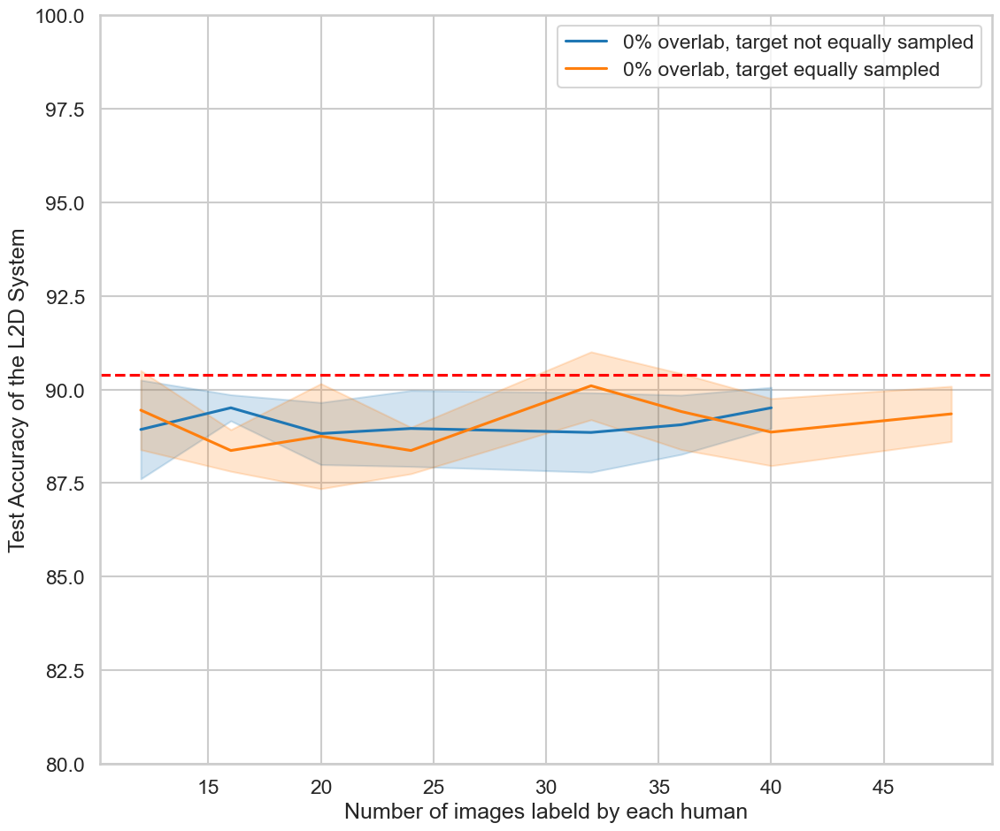

In [47]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["overlap"] == 0]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["mod"] != "disagreement_diff"]

dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("talk")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict", "overlap", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["0% overlab, target not equally sampled", "0% overlab, target equally sampled"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)

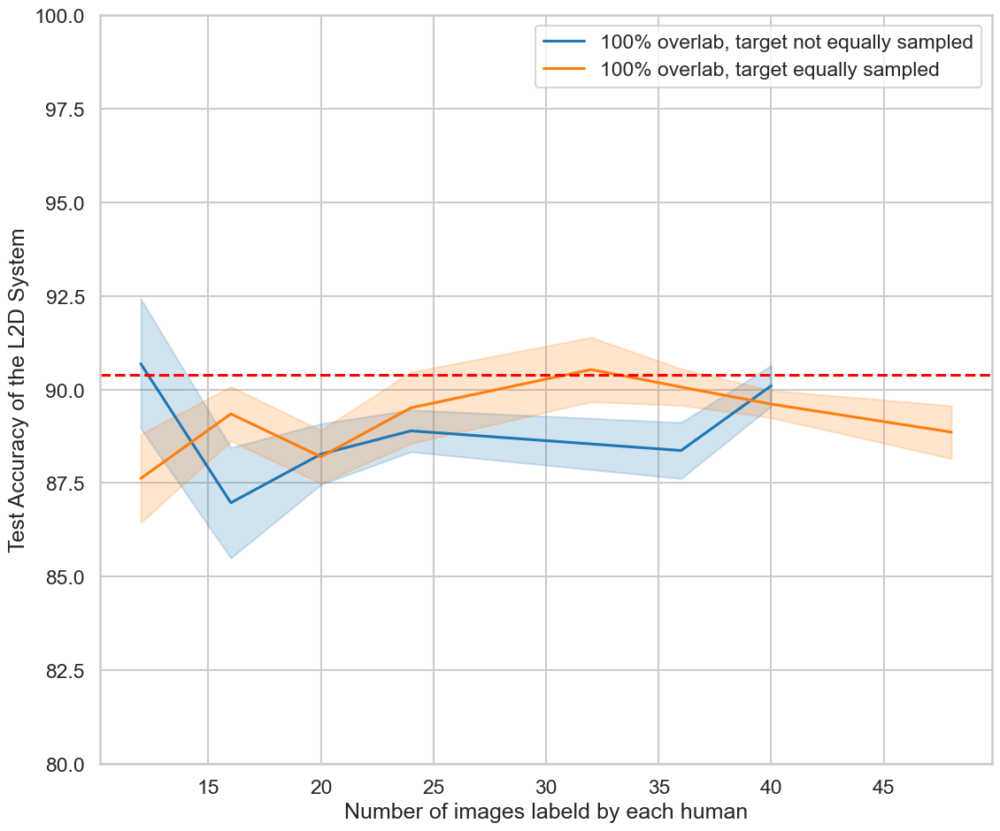

In [49]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] != False]
dff = dff[dff["mod"] != "disagreement_diff"]

dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("talk")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict", "sample_equal", "overlap"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["100% overlab, target not equally sampled", "100% overlab, target equally sampled"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)

In [58]:
dfff["group"].unique()

array([  0, 193], dtype=int64)

In [17]:
dff.to_excel("bac.xlsx")

In [ ]:
grouped_columns = ["sample_equal", "overlap", "init_size", "labels_per_round", "rounds"]
cut_out = [("mod", "disagreement"), ("labeler_ids", "[4295342357, 4295354117]"), ("labeler_ids", "[4323195249, 4295232296]")]
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "labeler_ids"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)

selected_runs["labeler_ids"] = selected_runs["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=(0, 7))
group_test = group_ttest(df)

In [ ]:
dff = df[df["group"] != 0].reset_index()
dfff = df[df["group"] == 0].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
f, ax = plt.subplots(figsize=(25, 11))
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
sns.lineplot(x="group", y="value", hue="setting", data=dff, err_style="band", markers=True, estimator=np.mean, errorbar=("sd", 0.5))
ax.axhline(dfff["value"].mean(), ls='--')
ax.set(ylim=(80, 95))

In [ ]:
grouped_columns = ["sample_equal", "overlap", "init_size", "labels_per_round", "rounds"]
cut_out = [("mod", "disagreement")]
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "labeler_ids"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)

selected_runs["labeler_ids"] = selected_runs["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=(0, 7))
group_test = group_ttest(df)

In [ ]:
dff = df[df["group"] != 0].reset_index()
dfff = df[df["group"] == 0].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff["setting"] = dff.apply(lambda x: f'{x["setting"]}_{x["labeler_ids"]}', axis=1)
f, ax = plt.subplots(figsize=(25, 11))
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
#sns.lineplot(x="group", y="value", hue="setting", data=dff, err_style="band", markers=True, estimator=np.mean, errorbar=("sd", 0.5))
sns.lineplot(x="group", y="value", hue="setting", data=dff, markers=True)
ax.axhline(dfff["value"].mean(), ls='--')
ax.set(ylim=(80, 95))

In [ ]:
grouped_columns = ["init_size", "labels_per_round", "rounds"]
cut_out = [("mod", "disagreement"), ("mod", "disagreement_diff"),
           ("labeler_ids", "[4295349121, 4295342357]"), ("labeler_ids", "[4323195249, 4295232296]"), 
           ("setting", "AL"), ("setting", "SSL"), ("setting", "SSL_AL_SSL"), ("setting", "NORMAL"),]
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "sample_equal", "overlap"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)

selected_runs["labeler_ids"] = selected_runs["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=(0, 7))
group_test = group_ttest(df)

In [ ]:
grouped_columns = ["sample_equal", "overlap", "init_size", "labels_per_round", "rounds", "labeler_ids"]
#cut_out = [("expert_predict", "right"), ("mod", "disagreement")]
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager_cifar.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs_cifar.iloc[:], df_test, grouped_columns, False, cut_out)

#selected_runs["labeler_ids"] = selected_runs["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=None)
group_test = group_ttest(df)

# Analysis

In [ ]:
metricManager.get_l2d_dataframe("verma", "val").columns

In [ ]:
metricManager.get_l2d_dataframe("hemmer", "val").columns

In [ ]:
exclude = [("expert_predict", "right")]
#exclude = None

df_accuracy = metricManager.get_metrics_dataframe_cut("verma", "test", "system_accuracy", exclude)
f, ax = plt.subplots(figsize=(70, 11))
ax.set(xlabel='Run', ylabel='Val System Accuracy')
box = sns.boxplot(df_accuracy)
plt.show()
box.figure.savefig("all_runs.png", bbox_inches="tight")

df_ttests = pd.DataFrame(check_all_ttest(df_accuracy))
# Draw a heatmap with the numeric values in each cell
f, ax = plt.subplots(figsize=(25, 11))
sns.heatmap(df_ttests, annot=True, linewidths=.5, ax=ax)

df_runs.loc[[int(el) for el in df_accuracy.columns]]

In [ ]:
import matplotlib.ticker as ticker

def row_to_name(row):
    result = row["setting"] + "_"
    row = row.drop("setting")
    for col in row:
        result += str(col) + "_"
    return result[:-1]

In [ ]:
df_verma = df.copy()
df_ver = df_verma.melt(var_name='run')
df_ver["method"] = ["verma" for i in range(len(df_verma.melt()))]
df_ver

In [ ]:
df_hemmer = df.copy()
df_hem = df_hemmer.melt(var_name='run')
df_hem["method"] = ["hemmer" for i in range(len(df_hemmer.melt()))]
df_hem

In [ ]:
df = pd.concat([df_ver, df_hem])

sns.set_style("whitegrid")
sns.set_context("poster")
f, ax = plt.subplots(figsize=(25, 9))
box_plot = sns.boxplot(df, x="run", y="value", hue="method")
#box_plot.tick_params(labelsize=5)

labels = [row_to_name(selected_runs.loc[x]) for x in selected_runs.index]
labels = list(map(lambda x: x.replace('NORMAL', 'Supervised'), labels))
ax.set_xticks(ax.get_xticks(), labels)
ax.set(xlabel='Group', ylabel=f"{method}_{step}_{metric_name}")

#plt.axhline(df[0].median(), color='r') # horizontal

#for tick in ax.xaxis.get_major_ticks()[1::2]:
    #tick.set_pad(35)

plt.xticks(rotation=45)
box_plot.figure.savefig("all_runs_grouped_cutRightDisagreementdiff.png", bbox_inches='tight')
plt.show()

In [ ]:
var_columns = ["sample_equal", "overlap", "rounds", "init_size", "labels_per_round", "mod"]
cut_out = [("setting", "SSL_AL_SSL"), ("setting", "NORMAL")]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, var_columns, False, cut_out)


sns.set_style("whitegrid")
sns.set_context("poster")
f, ax = plt.subplots(figsize=(22, 9))
box_plot = sns.boxplot(df)
#box_plot.tick_params(labelsize=5)

labels = [row_to_name(selected_runs.loc[x]) for x in selected_runs.index]
labels = list(map(lambda x: x.replace('NORMAL', 'Supervised'), labels))
ax.set_xticks(ax.get_xticks(), labels)
#ax.set(xlabel='Training method', ylabel=f"{method}_{step}_{metric_name}")
ax.set(xlabel='Training method', ylabel=f"System Accuracy")

plt.axhline(df[0].median(), color='r') # horizontal

#for tick in ax.xaxis.get_major_ticks()[1::2]:
    #tick.set_pad(35)

plt.xticks(rotation=45)
box_plot.figure.savefig("all_runs_grouped_cutRightDisagreementdiff.svg", bbox_inches='tight', format="svg")
plt.show()
#

m, test_plot = check_all_ttest(df, plot=True)
test_plot.get_figure().savefig("Images/ttest_all_runs_grouped_cutRightDisagreementDisagreementdiff.png", bbox_inches="tight")

selected_runs.head(70)

In [ ]:
var_columns = ["sample_equal", "overlap", "cost", "labeled"]

cut_out = [("expert_predict", "right")]

df_test = cut_column_name(metricManager.get_metric_dataframe("verma", "val", "system_accuracy"))
df, runs_df = get_runs_hue_metric(df_runs.iloc[:], df_test, var_columns, cut_out)
group_test = group_ttest(df)

In [ ]:
var_columns = ["sample_equal", "overlap"]
cut_out = [("expert_predict", "right"), ("setting", "AL"), ("setting", "NORMAL"), ("mod", "disagreement"), ("setting", "SSL"), ("setting", "SSL_AL_SSL"), ("mod", "disagreement_diff")]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df, runs_df, series = plot_runs_hue_metric(df_runs.iloc[:], df_test, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", sorted_columns=["labeled"])
group_test = group_ttest(df)

In [ ]:
def get_index_from_tuple(tuple, name):
    for idx, element in enumerate(tuple):
        if name in element:
            return idx
    return -1

get_index_from_tuple(li[0], "labeled")

In [ ]:
sorted_names = ["labeled", "init_size", "overlap"]
sorted_by_second = sorted(li, key=lambda tup: tuple([tup[idx] for idx in [get_index_from_tuple(tup, name) for name in sorted_names]]))
ser = pd.Series(sorted_by_second)
ser.head()

def get_index_from_tuple(tuple, name):
    for idx, element in enumerate(tuple):
        if name in element:
            return idx
    return -1

In [ ]:
def plot_runs_hue_metric(df_runs, df_metrics, var_columns, unwanted_tuples=None, y_text="value", sorted_columns=None, size=(15, 8)):
    df, runs_df = get_runs_hue_metric(df_runs.iloc[:], df_metrics, var_columns, unwanted_tuples)

    #f, ax = plt.subplots(figsize=size)
    f, ax = plt.subplots(1, 2, figsize=size, gridspec_kw=dict(width_ratios=[1, 9]))

    df_perfect = df[df["group"] == 0]
    df = df[df["group"] != 0]

    #f = plt.figure()

    #ax = f.add_subplot(2, 2, 1)

    display(HTML(runs_df.to_html()))

    ax[0].set(ylim=(70, 97))
    ax[1].set(ylim=(70, 97))

    #lis = sorted(df[var_columns].apply(tuple, axis=1), key=lambda tup: tup[0])
    lis = df[var_columns].apply(tuple, axis=1)
    sort = sorted(list(lis.unique()), key=lambda tup: tuple([tup[idx] for idx in [get_index_from_tuple(var_columns, name) for name in var_columns]]))

    g = sns.boxplot(df_perfect, y="value", x="group", ax=ax[0])
    g = sns.boxplot(df, y="value", x="group", hue=lis, hue_order=sort, ax=ax[1])

    #ax[0].set(xlabel='', ylabel=y_text)
    ax[0].set(xlabel='', ylabel="System accuracy")
    ax[1].set(xlabel='', ylabel="")

    series = pd.Series(df[var_columns].apply(tuple, axis=1))
    for i in range(len(var_columns)):
        name = var_columns[i]
        for j, el in enumerate(series):
            el = list(series.iloc[j])
            if name == "labeled":
                name += " images"
            el[i] = f"{name}: {el[i]}"
            series.iloc[j] = tuple(el)

    li = list(series.unique())
    sorted_list = sorted(li, key=lambda tup: tuple([tup[idx] for idx in [get_index_from_tuple(tup, name) for name in var_columns]]))

    plt.legend(loc='lower right', ncol=2)
    #plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=2, mode="expand", borderaxespad=0.)
    #plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

    #labels = list(map(lambda x: x.replace('NORMAL', 'Supervised'), labels))
    ax[0].set_xticks(ax[0].get_xticks(), ["Perfect"])
    ax[1].set_xticks(ax[1].get_xticks(), ["SSL + AL"])
    
    for t, l in zip(g.legend_.texts, sorted_list):
        #print(l)
        #print(cut_hue_legend(str(l)))
        t.set_text(cut_hue_legend(str(l)))
        #t.set_text(l)

    f.tight_layout()
    f.savefig("labeled_images.svg", bbox_inches='tight', format="svg")
    plt.show(g)

    return df, runs_df, lis

In [ ]:
def cut_hue_legend(name):
    return name.replace(",", "").replace("(", "").replace(")", "")

In [ ]:
grouped_columns = ["sample_equal", "overlap"]
cut_out = [("expert_predict", "right"), ("mod", "disagreement"), ("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("setting", "SSL_AL_SSL")]
var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}")
group_test = group_ttest(df)

In [ ]:
grouped_columns = ["sample_equal", "overlap", "rounds", "init_size", "labels_per_round"]
cut_out = [("expert_predict", "right"), ("mod", "disagreement_diff"), ("mod", "disagreement"),]
var_columns = ["labeled"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)



df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}")
group_test = group_ttest(df)

In [ ]:
grouped_columns = ["sample_equal", "overlap"]
cut_out = [("expert_predict", "right"), ("mod", "disagreement_diff"), ("mod", "disagreement"), ("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("setting", "SSL_AL_SSL")]
var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}")
#group_test = group_ttest(df)

plt.show()

# Expert

In [450]:
class ExpertMetrics:
    def __init__(self, metrics):
        self.metric = metrics

        self.runs = pd.DataFrame(metrics).drop(["expert metrics", "verma", "hemmer", "artificial expert predictions"], axis=1)
        
        self.runs["al_labels"] = self.runs.apply(lambda x: 1 if (x["labeled"]-x["init_size"])/x["labeled"] >= 0.5 else 0, axis=1)
        
        self.cache = {}

        self.expert_values = {
            "Val": {},
            "Test": {},
        }

    def get_experts_in_run(self, run):
        """
        Returns a list of all expert ids in this run
        """
        seed = list(self.metric[run]["expert metrics"].keys())[0]
        fold = list(self.metric[run]["expert metrics"][seed].keys())[0]
        return list(self.metric[run]["expert metrics"][seed][fold].keys())

    def creat_expert_run(self, expertId, run, step, metric_name):
        """
        Creates a pd.DataFrame which consists of the start and end as columns and Seed_Fold as index
        """
        run_dict = {}
        for seed, value1 in self.metric[run]["expert metrics"].items():
            seed_dict = {}
            for fold, value2 in value1.items():
                expert_metric = value2[expertId][step]
                fold_dict = {}
                if metric_name in expert_metric["End"]:
                    fold_dict["End"] = expert_metric["End"][metric_name]
                else:
                    if metric_name == "f0.5":
                        fold_dict["End"] = f_beta_score(expert_metric["End"]["tp"], expert_metric["End"]["tn"], expert_metric["End"]["fp"], expert_metric["End"]["fn"], 0.5)
                    if metric_name in ["tp", "fp", "tn", "fn"]:
                        fold_dict["End"] = read_from_conv(expert_metric["End"]["conf_matrix"])[metric_name]
                    if metric_name == "fpr": #fp / (fp + tn)
                        if "conf_matrix" in expert_metric["End"]:
                            conv = read_from_conv(expert_metric["End"]["conf_matrix"])
                            if (conv["fp"] + conv["tn"]) <= 0:
                                print("0 detected")
                                fold_dict["End"] = -1
                            else:
                                fold_dict["End"] = conv["fp"] / (conv["fp"] + conv["tn"])
                        else:
                            if (expert_metric["End"]["fp"] + expert_metric["End"]["tn"]) <= 0:
                                fold_dict["End"] = -1
                            else:
                                fold_dict["End"] = expert_metric["End"]["fp"] / (expert_metric["End"]["fp"] + expert_metric["End"]["tn"])
                if "Start" in expert_metric and False:
                    if metric_name in expert_metric["Start"]:
                        fold_dict["Start"] = expert_metric["Start"][metric_name]
                    else:
                        if metric_name == "f0.5":
                            fold_dict["Start"] = f_beta_score(expert_metric["Start"]["tp"], expert_metric["Start"]["tn"], expert_metric["Start"]["fp"], expert_metric["Start"]["fn"], 0.5)
                        if metric_name in ["tp", "fp", "tn", "fn"]:
                            fold_dict["Start"] = read_from_conv(expert_metric["Start"]["conf_matrix"])[metric_name]
                        if metric_name == "fpr": #fp / (fp + tn)
                            if "conf_matrix" in expert_metric["End"]:
                                conv = read_from_conv(expert_metric["Start"]["conf_matrix"])
                                if (conv["fp"] + conv["tn"]) == 0:
                                    fold_dict["Start"] = np.nan
                                else:
                                    fold_dict["Start"] = conv["fp"] / (conv["fp"] + conv["tn"])
                            else:
                                fold_dict["Start"] = expert_metric["Start"]["fp"] / (expert_metric["Start"]["fp"] + expert_metric["Start"]["tn"])
                else:
                    fold_dict["Start"] = fold_dict["End"]
                seed_dict[f"Fold_{fold}"] = pd.DataFrame(fold_dict, index=[0])
            run_dict[f"Seed_{seed}"] =  pd.concat(seed_dict, ignore_index=True)
        return pd.concat(run_dict)

    def create_expert_metric(self, expertId, step, metric_name):
        """
        Creates a multiindex Dataframe for one expert with start and end as columns and Run, Seed, Fold as index
        """
        if expertId not in self.cache:
            self.cache[expertId] = {}
        if metric_name not in self.cache[expertId]:
            self.cache[expertId][metric_name] = {}
        if step not in self.cache[expertId][metric_name]:
            run_metrics = {}
            for run_id in range(len(self.metric)):
                if expertId in self.metric[run_id]["labeler_ids"]:
                    run_metrics[f"Run_{run_id}"] = self.creat_expert_run(expertId, run_id, step, metric_name)
            self.cache[expertId][metric_name][step] = pd.concat(run_metrics)
        return self.cache[expertId][metric_name][step]

    def create_plot_df(self, expertId, step, metric_name, unwanted_tuples=None):
        """
        Generates a Dataframe to plot all runs (except with unwanted tuples) with start/end as hue
        """
        if unwanted_tuples is not None:
            runs = remove_unwanted_runs(self.runs, unwanted_tuples).index
        else:
            runs = self.runs.index
            
        print("Error #############")

        df = expertMetrics.create_expert_metric(4323195249, step, metric_name).reset_index()
        dff = df.melt(id_vars=["level_0", "level_1", "level_2"])
        dff["level_2"] = dff["level_2"].apply(lambda x: str(x))
        dff["run"] = dff["level_0"].apply(lambda x: int(x[4:]))
        dff.head()
        dff["seed_fold"] = dff["level_1"] + "_Fold_"+ dff["level_2"]
        dff = dff.drop(["level_1", "level_2", "seed_fold", "level_0"], axis=1)
        return dff[dff["run"].isin(runs)]

    def create_plot_df_grouped(self, expertId, step, metric_name, var_columns, unwanted_tuples=None):
        """
        Generates a Dataframe to plot gruped runs (over var_columns aggregated) with start/end as hue
        """
        if unwanted_tuples is not None:
            df_runs = remove_unwanted_runs(self.runs, unwanted_tuples)
        else:
            df_runs = self.runs
        df_runs = runs_cost_to_string(df_runs)
    
        g_runs = get_runs_grouped(df_runs, var_columns, False)

        df = expertMetrics.create_expert_metric(expertId, step, metric_name).reset_index()
        dff = df.melt(id_vars=["level_0", "level_1", "level_2"])
        dff["level_2"] = dff["level_2"].apply(lambda x: str(x))
        dff["run"] = dff["level_0"].apply(lambda x: int(x[4:]))
        dff["seed_fold"] = dff["level_1"] + "_Fold_"+ dff["level_2"]
        dff = dff.drop(["level_1", "level_2", "seed_fold", "level_0"], axis=1)
        dff["group"] = -1

        dff = dff[dff["run"].isin(df_runs.index)]
            
        dff["group"] = dff.apply(lambda row: g_runs[getGroupIndex(g_runs, row["run"])][0], axis=1)

        #keys are the columns of runs where the values are different in the aggregated runs
        #Prevents from printing column-values which are constant over all run groups
        temp1, keys = get_rungroup_name(df_runs, g_runs, var_columns, False)

        first_indices = [group[0] for group in g_runs]

        #df.columns = df_runs.loc[first_indices, keys].index
    
        return dff, df_runs.loc[first_indices, keys]

    def create_plot_df_grouped_hue(self, expertId, step, metric_name, var_columns, fix_columns):
        """
        Creates a Dataframe for one fix set of parameters (fix_columns) grouped (aggregated over var_columns) and variable columns as different possibilities (single boxplots)
        Hue is start/end
        """
        if fix_columns is not None:
            df_runs = keep_wanted_runs(self.runs, fix_columns)
        else:
            print("default")
            df_runs = self.runs
        df_runs = runs_cost_to_string(df_runs)
    
        g_runs = get_runs_grouped(df_runs, var_columns, False)

        df = expertMetrics.create_expert_metric(expertId, step, metric_name).reset_index()
        dff = df.melt(id_vars=["level_0", "level_1", "level_2"])
        dff["level_2"] = dff["level_2"].apply(lambda x: str(x))
        dff["run"] = dff["level_0"].apply(lambda x: int(x[4:]))
        dff["seed_fold"] = dff["level_1"] + "_Fold_"+ dff["level_2"]
        dff = dff.drop(["level_1", "level_2", "seed_fold", "level_0"], axis=1)
        dff["group"] = -1

        dff = dff[dff["run"].isin(df_runs.index)]
            
        dff["group"] = dff.apply(lambda row: g_runs[getGroupIndex(g_runs, row["run"])][0], axis=1)

        #keys are the columns of runs where the values are different in the aggregated runs
        #Prevents from printing column-values which are constant over all run groups
        temp1, keys = get_rungroup_name(df_runs, g_runs, var_columns, False)

        first_indices = [group[0] for group in g_runs]

        #df.columns = df_runs.loc[first_indices, keys].index
    
        return dff, df_runs.loc[first_indices, keys]
        

    def print_metrics(self):
        print("tn, fp, fn, tp, accurancy, f1, accurancy_balanced")


def getGroupIndex(groups, x):
    for i in range(len(groups)):
        if x in groups[i]:
            return i
        
        
def f_beta_score(tp, tn, fp, fn, beta):
    if (tp + fp) == 0 or (tp + fn) == 0:
        return 0
    precision = tp / (tp + fp)
    recall = tp / (tp + fn)
    if (precision + recall) == 0:
        return 0
    f_beta = (1+beta**2) * ((precision * recall)/(beta**2 * precision + recall))
    return f_beta

def read_from_conv(conv_matrix):
    conv = conv_matrix.reshape(2, -1)
    tp = conv[0][0]
    fp = conv[0][1]
    tn = conv[1][0]
    fn = conv[1][1]
    return {"tp": tp, "fp": fp, "tn": tn, "fn": fn}

In [78]:
abc = {"test": 1}
"test" in abc

True

In [76]:
f_beta_score(10, 0, 0, 10, 1)

0.6666666666666666

In [8]:
import gc
gc.collect()

0

In [451]:
#metricManager = MetricManager(metrics2)
df_runs = metricManager.runs
np.unique(df_runs["labeler_ids"].values)


array([list([4295342357, 4295354117]), list([4295349121, 4295342357]),
       list([4295349121, 4295342357, 4295354117]),
       list([4323195249, 4295232296])], dtype=object)

In [452]:
#metricManager.set_experts([4323195249, 4295232296])


expertMetrics = ExpertMetrics(metricManager.return_metrics_with_two().copy())#metrics2)

In [110]:
conv = np.array([ 2,  6, 21, 55])
te(conv)

(2, 6, 21, 55)

In [153]:
expertMetrics.cache[4295342357]["fpr"]["Test"].iloc[9]

End      0.0
Start    0.0
Name: (Run_193, Seed_4, 0), dtype: float64

In [16]:
def read_from_conv(conv_matrix):
    conv = conv_matrix.reshape(2, -1)
    tp = conv[0][0]
    fp = conv[0][1]
    tn = conv[1][0]
    fn = conv[1][1]
    return tp, fp, tn, fn

In [105]:
seed = 1
fold = 0
labeler_id = 4323195249

for run_id in range(len(metricManager.metrics)):
    if "tp" not in metricManager.metrics[run_id]["expert metrics"][seed][fold][labeler_id]["Test"]["End"]:
        print(metricManager.metrics[run_id]["expert metrics"][seed][fold][labeler_id]["Test"]["End"])

KeyError: 4323195249

In [500]:
dfs = []
for labeler_id in [4295342357, 4295354117, 4295349121, 4323195249, 4295232296]:

    var_columns = []
    cut_out = [("setting", "PERFECT")]

    df_plot, df_runs = expertMetrics.create_plot_df_grouped(labeler_id, "Test", "f1", var_columns=var_columns, unwanted_tuples=cut_out)
    
    df = df_plot#[df_plot["variable"] == "End"]
    df = df.join(df_runs, on="group")
    
    df["labeler_id"] = labeler_id
    
    dfs.append(df.copy())
    
    print(labeler_id)

4295342357
4295354117
4295349121
4323195249
4295232296


In [501]:
df = dfs[0]

for temp_df in range(1, len(dfs)):
    df = pd.concat([df, dfs[temp_df]])
    
df.head()

,variable,value,run,group,expert_predict,labeler_ids,al_labels,init_size,labels_per_round,labeled,rounds,overlap,mod,setting,sample_equal,labeler_id
0,End,0.144144,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
1,End,0.360000,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
2,End,0.090909,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
3,End,0.423077,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
4,End,0.166667,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357


In [502]:
f1_df = df.copy()

In [76]:
df = df_plot[df_plot["variable"] == "End"]
df = df.join(df_runs, on="group")
df

,variable,value,run,group,expert_predict,labeler_ids,init_size,labels_per_round,labeled,rounds,overlap,mod,setting,sample_equal
0,End,0.625000,0,0,target,"[4323195249, 4295232296]",4,4,12,2,0,confidence,AL,False
1,End,0.464286,0,0,target,"[4323195249, 4295232296]",4,4,12,2,0,confidence,AL,False
2,End,0.632653,0,0,target,"[4323195249, 4295232296]",4,4,12,2,0,confidence,AL,False
3,End,0.542373,0,0,target,"[4323195249, 4295232296]",4,4,12,2,0,confidence,AL,False
4,End,0.307692,0,0,target,"[4323195249, 4295232296]",4,4,12,2,0,confidence,AL,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4744,End,0.449367,1285,1285,right,"[4323195249, 4295232296]",32,8,48,2,100,ssl,SSL,False
4745,End,0.492514,1286,1286,right,"[4323195249, 4295232296]",32,8,48,2,100,confidence,SSL_AL,False
4746,End,0.607692,1286,1286,right,"[4323195249, 4295232296]",32,8,48,2,100,confidence,SSL_AL,False
4747,End,0.437956,1286,1286,right,"[4323195249, 4295232296]",32,8,48,2,100,confidence,SSL_AL,False


In [155]:
df["labeler_id"].unique()

array([4295342357, 4295354117, 4295349121, 4323195249, 4295232296],
      dtype=int64)

In [512]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["overlap"] == 100]
dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

#dff = dff[dff["labeler_id"] == 4295342357]
#dff = dff[dff["labeler_id"] == 4295354117]
#dff = dff[dff["labeler_id"] == 4295349121]
#dff = dff[dff["labeler_id"] == 4323195249]
#dff = dff[dff["labeler_id"] == 4295232296]

<Figure size 640x480 with 0 Axes>

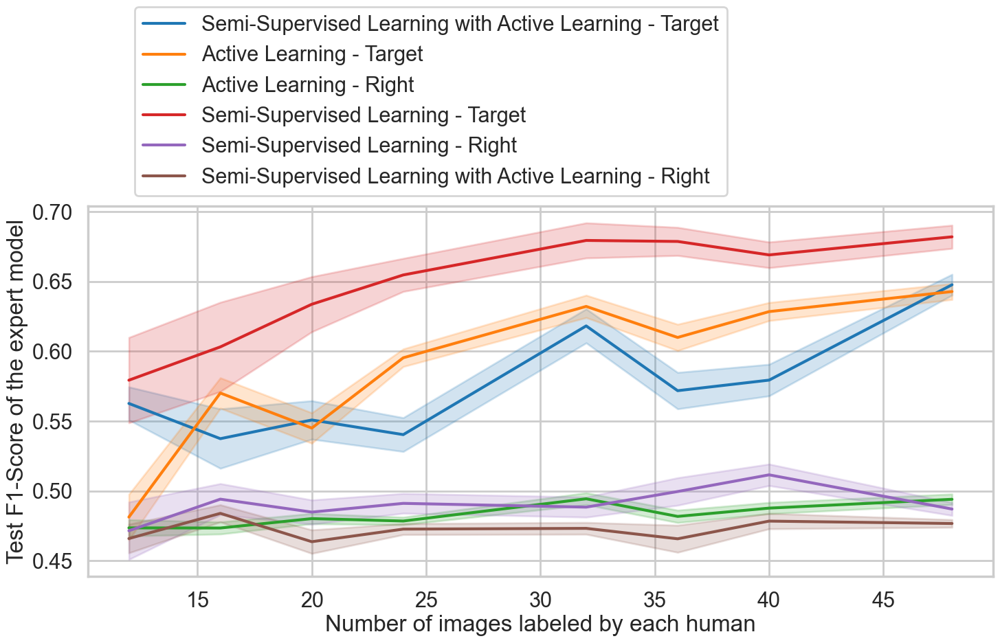

In [522]:
plt.figure()
sns.set_context("poster")
sns.set_style("whitegrid")
f, ax = plt.subplots(figsize=wide_format)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test F1-Score of the expert model")
plt.legend(loc='lower left', bbox_to_anchor=(0.04, 1))
leg_texts = ["Semi-Supervised Learning with Active Learning - Target", "Active Learning - Target", "Active Learning - Right", "Semi-Supervised Learning - Target", "Semi-Supervised Learning - Right", "Semi-Supervised Learning with Active Learning - Right"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/expert_model/model_f1t.png", bbox_inches="tight")

In [514]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "expert_predict", "labeled"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["labeled"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
#a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting", "expert_predict"], columns="labeled", values=["mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/expert_model/overall_setting_acc.csv")
pivoted_df

setting expert_predict      mean                                \
labeled                             12.0      16.0      20.0      24.0   
0            AL          right  0.473499  0.473405  0.480138  0.478419   
1            AL         target  0.481214  0.570117  0.545007  0.595361   
2           SSL          right  0.471438  0.494074  0.484802  0.491062   
3           SSL         target  0.579298  0.603155  0.633713  0.654700   
4        SSL_AL          right  0.465860  0.483904  0.463600  0.472621   
5        SSL_AL         target  0.562643  0.537408  0.550800  0.540301   

                                                      std                      \
labeled      32.0      36.0      40.0      48.0      12.0      16.0      20.0   
0        0.494348  0.481716  0.487655  0.493979  0.040407  0.030115  0.036273   
1        0.632158  0.609931  0.628445  0.642811  0.115625  0.075451  0.108040   
2        0.488363  0.499535  0.511495  0.486990  0.100807  0.054491  0.060161   
3        0.679426  0.678704  0.669062  0.682017  0.156011  0.156616  0.139619   
4        0.473153  0.465675  0.478351  0.476644  0.071244  0.042396  0.082611   
5        0.618192  0.571789  0.579362  0.647695  0.198331  0.190439  0.175398   

                                                           
labeled      24.0      32.0      36.0      40.0      48.0  
0        0.032571  0.041868  0.043452  0.048415  0.052385  
1        0.075842  0.078378  0.092334  0.077932  0.079291  
2        0.059955  0.050026  0.068343  0.065488  0.045191  
3        0.100668  0.087239  0.069791  0.078256  0.081254  
4        0.047286  0.041356  0.094985  0.066306  0.038117  
5        0.187823  0.137849  0.165226  0.169387  0.118917

In [535]:
pivoted_df.loc[[4, 2],["mean", "std"]].pct_change()["mean"].mean(axis=1)*100

4         NaN
2    3.919908
dtype: float64

In [505]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["overlap"] == 100]
dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

#dff = dff[dff["labeler_id"] == 4295342357]
#dff = dff[dff["labeler_id"] == 4295354117]
#dff = dff[dff["labeler_id"] == 4295349121]
#dff = dff[dff["labeler_id"] == 4323195249]
#dff = dff[dff["labeler_id"] == 4295232296]

In [198]:
#dff[dff["setting"] == "SSL_AL"]["value"].hist()
print(scipy.stats.normaltest(dff[dff["setting"] == "SSL_AL"]["value"]))
print(scipy.stats.normaltest(dff[dff["setting"] == "SSL"]["value"]))
print(scipy.stats.normaltest(dff[dff["setting"] == "AL"]["value"]))

NormaltestResult(statistic=298.118853977424, pvalue=1.8378640517841799e-65)
NormaltestResult(statistic=20.406478638468304, pvalue=3.705010696306075e-05)
NormaltestResult(statistic=92.7827009591348, pvalue=7.120204687873918e-21)


<Figure size 640x480 with 0 Axes>

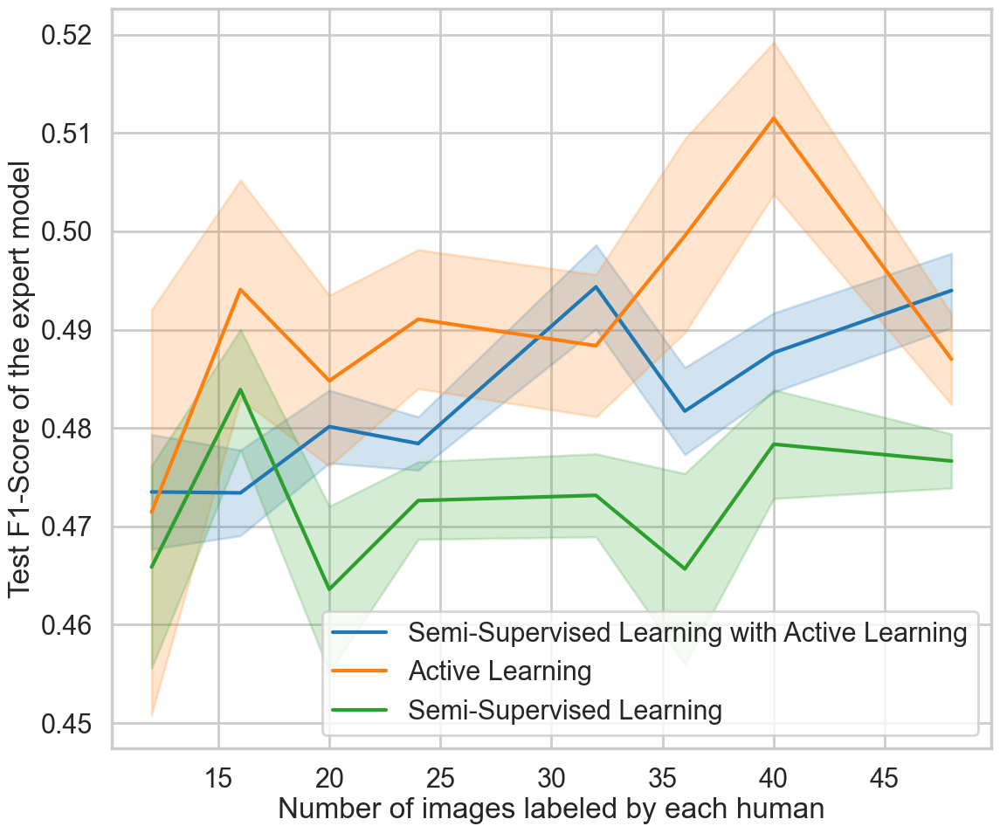

In [510]:
plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=small_format)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict", "overlap", "sample_equal"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test F1-Score of the expert model")
plt.legend(loc='lower right')
leg_texts = ["Semi-Supervised Learning with Active Learning", "Active Learning", "Semi-Supervised Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/expert_model/model_f1_target.png", bbox_inches="tight")

In [174]:
dff

,variable,value,run,group,expert_predict,labeler_ids,al_labels,init_size,labels_per_round,labeled,rounds,overlap,mod,setting,sample_equal,labeler_id
36,End,0.309278,196,196,target,"[4295349121, 4295342357]",1,4,4,12,2,100,confidence,SSL_AL,True,4295342357
37,End,0.337662,196,196,target,"[4295349121, 4295342357]",1,4,4,12,2,100,confidence,SSL_AL,True,4295342357
38,End,0.581818,196,196,target,"[4295349121, 4295342357]",1,4,4,12,2,100,confidence,SSL_AL,True,4295342357
39,End,0.000000,196,196,target,"[4295349121, 4295342357]",1,4,4,12,2,100,confidence,SSL_AL,True,4295342357
40,End,0.000000,196,196,target,"[4295349121, 4295342357]",1,4,4,12,2,100,confidence,SSL_AL,True,4295342357
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4080,End,0.588082,795,795,target,"[4323195249, 4295232296]",0,32,8,48,2,100,ssl,SSL,True,4295232296
4089,End,0.761613,798,798,target,"[4323195249, 4295232296]",0,32,8,48,2,100,disagreement_diff,SSL_AL,True,4295232296
4090,End,0.395448,798,798,target,"[4323195249, 4295232296]",0,32,8,48,2,100,disagreement_diff,SSL_AL,True,4295232296
4091,End,0.568276,798,798,target,"[4323195249, 4295232296]",0,32,8,48,2,100,disagreement_diff,SSL_AL,True,4295232296


In [215]:
from scipy.stats import iqr

a = dff.groupby(["expert_predict", "setting", "labeler_id", "labeled"])["value"].agg([np.median, iqr])#.mean()
a = a.reset_index()

a = a[a["labeled"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]

#pivoted_df = a.pivot_table(index=["labeler_id", "expert_predict", "setting", ], columns="labeled", values=["mean", "std"])
pivoted_df = a.pivot_table(index=["expert_predict", "setting", ], columns="labeled", values=["median", "iqr"])


# Reset index again if needed
pivoted_df = pivoted_df.reset_index()
#pivoted_df.to_csv("../../tables/NIH/expert_model/expert_f1_target.csv")
pivoted_df

expert_predict setting       iqr                                \
labeled                               12        16        20        24   
0                right      AL  0.006548  0.009016  0.025245  0.026582   
1                right     SSL  0.082434  0.040719  0.060471  0.074016   
2                right  SSL_AL  0.021572  0.027610  0.015113  0.019629   
3               target      AL  0.132439  0.084548  0.107126  0.092143   
4               target     SSL  0.141368  0.097189  0.078620  0.101425   
5               target  SSL_AL  0.151912  0.195770  0.139136  0.164149   

                                                   median                      \
labeled        32        36        40        48        12        16        20   
0        0.034353  0.029993  0.030467  0.037854  0.467557  0.467816  0.468982   
1        0.039277  0.041276  0.059504  0.036419  0.482004  0.497036  0.483970   
2        0.018417  0.019278  0.024649  0.018839  0.470925  0.469166  0.469536   
3        0.098086  0.098945  0.094712  0.087636  0.499283  0.575984  0.567110   
4        0.069232  0.065001  0.060722  0.072538  0.601064  0.642126  0.661318   
5        0.114007  0.132199  0.144746  0.093028  0.585222  0.575831  0.605444   

                                                           
labeled        24        32        36        40        48  
0        0.468613  0.487690  0.467550  0.470931  0.483275  
1        0.480562  0.482404  0.489715  0.493645  0.478846  
2        0.467322  0.466645  0.470182  0.474907  0.471102  
3        0.594586  0.636268  0.618068  0.643537  0.647283  
4        0.665581  0.698129  0.686973  0.675913  0.686929  
5        0.591907  0.649382  0.622737  0.615990  0.669024

In [186]:
a = dff.groupby(["expert_predict", "setting", "labeler_id", "labeled"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()

a = a[a["labeled"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]

#pivoted_df = a.pivot_table(index=["labeler_id", "expert_predict", "setting", ], columns="labeled", values=["mean", "std"])
pivoted_df = a.pivot_table(index=["expert_predict", "setting", ], columns="labeled", values=["mean", "std"])


# Reset index again if needed
pivoted_df = pivoted_df.reset_index()
#pivoted_df.to_csv("../../tables/NIH/expert_model/expert_f1_target.csv")
pivoted_df
#a.to_excel("../experts.xlsx")#.reset_index()
#a.reset_index().pivot_table(columns=["setting", "expert_predict", "labeled"])#set_index("labeled").T#.melt(id_vars=["setting", "expert_predict"], value_name="value")

expert_predict setting      mean                                \
labeled                               12        16        20        24   
0               target      AL  0.491346  0.579279  0.551692  0.599783   
1               target     SSL  0.589643  0.625938  0.644390  0.662544   
2               target  SSL_AL  0.556959  0.558071  0.578025  0.565131   

                                                      std                      \
labeled        32        36        40        48        12        16        20   
0        0.640060  0.621383  0.637253  0.651246  0.104266  0.070470  0.096881   
1        0.685767  0.687408  0.680073  0.690483  0.147183  0.129304  0.109701   
2        0.636168  0.601006  0.600681  0.663425  0.154728  0.137850  0.116327   

                                                           
labeled        24        32        36        40        48  
0        0.070838  0.065388  0.076171  0.064514  0.061939  
1        0.080775  0.066413  0.055065  0.052191  0.053057  
2        0.134026  0.090863  0.099180  0.113944  0.078950

In [168]:
pivoted_df.loc[[0, 2],["mean", "std"]].diff()#["mean"].mean(axis=1)

mean                                                              \
labeled        12        16        20        24        32        36        40   
0             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2        0.065613 -0.021208  0.026333 -0.034651 -0.003892 -0.020377 -0.036571   

                       std                                                  \
labeled       48        12       16        20        24        32       36   
0            NaN       NaN      NaN       NaN       NaN       NaN      NaN   
2        0.01218  0.050462  0.06738  0.019446  0.063188  0.025474  0.02301   

                            
labeled       40        48  
0            NaN       NaN  
2        0.04943  0.017011

In [173]:
pivoted_df.loc[[0, 2],["mean", "std"]].pct_change()["mean"]#.mean(axis=1)

labeled,12,16,20,24,32,36,40,48
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.133537,-0.036611,0.047731,-0.057773,-0.006081,-0.032793,-0.057389,0.018702


In [163]:
pivoted_df.loc[[1, 2],["mean", "std"]].diff()

mean                                                              \
labeled        12        16        20        24        32        36        40   
1             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2       -0.032684 -0.067867 -0.066365 -0.097413 -0.049599 -0.086402 -0.079391   

                        std                                                  \
labeled        48        12        16        20       24       32        36   
1             NaN       NaN       NaN       NaN      NaN      NaN       NaN   
2       -0.027057  0.007545  0.008545  0.006626  0.05325  0.02445  0.044115   

                             
labeled        40        48  
1             NaN       NaN  
2        0.061753  0.025893

In [507]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["overlap"] == 100]
dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

<Figure size 640x480 with 0 Axes>

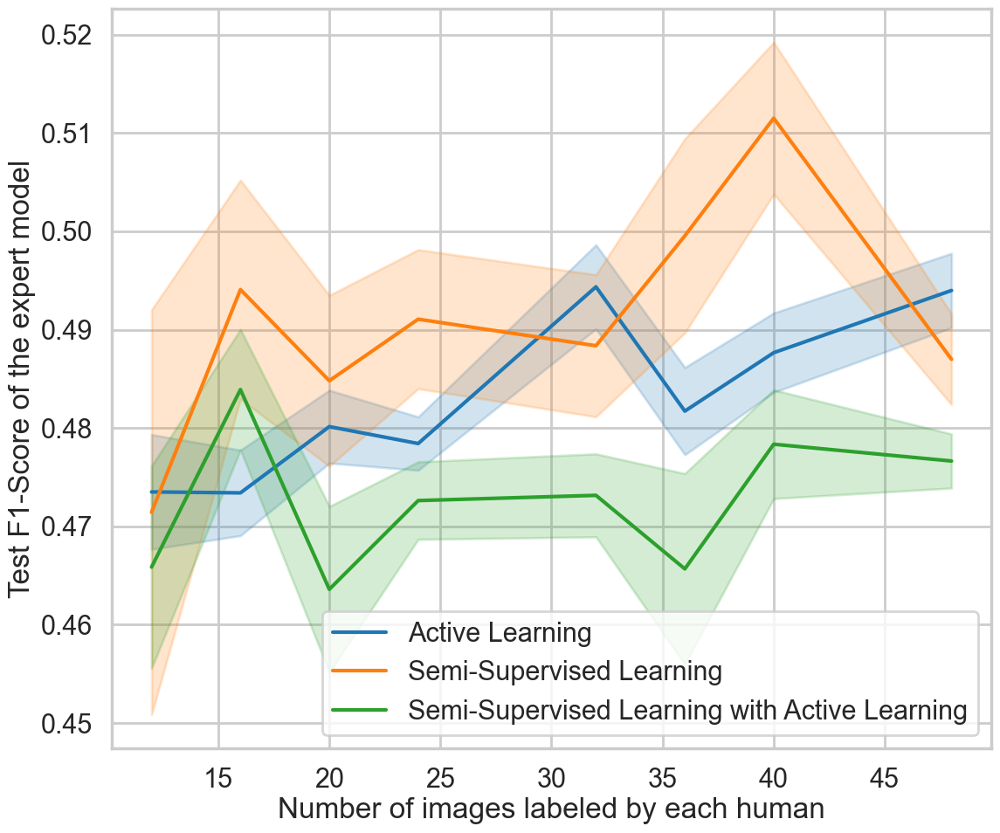

In [508]:
plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=small_format)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test F1-Score of the expert model")
plt.legend(loc='lower right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Active Learning", ]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/expert_model/model_f1_right.png", bbox_inches="tight")

<Figure size 640x480 with 0 Axes>

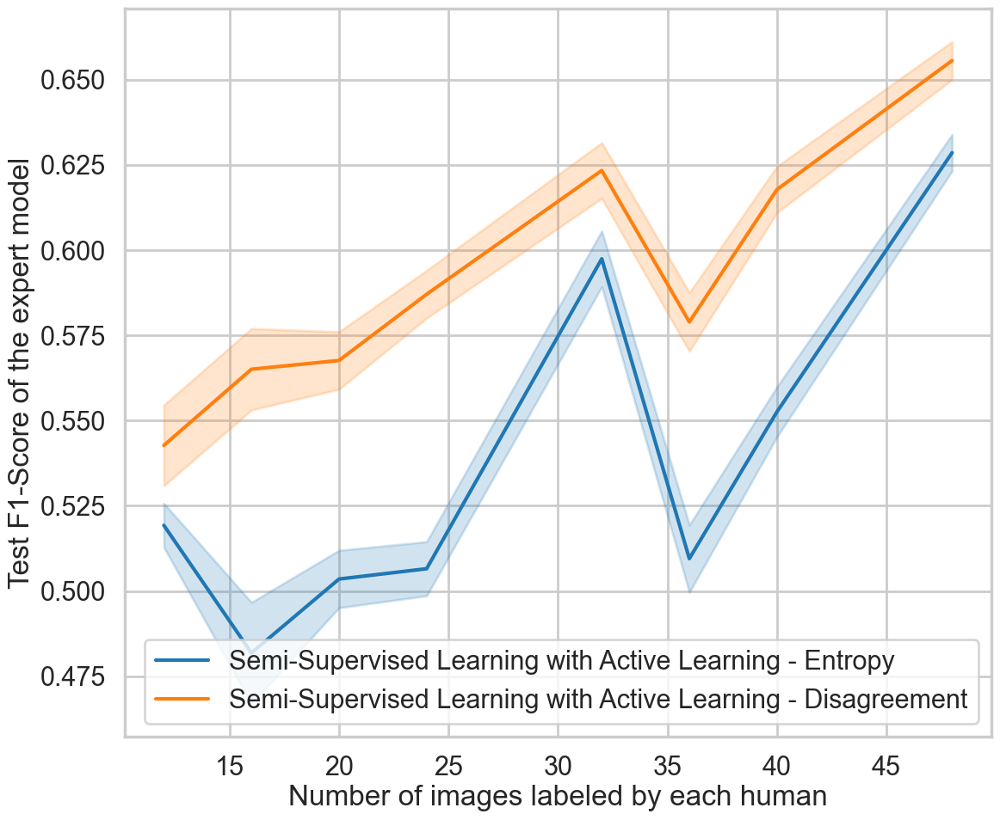

In [540]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] == "SSL_AL"]
#dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

#dff = dff[dff["labeler_id"] == 4295342357]
#dff = dff[dff["labeler_id"] == 4295354117]
#dff = dff[dff["labeler_id"] == 4295349121]
#dff = dff[dff["labeler_id"] == 4323195249]
#dff = dff[dff["labeler_id"] == 4295232296]

plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=small_format)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict", "mod"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test F1-Score of the expert model")
plt.legend(loc='lower right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/expert_model/model_f1_target_strategy.png", bbox_inches="tight")

<Figure size 640x480 with 0 Axes>

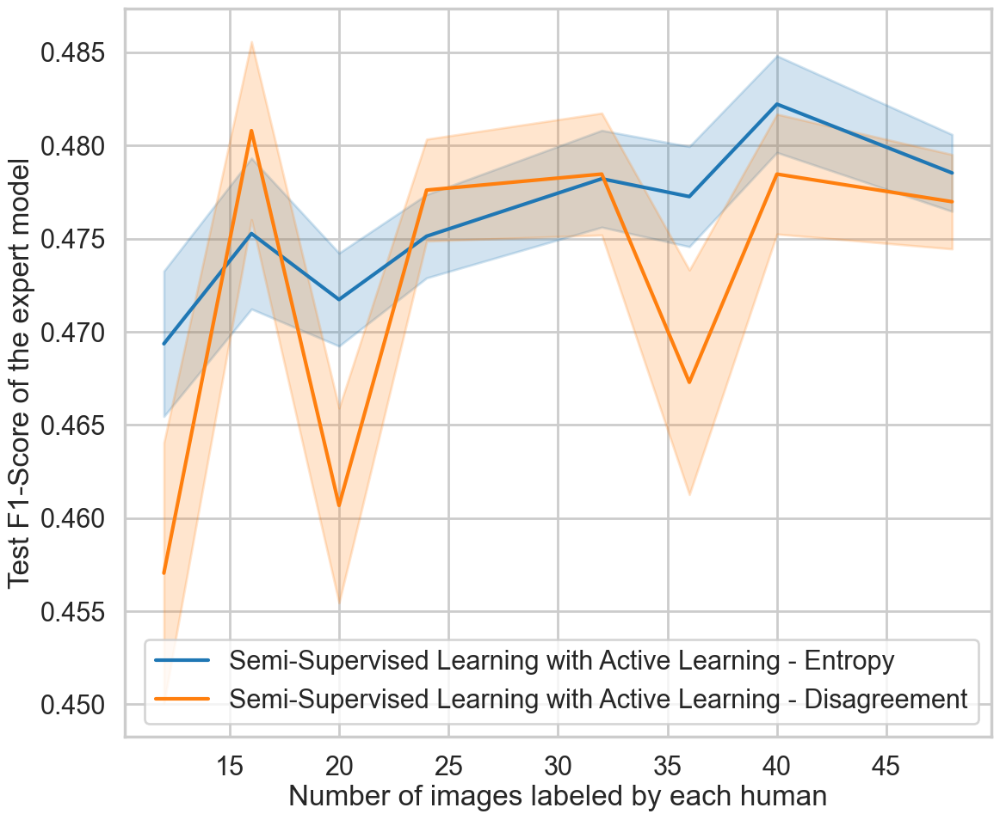

In [539]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] == "SSL_AL"]
#dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

#dff = dff[dff["labeler_id"] == 4295342357]
#dff = dff[dff["labeler_id"] == 4295354117]
#dff = dff[dff["labeler_id"] == 4295349121]
#dff = dff[dff["labeler_id"] == 4323195249]
#dff = dff[dff["labeler_id"] == 4295232296]

plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=small_format)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict", "mod"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test F1-Score of the expert model")
plt.legend(loc='lower right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/expert_model/model_f1_right_strategy.png", bbox_inches="tight")

In [538]:
from scipy.stats import iqr

dff = df.copy()
dff = dff[dff["variable"] == "End"]
#dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] == "SSL_AL"]
#dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]

a = dff.dropna().groupby(["setting", "expert_predict", "mod", "labeled"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["labeled"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
#a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting", "mod", "expert_predict"], columns="labeled", values=["mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/expert_model/al_strategy_acc.csv")
pivoted_df

setting                mod expert_predict      mean            \
labeled                                                12.0      16.0   
0        SSL_AL         confidence          right  0.469354  0.475268   
1        SSL_AL         confidence         target  0.519273  0.481872   
2        SSL_AL  disagreement_diff          right  0.457045  0.480792   
3        SSL_AL  disagreement_diff         target  0.542724  0.565053   

                                                                          std  \
labeled      20.0      24.0      32.0      36.0      40.0      48.0      12.0   
0        0.471726  0.475125  0.478209  0.477253  0.482214  0.478522  0.038218   
1        0.503530  0.506551  0.597441  0.509516  0.552553  0.628545  0.228571   
2        0.460677  0.477601  0.478461  0.467285  0.478460  0.476977  0.068557   
3        0.567621  0.587031  0.623332  0.578923  0.617736  0.655563  0.115946   

                                                                               
labeled      16.0      20.0      24.0      32.0      36.0      40.0      48.0  
0        0.039660  0.034603  0.037950  0.035993  0.037237  0.042148  0.035951  
1        0.221963  0.218275  0.205474  0.150062  0.208392  0.180434  0.135078  
2        0.046810  0.072413  0.046402  0.045350  0.083475  0.052292  0.044174  
3        0.116963  0.116748  0.118579  0.112885  0.119014  0.110187  0.097059

In [543]:
pivoted_df.loc[[2, 0],["mean", "std"]].pct_change()["mean"].mean(axis=1)*100

2         NaN
0    0.826627
dtype: float64

<Figure size 640x480 with 0 Axes>

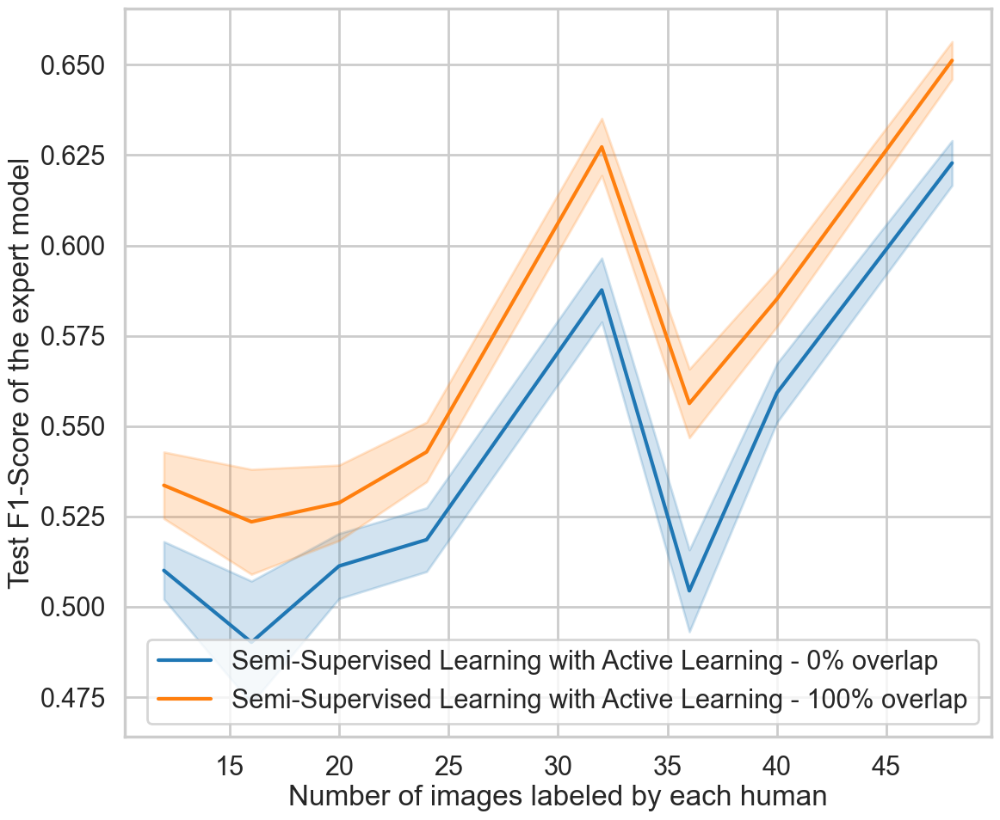

In [472]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] == "SSL_AL"]
#dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

#dff = dff[dff["labeler_id"] == 4295342357]
#dff = dff[dff["labeler_id"] == 4295354117]
#dff = dff[dff["labeler_id"] == 4295349121]
#dff = dff[dff["labeler_id"] == 4323195249]
#dff = dff[dff["labeler_id"] == 4295232296]

plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=small_format)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict", "overlap"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test F1-Score of the expert model")
plt.legend(loc='lower right')
leg_texts = ["Semi-Supervised Learning with Active Learning - 0% overlap", "Semi-Supervised Learning with Active Learning - 100% overlap"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/expert_model/model_f1_target_overlap.png", bbox_inches="tight")

<Figure size 640x480 with 0 Axes>

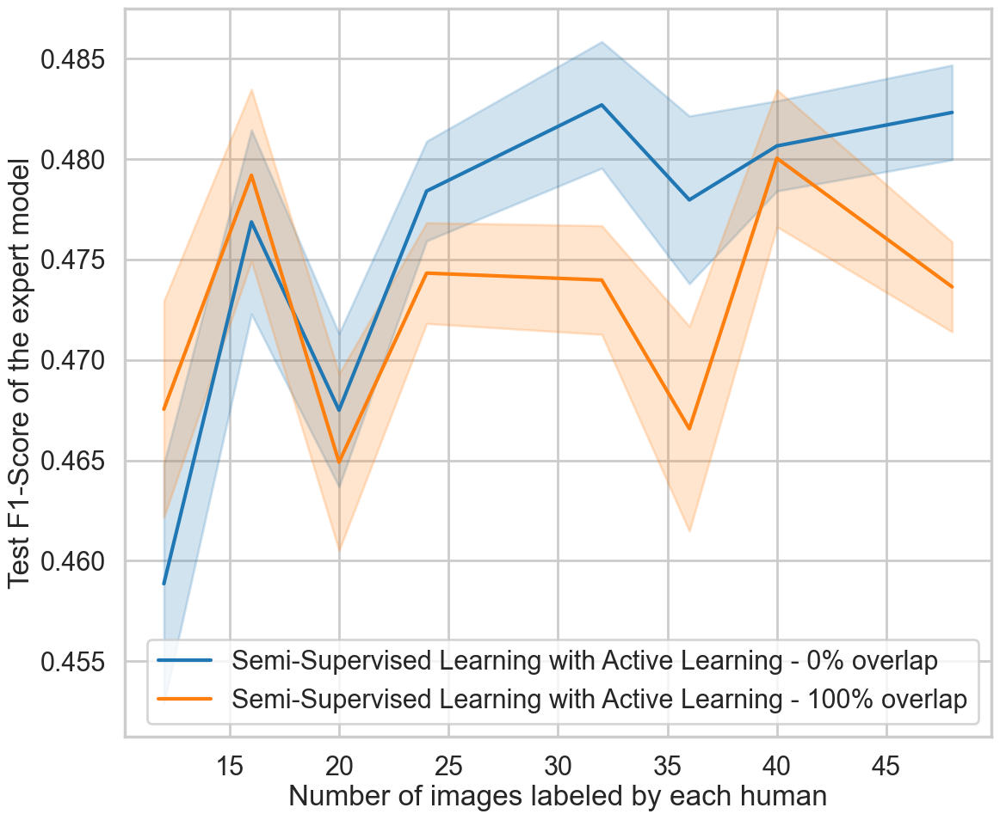

In [477]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] == "SSL_AL"]
#dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

#dff = dff[dff["labeler_id"] == 4295342357]
#dff = dff[dff["labeler_id"] == 4295354117]
#dff = dff[dff["labeler_id"] == 4295349121]
#dff = dff[dff["labeler_id"] == 4323195249]
#dff = dff[dff["labeler_id"] == 4295232296]

plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=small_format)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "overlap"]].apply(tuple, axis=1), hue_order=[("SSL_AL", 0), ("SSL_AL", 100)], 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test F1-Score of the expert model")
plt.legend(loc='lower right')
leg_texts = ["Semi-Supervised Learning with Active Learning - 0% overlap", "Semi-Supervised Learning with Active Learning - 100% overlap"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/expert_model/model_f1_target_overlap.png", bbox_inches="tight")

<Figure size 640x480 with 0 Axes>

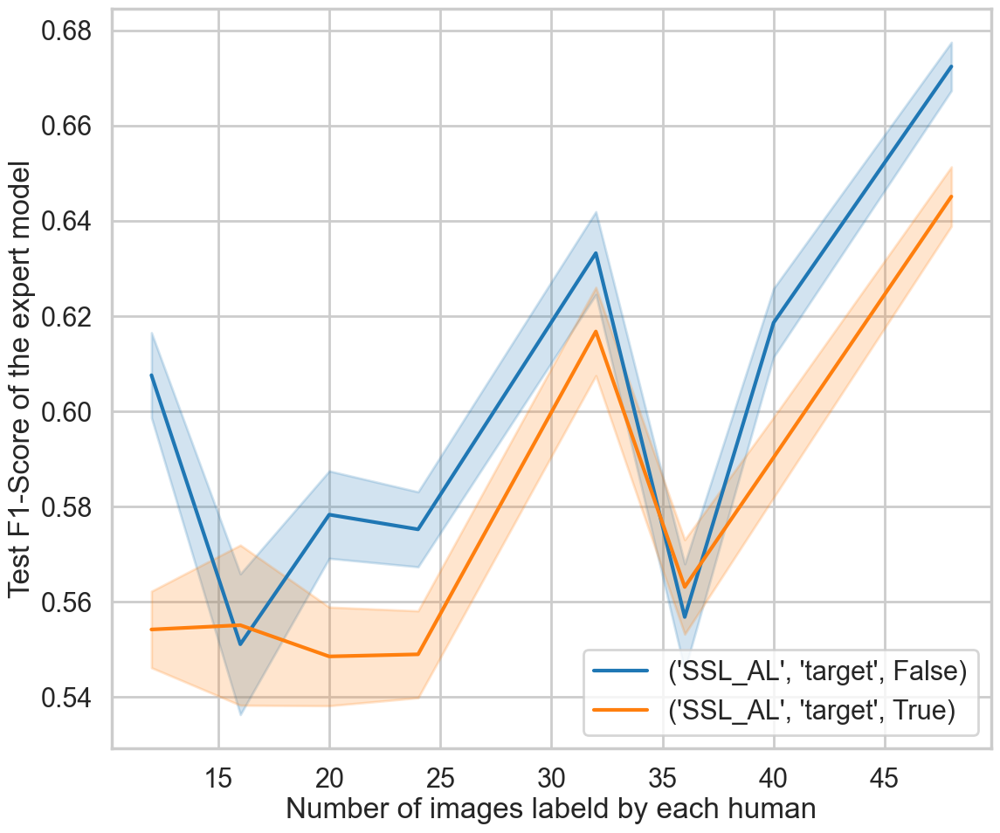

In [28]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] == "SSL_AL"]
#dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

#dff = dff[dff["labeler_id"] == 4295342357]
#dff = dff[dff["labeler_id"] == 4295354117]
#dff = dff[dff["labeler_id"] == 4295349121]
#dff = dff[dff["labeler_id"] == 4323195249]
#dff = dff[dff["labeler_id"] == 4295232296]

plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=small_format)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test F1-Score of the expert model")
plt.legend(loc='lower right')
#leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
#plt.savefig("../../images/NIH/expert_model/model_f1_target_strategy.png", bbox_inches="tight")

<Figure size 640x480 with 0 Axes>

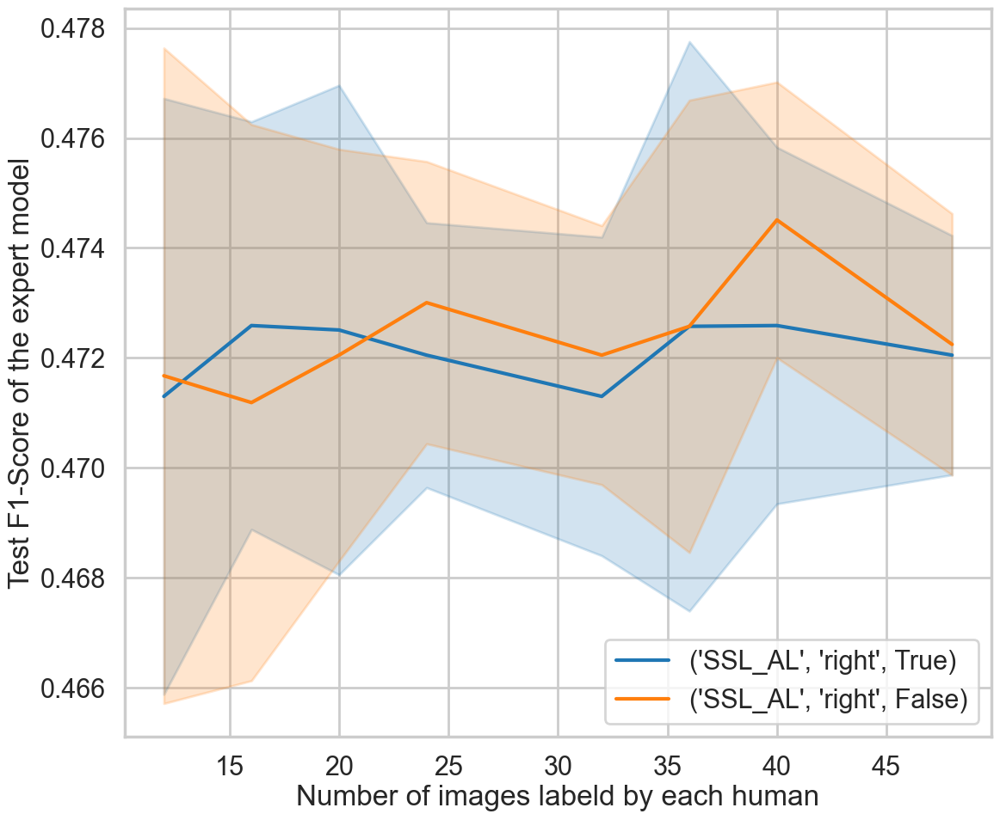

In [29]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] == "SSL_AL"]
#dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

#dff = dff[dff["labeler_id"] == 4295342357]
#dff = dff[dff["labeler_id"] == 4295354117]
#dff = dff[dff["labeler_id"] == 4295349121]
#dff = dff[dff["labeler_id"] == 4323195249]
#dff = dff[dff["labeler_id"] == 4295232296]

plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=small_format)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test F1-Score of the expert model")
plt.legend(loc='lower right')
#leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
#plt.savefig("../../images/NIH/expert_model/model_f1_target_strategy.png", bbox_inches="tight")

In [478]:
dfs = []
for labeler_id in [4295342357, 4295354117, 4295349121, 4323195249, 4295232296]:

    var_columns = []
    cut_out = [("setting", "PERFECT")]

    df_plot, df_runs = expertMetrics.create_plot_df_grouped(labeler_id, "Test", "fpr", var_columns=var_columns, unwanted_tuples=cut_out)
    
    df = df_plot#[df_plot["variable"] == "End"]
    df = df.join(df_runs, on="group")
    
    df["labeler_id"] = labeler_id
    
    dfs.append(df.copy())
    
    print(labeler_id)
    
df = dfs[0]

for temp_df in range(1, len(dfs)):
    df = pd.concat([df, dfs[temp_df]])
    
df.head()

0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected

,variable,value,run,group,expert_predict,labeler_ids,al_labels,init_size,labels_per_round,labeled,rounds,overlap,mod,setting,sample_equal,labeler_id
0,End,0.474453,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
1,End,0.090909,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
2,End,0.035971,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
3,End,0.162162,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
4,End,0.010000,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357


In [51]:
df

,variable,value,run,group,expert_predict,labeler_ids,al_labels,init_size,labels_per_round,labeled,rounds,overlap,mod,setting,sample_equal,labeler_id
0,End,0.474453,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
1,End,0.090909,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
2,End,0.035971,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
3,End,0.162162,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
4,End,0.010000,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9669,Start,0.458333,1287,1287,target,"[4323195249, 4295232296]",0,32,8,48,2,100,disagreement_diff,SSL_AL,False,4295232296
9670,Start,0.565217,1288,1288,right,"[4323195249, 4295232296]",0,32,8,48,2,100,disagreement_diff,SSL_AL,False,4295232296
9671,Start,0.500000,1288,1288,right,"[4323195249, 4295232296]",0,32,8,48,2,100,disagreement_diff,SSL_AL,False,4295232296
9672,Start,1.000000,1288,1288,right,"[4323195249, 4295232296]",0,32,8,48,2,100,disagreement_diff,SSL_AL,False,4295232296


In [483]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] == "SSL_AL"]
#dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]

dff[dff["value"] >= 0]["value"].median()

1.0

<Figure size 640x480 with 0 Axes>

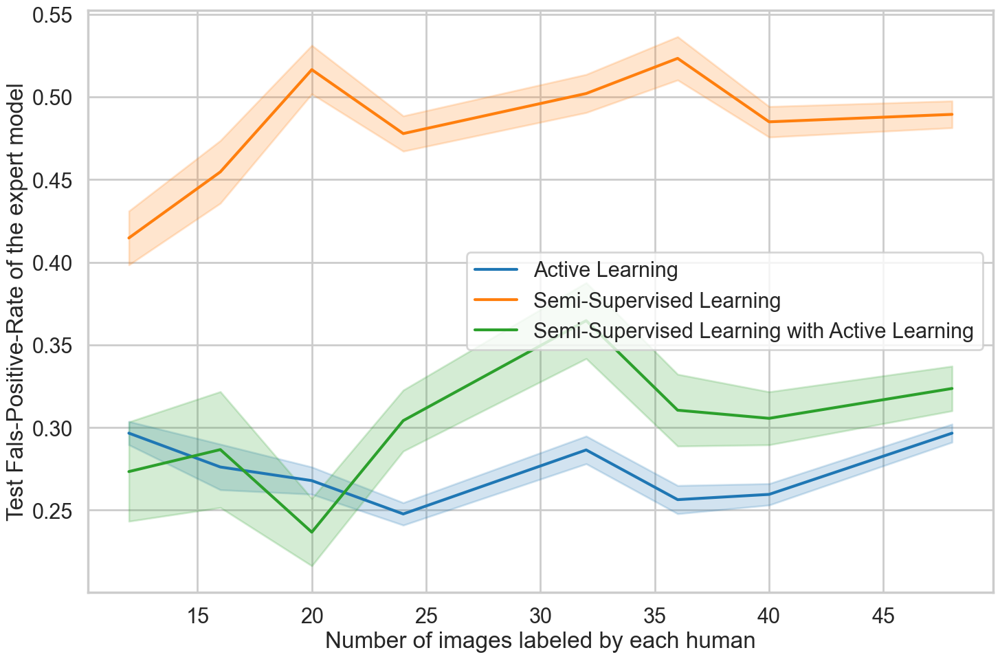

In [497]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["value"] >= 0]
#dff = dff[dff["setting"] == "SSL_AL"]
#dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

#dff = dff[dff["labeler_id"] == 4295342357]
#dff = dff[dff["labeler_id"] == 4295354117]
#dff = dff[dff["labeler_id"] == 4295349121]
#dff = dff[dff["labeler_id"] == 4323195249]
#dff = dff[dff["labeler_id"] == 4295232296]

plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=wide_format_h)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Fals-Positive-Rate of the expert model")
plt.legend()
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/expert_model/model_fpr_target.png", bbox_inches="tight")

<Figure size 640x480 with 0 Axes>

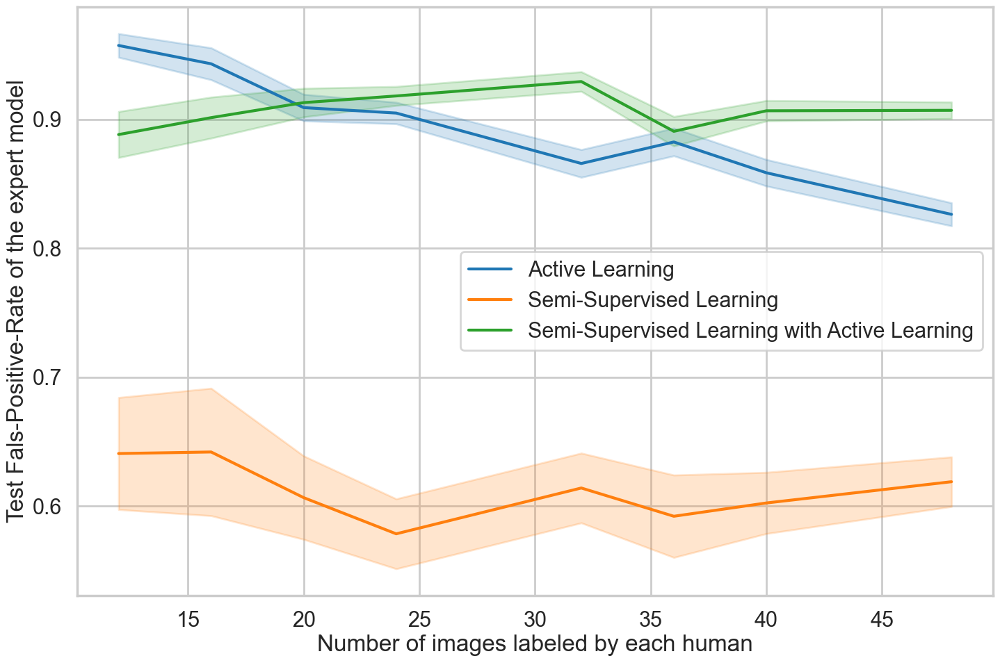

In [498]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["value"] >= 0]
#dff = dff[dff["setting"] == "SSL_AL"]
#dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

#dff = dff[dff["labeler_id"] == 4295342357]
#dff = dff[dff["labeler_id"] == 4295354117]
#dff = dff[dff["labeler_id"] == 4295349121]
#dff = dff[dff["labeler_id"] == 4323195249]
#dff = dff[dff["labeler_id"] == 4295232296]

plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=wide_format_h)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Fals-Positive-Rate of the expert model")
plt.legend()
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/expert_model/model_fpr_right.png", bbox_inches="tight")

In [499]:
from scipy.stats import iqr

dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["value"] >= 0]
#dff = dff[dff["setting"] == "SSL_AL"]
#dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]

a = dff.dropna().groupby(["setting", "expert_predict", "labeled"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()
b = dfff.dropna().groupby(["setting", "group"])["value"].agg(["mean", "std"])#.mean()
b["mod"] = "perfect"
b["expert_predict"] = "perfect"
b["overlap"] = "perfect"
b["sample_equal"] = "perfect"
b = b.reset_index()

a = pd.concat([a, b])

a = a[a["labeled"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
#a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting", "expert_predict"], columns="labeled", values=["mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/expert_model/overall_setting_fpr.csv")
pivoted_df

setting expert_predict      mean                                \
labeled                             12.0      16.0      20.0      24.0   
0            AL          right  0.957365  0.943147  0.909171  0.904932   
1            AL         target  0.414648  0.454609  0.516456  0.477797   
2           SSL          right  0.640812  0.642026  0.606607  0.578538   
3           SSL         target  0.273355  0.286658  0.236730  0.304189   
4        SSL_AL          right  0.888256  0.901380  0.913023  0.918209   
5        SSL_AL         target  0.296612  0.276138  0.267896  0.247741   

                                                      std                      \
labeled      32.0      36.0      40.0      48.0      12.0      16.0      20.0   
0        0.865824  0.882497  0.858599  0.826355  0.110048  0.121341  0.156893   
1        0.502024  0.523277  0.484898  0.489407  0.296693  0.200582  0.246822   
2        0.614083  0.592162  0.602466  0.618950  0.368694  0.342495  0.342490   
3        0.364656  0.310488  0.305568  0.323621  0.315095  0.280450  0.252763   
4        0.929378  0.890780  0.906708  0.907053  0.247226  0.220421  0.217468   
5        0.286449  0.256397  0.259575  0.296593  0.259814  0.246763  0.241848   

                                                           
labeled      24.0      32.0      36.0      40.0      48.0  
0        0.141309  0.149009  0.148798  0.174388  0.175380  
1        0.190987  0.159773  0.188948  0.161383  0.158894  
2        0.325408  0.265017  0.313128  0.284959  0.266506  
3        0.244933  0.224916  0.229941  0.202856  0.187223  
4        0.176214  0.148952  0.224302  0.181954  0.158519  
5        0.210217  0.192459  0.215915  0.191063  0.168080

In [83]:
dff = df.copy()
dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["overlap"] == 0]
dff = dff[dff["sample_equal"] == False]

<Figure size 640x480 with 0 Axes>

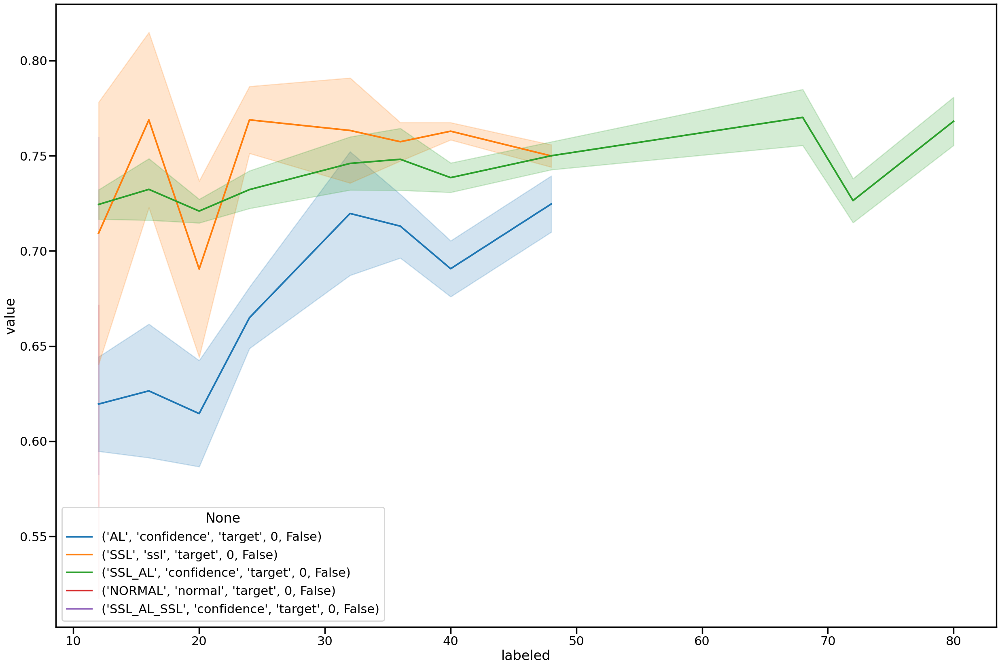

In [84]:
plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=(30, 20))
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "mod", "expert_predict", "overlap", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)

In [ ]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
#dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]
#dff = dff[dff["labeler_ids"] != "[4323195249, 4295232296]"]
#dff = dff[dff["labeler_ids"] != "[4295349121, 4295342357]"]
dff = dff[dff["mod"] != "disagreement_diff"]
#dff = df[df["expert_predict"] == "right"].reset_index()
dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Active Learning", "Supervised"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)

In [ ]:
var_columns = ["sample_equal", "overlap", "rounds", "init_size", "labels_per_round"]
cut_out = [("expert_predict", "right"), ("mod", "disagreement_diff")]


df_plot, df_runs = expertMetrics.create_plot_df_grouped(4295349121, "Test", "accurancy", var_columns=var_columns, unwanted_tuples=cut_out)

plt.figure()
f, ax = plt.subplots(figsize=(25, 11))
sns.boxplot(df_plot, x="group", y="value", hue="variable", hue_order=["Start", "End"], ax=ax)

df_runs.head(30)

In [23]:
df_runs

,labeled
4,12
24,20
40,36
45,16
50,24
60,40
74,68
153,72
161,32
169,48


,labeled
4,12
45,16
24,20
50,24
161,32
40,36
60,40
169,48
74,68
153,72


<Figure size 640x480 with 0 Axes>

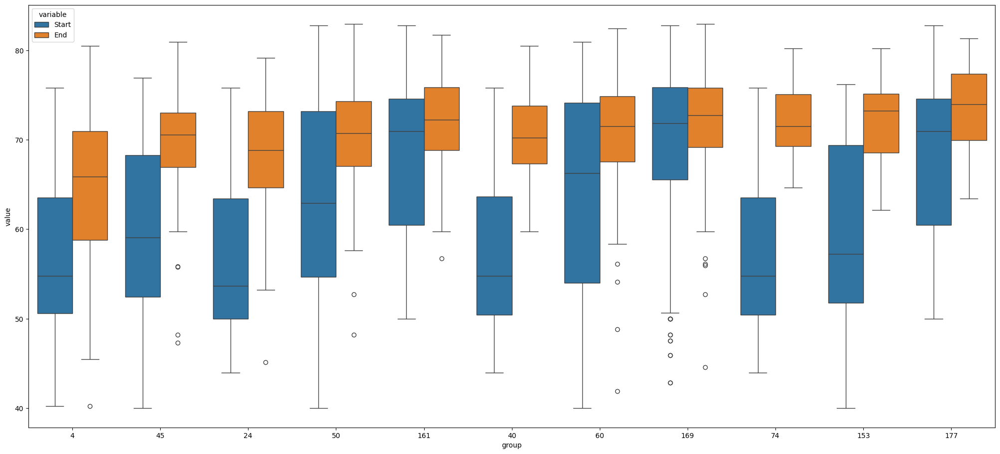

In [21]:
var_columns = ["sample_equal", "overlap", "rounds", "init_size", "labels_per_round"]
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
fix_columns = [("setting", "SSL_AL"), ("expert_predict", "target"), ("mod", "confidence")]#, ("labeler_ids", "[4323195249, 4295232296]")]


df_plot, df_runs = expertMetrics.create_plot_df_grouped_hue(4323195249, "Test", "accurancy", var_columns=var_columns, fix_columns=fix_columns)

sort_index = df_runs.sort_values(by=["labeled"]).index

plt.figure()
f, ax = plt.subplots(figsize=(25, 11))
sns.boxplot(df_plot, x="group", y="value", hue="variable", hue_order=["Start", "End"], ax=ax, order=sort_index)

df_runs.sort_values(by=["labeled"]).head(100)

In [ ]:
var_columns = ["sample_equal", "overlap", "rounds", "init_size", "labels_per_round"]
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
fix_columns = [("setting", "SSL_AL"), ("expert_predict", "target"), ("mod", "confidence")]


df_plot, df_runs = expertMetrics.create_plot_df_grouped_hue(4295232296, "Test", "accurancy", var_columns=var_columns, fix_columns=fix_columns)

sort_index = df_runs.sort_values(by=["labeled"]).index

plt.figure()
f, ax = plt.subplots(figsize=(25, 11))
sns.boxplot(df_plot, x="group", y="value", hue="variable", hue_order=["Start", "End"], ax=ax, order=sort_index)

df_runs.sort_values(by=["labeled"]).head(100)

In [ ]:
def create_expert_metrics(met):
    metrics = {}
    for expert_id in met[0]:
        metrics[expert_id] = []
        for run in met:
            start_metrics = {}
            end_metrics = {}
            for seed_fold, value in run[expert_id].items():
                if "Start" in value:
                    start_metrics[seed_fold] = value["Start"]
                end_metrics[seed_fold] = value["End"]
            if len(start_metrics) == 0:
                start_metrics = end_metrics
            metrics[expert_id].append({
                "Start": start_metrics,
                "End": end_metrics
            })
    return metrics

In [ ]:
create_expert_metrics(expertMetrics.get_expert_values("Test", "f1"))

In [ ]:
get_expert_df(create_expert_metrics(expertMetrics.get_expert_values("Test", "f1")), 4323195249)

In [ ]:
import matplotlib.pyplot as plt

def get_expert_values(step, metric_name):

    mett = []
    for element in metrics2:
        met = {}
        for seed, value1 in element["expert metrics"].items():
            for fold, value2 in value1.items():
                for expert, value3 in value2.items():
                    if expert not in met:
                        met[expert] = {}
                    met[expert][f"Seed_{seed}_Fold_{fold}"] = {}
                    met[expert][f"Seed_{seed}_Fold_{fold}"]["End"] = value3[step]["End"][metric_name]
                    if "Start" in value3[step]:
                        met[expert][f"Seed_{seed}_Fold_{fold}"]["Start"] = value3[step]["Start"][metric_name]
                    else:
                        pass
        mett.append(met)
    return mett

def get_single_values(met, run, expert_id, step):
    values = []
    for key, value in met[run][expert_id].items():
        values.append(value[step])
    return values

def plot_expert_values(met):
    df1 = pd.DataFrame(met[4323195249])
    df2 = pd.DataFrame(met[4295232296])

    fd1 = df1.T.reset_index()
    fd1["expert"] = 4323195249
    fd2 = df2.T.reset_index()
    fd2["expert"] = 4295232296
    df3 = pd.concat([fd1, fd2])
    df3 = df3.melt(id_vars=["index", "expert"])

    plt.figure()
    sns.boxplot(df3, x="expert", y="value",
            hue="variable",)

In [ ]:
met = get_expert_values("Val", "accurancy_balanced")

plot_expert_values(met[2])
plot_expert_values(met[1])
df_runs

In [ ]:
met = get_expert_values("Val", "accurancy_balanced")

In [ ]:
def create_expert_metrics(met):
    metrics = {}
    for expert_id in met[0]:
        metrics[expert_id] = []
        for run in met:
            start_metrics = {}
            end_metrics = {}
            for seed_fold, value in run[expert_id].items():
                if "Start" in value:
                    start_metrics[seed_fold] = value["Start"]
                end_metrics[seed_fold] = value["End"]
            if len(start_metrics) == 0:
                start_metrics = end_metrics
            metrics[expert_id].append({
                "Start": start_metrics,
                "End": end_metrics
            })
    return metrics

def get_expert_df(metrics, expert_id, start=False):
    if start:
        df1 = pd.DataFrame([row["Start"] for row in metrics[expert_id]]).reset_index().melt(id_vars=['index'], var_name='seed_fold', value_name='start')
    df2 = pd.DataFrame([row["End"] for row in metrics[expert_id]]).reset_index().melt(id_vars=['index'], var_name='seed_fold', value_name='end')

    if start:
        df_final = df1
        df_final["end"] = df2["end"]
    else:
        df_final = df2
    df_final = df_final.melt(id_vars=["index", "seed_fold"], var_name="step")

    return df_final

def plot_expert_runs_al(metrics, expert_id, step, metrics_name):
    met = get_expert_values(step, metrics_name)
    df = get_expert_df(create_expert_metrics(met), expert_id, start=True)
    plt.figure()
    f, ax = plt.subplots(figsize=(25, 11))
    sns.boxplot(df, x="index", y="value", hue="step", ax=ax)

def plot_expert_runs_end(metrics, expert_id, step, metrics_name):
    met = get_expert_values(step, metrics_name)
    df = get_expert_df(create_expert_metrics(met), expert_id)
    plt.figure()
    f, ax = plt.subplots(figsize=(25, 11))
    sns.boxplot(df, x="index", y="value", ax=ax)

In [ ]:
plot_expert_runs_al(metrics, 4323195249, "Test", "accurancy_balanced")

In [ ]:
plot_expert_runs_end(metrics, 4323195249, "Val", "accurancy_balanced")

In [ ]:
from zipfile import ZipFile as zipfile

with zipfile("../../Metrics_Folder/NIH/Metrics_1013.zip", 'r') as zip: 
    # printing all the contents of the zip file 
    zip.printdir() 
  
    # extracting all the files 
    print('Extracting all the files now...') 
    zip.extractall("../../Metrics_Folder/NIH/") 
    print('Done!') 

In [ ]:
with open("../../Metrics_Folder/NIH/Metrics_688.pickle", 'rb') as handle:
    metrics = pickle.load(handle)

In [ ]:
runs = pd.DataFrame(metrics).drop(["expert metrics", "verma", "hemmer", "artificial expert predictions"], axis=1)

In [ ]:
remove_index = []
for i in range(len(metrics)):
    if metrics[i]["mod"] == "disagreement_diff":
        remove_index.append(i)

In [ ]:
for i in remove_index[::-1]:
    del metrics[i]

In [ ]:
with open("../Metrics_Folder/Metrics_700.pickle", 'wb') as handle:
    pickle.dump(metrics, handle, protocol=pickle.HIGHEST_PROTOCOL)